1. 이미지 resize: 640x640
2. 사용모델: mask rcnn by.pytorch backbone resnet50유지
3. dataset: 총 7704장, augmentaion 포함; 여로(250장), 박새(220장), 양귀비(마약류포함; 250장), 원추리(250장)
   * augmentation : 18,498장으로(기존 x3) ->16191/1537/770
    - rotation :-45 ~ +45
    - saturation: -20 ~ +20%

4. train/valid/test: 5385/1529/770(7:2:1)
5. 학습 설정
 - lr=0.0005 -> 0.0001로 변경해보기
 - optimizer: Adam
 - num_epoch: 20
 - batch_size: 8
 - scheduler: stepLR, stepsize=2
7. 예측 시각화 시 nms시행
 - iou threshold: 0.5
 - score threshold: 0.6
8. train best loss: Epoch [13], Loss: 0.4481, BBox Loss: 0.1054, Cls Loss: 0.0997, Mask Loss: 0.2283
9. validation loss: 평가실패,
 - nms 시행 후에 시각화: 증강 전보다 훨씬 예측 점수들이 높음

10.test :
  - epoch 5: Precision: 0.7036, Recall: 0.6438, F1 Score: 0.6678
  - epoch 20: Precision: 0.6976, Recall: 0.6555, F1 Score: 0.6743
  - mAP는 절대 계산 안됨(리소스 부족 이슈)
  


In [ ]:
import os
import zipfile
import shutil
import json
import torch
import torchvision
import numpy as np
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# 2. 데이터셋 ZIP 파일 경로 및 해제 경로 설정
zip_file_path = '/content/drive/MyDrive/mask rcnn dataset/total_aug_x3_640.coco-segmentation.zip'
extract_path = '/content/dataset'

In [ ]:
# 2. ZIP 파일 해제
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
    print('ZIP 파일 해제 완료')

#dataset폴더 만들기
os.makedirs('/content/dataset', exist_ok=True)


ZIP 파일 해제 완료


### 백본 resnet50 고정

In [ ]:
# 5. Mask R-CNN 모델 불러오기 -> backbone변경
model = maskrcnn_resnet50_fpn(weights="DEFAULT")

# JSON 파일 불러오기 (annotations 변수 정의)
json_file_path = '/content/dataset/train/_annotations.coco.json' # 경로는 실제 JSON 파일 위치에 맞게 수정
with open(json_file_path, 'r', encoding='utf-8') as f:
    annotations = json.load(f)

num_classes = len(annotations["categories"]) # 클래스 수 (배경 포함)
print('num_classes:', num_classes)
print(annotations['categories'])

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256
model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)  # 마스크 예측기 업데이트

Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:00<00:00, 189MB/s]


num_classes: 83
[{'id': 0, 'name': 'plant', 'supercategory': 'none'}, {'id': 1, 'name': 'Bulnamu-Flower', 'supercategory': 'plant'}, {'id': 2, 'name': 'Bulnamu-Fruit', 'supercategory': 'plant'}, {'id': 3, 'name': 'Bulnamu-Leaf', 'supercategory': 'plant'}, {'id': 4, 'name': 'Bulnamu-WholePlant', 'supercategory': 'plant'}, {'id': 5, 'name': 'Dokminari-Flower', 'supercategory': 'plant'}, {'id': 6, 'name': 'Dokminari-Fruit', 'supercategory': 'plant'}, {'id': 7, 'name': 'Dokminari-Leaf', 'supercategory': 'plant'}, {'id': 8, 'name': 'Dokminari-WholePlant', 'supercategory': 'plant'}, {'id': 9, 'name': 'Donguinamul-Flower', 'supercategory': 'plant'}, {'id': 10, 'name': 'Donguinamul-Leaf', 'supercategory': 'plant'}, {'id': 11, 'name': 'Donguinamul-WholePlant', 'supercategory': 'plant'}, {'id': 12, 'name': 'Gaeotnamu-Flower', 'supercategory': 'plant'}, {'id': 13, 'name': 'Gaeotnamu-Fruit', 'supercategory': 'plant'}, {'id': 14, 'name': 'Gaeotnamu-Leaf', 'supercategory': 'plant'}, {'id': 15, 'name

In [ ]:
import torch
import numpy as np
from PIL import Image, ImageDraw
# 6. 데이터셋 로드 및 전처리
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, json_file, root, transforms=None):
        self.root = root
        self.transforms = transforms
        with open(json_file) as f:
            self.data = json.load(f)
        self.images = self.data['images']
        self.annotations = self.data['annotations']
        # categories를 dictionary로 변경 (id를 key로 매핑)
        self.categories = {cat['id']: cat['name'] for cat in self.data['categories']}
        #self.categories = self.data['categories']

    def __getitem__(self, idx):
      image_info = self.images[idx]
      img_path = os.path.join(self.root, image_info["file_name"])
      img = Image.open(img_path).convert("RGB")

    # 어노테이션 처리
      boxes = []
      labels = []
      masks = []

      category_names = []  # 카테고리 이름을 저장할 리스트

      image_height = image_info['height']
      image_width = image_info['width']

      for annotation in self.annotations:

        if annotation["image_id"] == image_info["id"]:
            # 바운딩 박스 가져오기
            bbox = annotation["bbox"]
            boxes.append([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]])  # x, y, width, height -> x_min, y_min, x_max, y_max

            # 클래스 라벨 가져오기
            labels.append(annotation["category_id"])
            category_names.append(self.categories[annotation["category_id"]])



            # 마스크 처리: segmentation을 기반으로 폴리곤 마스크 생성
            if "segmentation" in annotation:
                polygons = annotation["segmentation"]
                mask = self.polygon_to_mask((image_height, image_width), polygons)
                masks.append(mask)

      boxes = torch.as_tensor(boxes, dtype=torch.float32)
      labels = torch.as_tensor(labels, dtype=torch.int64)
      masks = torch.as_tensor(np.array(masks), dtype=torch.uint8) if masks else torch.zeros((0, image_height, image_width), dtype=torch.uint8)


      target = {
        "boxes": boxes,
        "labels": labels,
        "masks": masks,
        "image_id": torch.tensor([idx]),
        "category_names": category_names  # 카테고리 이름을 리스트로 저장
       }



      if self.transforms:
            img, target = self.transforms(img, target)
      else:
            img = torchvision.transforms.ToTensor()(img) # transforms가 없으면 ToTensor 적용

      return img, target

    def __len__(self):
        return len(self.images)

    def polygon_to_mask(self, image_size, polygons):
        """폴리곤 좌표를 마스크로 변환합니다."""
        mask = Image.new('L', (image_size[1], image_size[0]), 0)  # 이미지 크기만큼의 빈 마스크 생성 (높이, 너비)
        for polygon in polygons:
            if len(polygon) >= 6:  # 유효한 폴리곤만 처리
                ImageDraw.Draw(mask).polygon(polygon, outline=1, fill=1)
        return np.array(mask, dtype=np.uint8)


In [ ]:
# 7. 데이터셋 로드
train_dataset = CustomDataset('/content/dataset/train/_annotations.coco.json', '/content/dataset/train')
valid_dataset = CustomDataset('/content/dataset/valid/_annotations.coco.json', '/content/dataset/valid')


# 8. 데이터 로더
def collate_fn(batch):
    return tuple(zip(*batch))

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2, collate_fn=collate_fn)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)

# Test 데이터셋과 데이터 로더 생성
test_dataset = CustomDataset('/content/dataset/test/_annotations.coco.json', '/content/dataset/test')
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)


In [ ]:
print(len(train_dataset))
print(len(valid_dataset))
print(len(test_dataset))

16191
1537
770


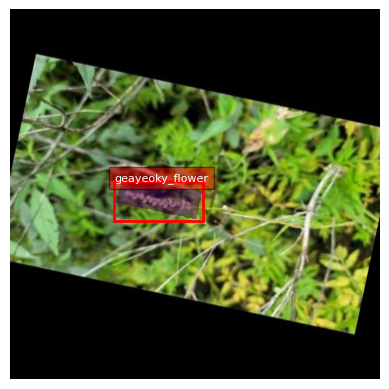

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import matplotlib.patches as patches

def show_sample_with_polygon_and_mask(dataset, index=0):
    img, target = dataset[index]
    img = img.permute(1, 2, 0).numpy()  # 이미지를 (H, W, C)로 변환

    # 이미지 표시
    fig, ax = plt.subplots(1)
    ax.imshow(img)

    # 바운딩 박스 그리기
    boxes = target["boxes"].cpu().numpy()
    labels = target["labels"].cpu().numpy()
    categories = dataset.categories  # 클래스 이름

    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        # 클래스 이름 추가
        class_name = categories[label]
        plt.text(xmin, ymin, class_name, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))

    # 마스크 시각화
    if "masks" in target:
        masks = target["masks"].cpu().numpy()
        for mask in masks:
            binary_mask = mask > 0.5
            # 객체 부분만 시각화 (배경 제외)
            plt.imshow(np.ma.masked_where(binary_mask == False, binary_mask), alpha=0.5, cmap='viridis')

    plt.axis('off')  # 눈금 레이블 및 축 숨기기
    plt.show()

# 시각화 실행 (0번째 데이터를 기준으로)
show_sample_with_polygon_and_mask(train_dataset, index=1)


In [ ]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

import torch

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)
torch.manual_seed(512)
if device == 'cuda':
    torch.cuda.manual_seed_all(512)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.0001, weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)


# Check if CUDA is working properly
print(torch.rand(1, device=device))

cuda
tensor([0.2218], device='cuda:0')


In [ ]:
# 5. Adam Optimizer로 모델 학습
from tqdm import tqdm
model.to(device)

num_epochs = 20
best_loss = float('inf')

for epoch in range(num_epochs):
    running_loss, running_bbox_loss, running_cls_loss, running_mask_loss = 0.0, 0.0, 0.0, 0.0
    model.train()

    for imgs, targets in tqdm(train_loader):
      imgs = [img.to(device) for img in imgs]
      targets = [{k: v.to(device) if torch.is_tensor(v) else v for k, v in t.items()} for t in targets]

      # Check for empty bounding boxes and skip
      if any(t['boxes'].numel() == 0 for t in targets):
          continue

      loss_dict = model(imgs, targets)
      total_loss = sum(loss for loss in loss_dict.values())

      optimizer.zero_grad()
      total_loss.backward()
      optimizer.step()

      running_loss += total_loss.item()
      running_bbox_loss += loss_dict['loss_box_reg'].item()
      running_cls_loss += loss_dict['loss_classifier'].item()
      running_mask_loss += loss_dict['loss_mask'].item()

    # Calculate average losses at the end of the epoch
    avg_loss = running_loss / len(train_loader)
    avg_bbox_loss = running_bbox_loss / len(train_loader)
    avg_cls_loss = running_cls_loss / len(train_loader)
    avg_mask_loss = running_mask_loss / len(train_loader)

    print(f'Epoch [{epoch+1}], Loss: {avg_loss:.4f}, BBox Loss: {avg_bbox_loss:.4f}, Cls Loss: {avg_cls_loss:.4f}, Mask Loss: {avg_mask_loss:.4f}')

    if avg_loss < best_loss:
        best_loss = avg_loss
        torch.save(model.state_dict(), 'best_model_augx3.pth')

    scheduler.step()

100%|██████████| 2024/2024 [12:36<00:00,  2.68it/s]


Epoch [1], Loss: 0.8637, BBox Loss: 0.1793, Cls Loss: 0.2972, Mask Loss: 0.3501


100%|██████████| 2024/2024 [12:32<00:00,  2.69it/s]


Epoch [2], Loss: 0.6799, BBox Loss: 0.1574, Cls Loss: 0.2055, Mask Loss: 0.2878


100%|██████████| 2024/2024 [12:33<00:00,  2.69it/s]


Epoch [3], Loss: 0.5328, BBox Loss: 0.1251, Cls Loss: 0.1366, Mask Loss: 0.2511


100%|██████████| 2024/2024 [12:34<00:00,  2.68it/s]


Epoch [4], Loss: 0.4935, BBox Loss: 0.1171, Cls Loss: 0.1184, Mask Loss: 0.2407


100%|██████████| 2024/2024 [12:35<00:00,  2.68it/s]


Epoch [5], Loss: 0.4591, BBox Loss: 0.1077, Cls Loss: 0.1038, Mask Loss: 0.2321


100%|██████████| 2024/2024 [12:34<00:00,  2.68it/s]


Epoch [6], Loss: 0.4546, BBox Loss: 0.1070, Cls Loss: 0.1021, Mask Loss: 0.2304


100%|██████████| 2024/2024 [12:35<00:00,  2.68it/s]


Epoch [7], Loss: 0.4496, BBox Loss: 0.1057, Cls Loss: 0.1002, Mask Loss: 0.2290


100%|██████████| 2024/2024 [12:34<00:00,  2.68it/s]


Epoch [8], Loss: 0.4489, BBox Loss: 0.1057, Cls Loss: 0.0999, Mask Loss: 0.2285


100%|██████████| 2024/2024 [12:35<00:00,  2.68it/s]


Epoch [9], Loss: 0.4487, BBox Loss: 0.1054, Cls Loss: 0.0998, Mask Loss: 0.2287


100%|██████████| 2024/2024 [12:34<00:00,  2.68it/s]


Epoch [10], Loss: 0.4490, BBox Loss: 0.1055, Cls Loss: 0.0999, Mask Loss: 0.2288


100%|██████████| 2024/2024 [12:35<00:00,  2.68it/s]


Epoch [11], Loss: 0.4489, BBox Loss: 0.1054, Cls Loss: 0.0998, Mask Loss: 0.2289


100%|██████████| 2024/2024 [12:33<00:00,  2.69it/s]


Epoch [12], Loss: 0.4491, BBox Loss: 0.1054, Cls Loss: 0.0997, Mask Loss: 0.2293


100%|██████████| 2024/2024 [12:32<00:00,  2.69it/s]


Epoch [13], Loss: 0.4481, BBox Loss: 0.1054, Cls Loss: 0.0997, Mask Loss: 0.2283


100%|██████████| 2024/2024 [12:32<00:00,  2.69it/s]


Epoch [14], Loss: 0.4483, BBox Loss: 0.1054, Cls Loss: 0.0998, Mask Loss: 0.2283


100%|██████████| 2024/2024 [12:32<00:00,  2.69it/s]


Epoch [15], Loss: 0.4483, BBox Loss: 0.1055, Cls Loss: 0.0998, Mask Loss: 0.2284


100%|██████████| 2024/2024 [12:32<00:00,  2.69it/s]


Epoch [16], Loss: 0.4485, BBox Loss: 0.1054, Cls Loss: 0.0997, Mask Loss: 0.2285


100%|██████████| 2024/2024 [12:33<00:00,  2.69it/s]


Epoch [17], Loss: 0.4483, BBox Loss: 0.1055, Cls Loss: 0.0997, Mask Loss: 0.2283


100%|██████████| 2024/2024 [12:35<00:00,  2.68it/s]


Epoch [18], Loss: 0.4486, BBox Loss: 0.1054, Cls Loss: 0.0997, Mask Loss: 0.2288


100%|██████████| 2024/2024 [12:35<00:00,  2.68it/s]


Epoch [19], Loss: 0.4484, BBox Loss: 0.1054, Cls Loss: 0.0998, Mask Loss: 0.2284


100%|██████████| 2024/2024 [12:36<00:00,  2.68it/s]

Epoch [20], Loss: 0.4484, BBox Loss: 0.1054, Cls Loss: 0.0996, Mask Loss: 0.2285


In [ ]:
import torch
from torchvision.ops import nms
from tqdm import tqdm

def apply_nms(predictions, iou_threshold=0.5, score_threshold=0.6):

    # 먼저 점수 임계값 이상인 박스만 남깁니다.
    high_score_idxs = predictions['scores'] > score_threshold
    print(f"score_threshold 이후 남은 박스 수: {high_score_idxs.sum()}")

    filtered_boxes = predictions['boxes'][high_score_idxs]
    filtered_scores = predictions['scores'][high_score_idxs]
    print(f"score_threshold 이후 남은 점수: {filtered_scores}")

    filtered_labels = predictions['labels'][high_score_idxs]
    filtered_masks = predictions['masks'][high_score_idxs] if 'masks' in predictions else None

    # NMS 적용
    keep = nms(filtered_boxes, filtered_scores, iou_threshold)
    print(f"NMS 이후 남은 박스 수: {len(keep)}")

    # NMS가 적용된 결과 필터링
    nms_boxes = filtered_boxes[keep]
    nms_scores = filtered_scores[keep]
    nms_labels = filtered_labels[keep]
    nms_masks = filtered_masks[keep] if filtered_masks is not None else None

    print(f'NMS 적용된 바운딩 박스 수: {len(nms_boxes)}')
    print(f'NMS 적용된 점수: {nms_scores}')

    return nms_boxes, nms_scores, nms_labels, nms_masks


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def visualize_prediction_with_nms(image, boxes, masks, labels, scores, categories, threshold=0.6):
    """
    NMS가 적용된 예측 결과를 시각화하는 함수

    Args:
        image: 입력 이미지 (torch.Tensor, [C, H, W])
        boxes: 예측된 바운딩 박스 좌표 (torch.Tensor, [N, 4])
        masks: 예측된 마스크 (torch.Tensor, [N, H, W])
        labels: 예측된 클래스 라벨 (torch.Tensor, [N])
        scores: 예측된 점수 (torch.Tensor, [N])
        categories: 클래스 이름을 포함한 카테고리 딕셔너리 (id -> name)
        threshold: 시각화할 최소 점수 임계값 (기본값은 0.5)
    """
    # 이미지 변환 (C, H, W) -> (H, W, C)로 변환 후 numpy로 변환
    img_np = image.permute(1, 2, 0).cpu().numpy()

    # 이미지 출력
    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(img_np)

    # 마스크를 하나로 합치기 위한 빈 배열 생성
    merged_mask = np.zeros_like(img_np[:, :, 0])

    for box, mask, label, score in zip(boxes, masks, labels, scores):
        if score >= threshold:  # 점수가 임계값 이상인 경우만 표시
            # 바운딩 박스 그리기
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            # 마스크 그리기 (배경 제외)
            mask_np = mask.squeeze(0).cpu().numpy()
            binary_mask = mask_np > 0.5
            merged_mask = np.logical_or(merged_mask, binary_mask) # 마스크 합치기

            # 클래스 이름 및 점수 추가
            class_name = categories.get(label.item(), 'Unknown')
            ax.text(x1, y1, f'{class_name} {score:.2f}', color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    # 합쳐진 마스크를 한 번만 그리기
    plt.imshow(np.ma.masked_where(merged_mask == False, merged_mask), cmap='viridis', alpha=0.5)


    plt.axis('off')  # 축 제거
    plt.show()

    print(f'박스 수: {len(nms_boxes)}, 라벨 수: {len(nms_labels)}, 마스크 수: {len(nms_masks) if nms_masks is not None else "None"}')


예측된 박스 수: 14
예측된 점수의 최대값: 0.9510579705238342
score_threshold 이후 남은 박스 수: 3
score_threshold 이후 남은 점수: tensor([0.9511, 0.8889, 0.7925], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9511, 0.8889, 0.7925], device='cuda:0')


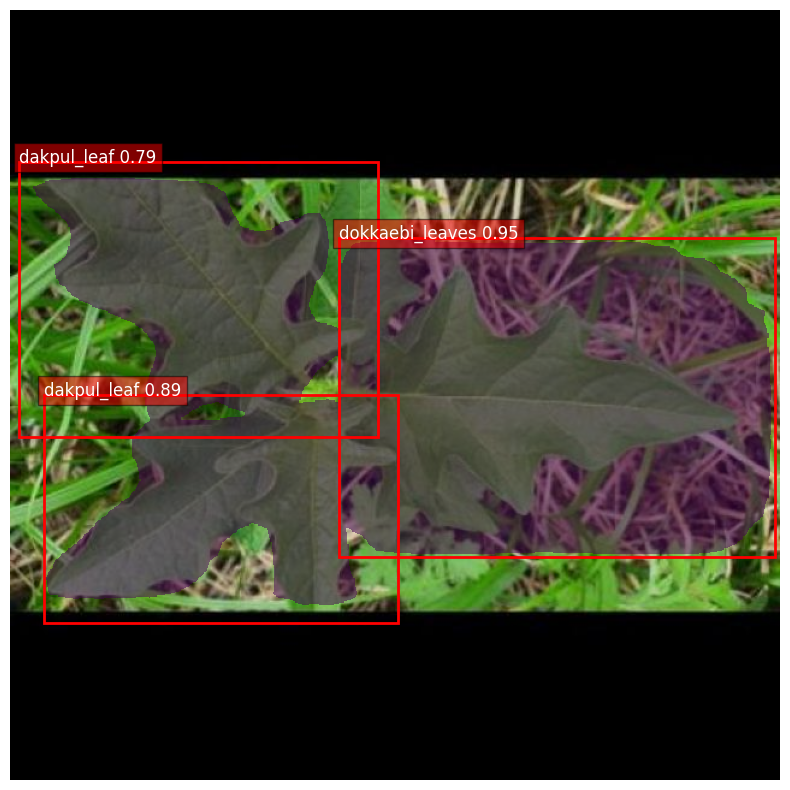

박스 수: 3, 라벨 수: 3, 마스크 수: 3


In [ ]:
model.eval()
with torch.no_grad():
    for imgs, _ in valid_loader:
        imgs = [img.to(device) for img in imgs]
        predictions = model(imgs)

        # 예측된 박스와 점수 정보 출력
        print(f"예측된 박스 수: {len(predictions[1]['boxes'])}")

        print(f"예측된 점수의 최대값: {predictions[1]['scores'].max() if len(predictions[1]['scores']) > 0 else 'None'}")

        # 첫 번째 이미지에 대해 NMS 적용 및 시각화
        nms_boxes, nms_scores, nms_labels, nms_masks = apply_nms(predictions[1], iou_threshold=0.5, score_threshold=0.6)

        # 카테고리 딕셔너리: {id -> name} 형태로 제공
        categories = {k: v for k, v in valid_dataset.categories.items()}  # 키와 값을 바꿔서 딕셔너리 생성

        # 시각화 함수 호출 (첫 번째 이미지)
        visualize_prediction_with_nms(imgs[1], nms_boxes, nms_masks, nms_labels, nms_scores, categories,threshold=0.6)

        # 첫 번째 이미지의 결과만 시각화 후 종료
        break


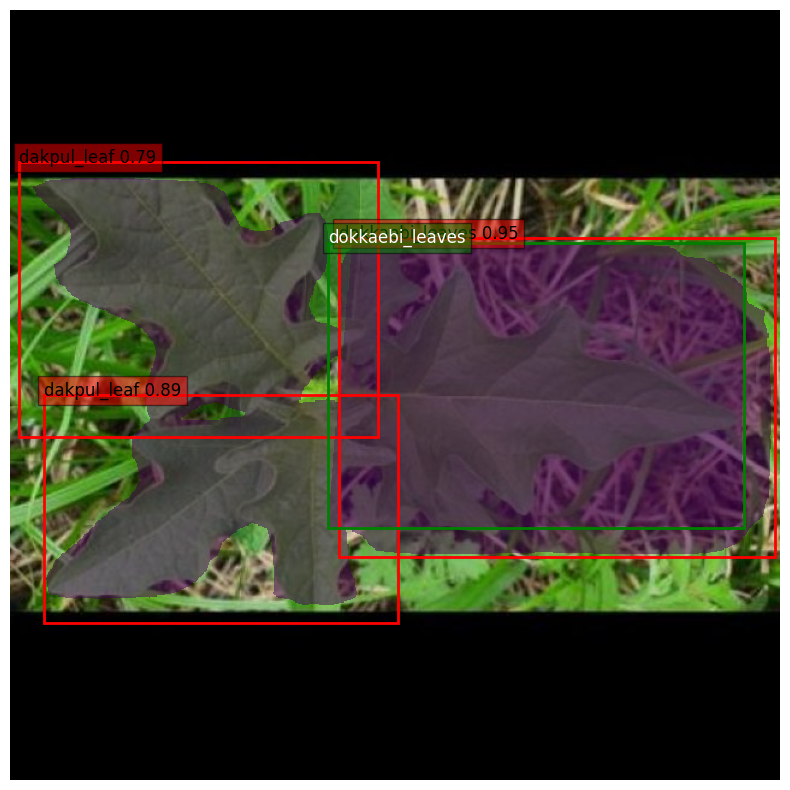

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def visualize_predictions_and_ground_truth(image, pred_boxes, pred_masks, pred_labels, pred_scores,
                                           gt_boxes, gt_masks, gt_labels, categories, threshold=0.6):
    """
    예측된 값과 정답을 함께 시각화하는 함수

    Args:
        image: 입력 이미지 (torch.Tensor, [C, H, W])
        pred_boxes: 예측된 바운딩 박스 좌표 (torch.Tensor, [N, 4])
        pred_masks: 예측된 마스크 (torch.Tensor, [N, H, W])
        pred_labels: 예측된 클래스 라벨 (torch.Tensor, [N])
        pred_scores: 예측된 점수 (torch.Tensor, [N])
        gt_boxes: 정답 바운딩 박스 좌표 (torch.Tensor, [N, 4])
        gt_masks: 정답 마스크 (torch.Tensor, [N, H, W])
        gt_labels: 정답 라벨 (torch.Tensor, [N])
        categories: 클래스 이름을 포함한 카테고리 딕셔너리 (id -> name)
        threshold: 시각화할 최소 점수 임계값
    """
    # 이미지 변환
    img_np = image.permute(1, 2, 0).cpu().numpy()

    # 예측 시각화
    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(img_np)

    # 예측된 마스크를 합칠 빈 배열
    merged_pred_mask = np.zeros_like(img_np[:, :, 0])

    # 예측된 값 시각화
    for box, mask, label, score in zip(pred_boxes, pred_masks, pred_labels, pred_scores):
        if score >= threshold:  # 점수 임계값 이상인 경우만 표시
            # 예측된 바운딩 박스 그리기 (빨간색)
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            # 예측된 마스크 그리기
            mask_np = mask.squeeze(0).cpu().numpy()
            binary_mask = mask_np > 0.5
            merged_pred_mask = np.logical_or(merged_pred_mask, binary_mask)

            # 예측된 클래스 이름과 점수 추가
            class_name = categories.get(label.item(), 'Unknown')
            ax.text(x1, y1, f'{class_name} {score:.2f}', color='black', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    # 정답 시각화
    for box, mask, label in zip(gt_boxes, gt_masks, gt_labels):
        # 정답 바운딩 박스 그리기 (녹색)
        x1, y1, x2, y2 = box.cpu().numpy()
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='g', facecolor='none')
        ax.add_patch(rect)

        # 정답 마스크 그리기
        mask_np = mask.squeeze(0).cpu().numpy()
        binary_mask = mask_np > 0.5
        ax.imshow(np.ma.masked_where(binary_mask == False, binary_mask), cmap='viridis', alpha=0.3)

        # 정답 클래스 이름 추가
        class_name = categories.get(label.item(), 'Unknown')
        ax.text(x1, y1, f'{class_name}', color='white', fontsize=12, bbox=dict(facecolor='green', alpha=0.5))

    # 예측된 마스크 합치기
    plt.imshow(np.ma.masked_where(merged_pred_mask == False, merged_pred_mask), cmap='viridis', alpha=0.5)

    plt.axis('off')  # 축 제거
    plt.show()

# 모델 예측 및 정답 예시
model.eval()
with torch.no_grad():
    for imgs, targets in valid_loader:
        imgs = [img.to(device) for img in imgs]
        predictions = model(imgs)

        # 첫 번째 이미지 예측 결과 가져오기
        pred_boxes = predictions[1]['boxes']
        pred_masks = predictions[1]['masks']
        pred_labels = predictions[1]['labels']
        pred_scores = predictions[1]['scores']

        # 첫 번째 이미지 정답 정보 가져오기
        gt_boxes = targets[1]['boxes']
        gt_masks = targets[1]['masks']
        gt_labels = targets[1]['labels']

        # 시각화 함수 호출
        categories = {k: v for k, v in valid_dataset.categories.items()}  # 카테고리 딕셔너리
        visualize_predictions_and_ground_truth(imgs[1], pred_boxes, pred_masks, pred_labels, pred_scores,
                                               gt_boxes, gt_masks, gt_labels, categories, threshold=0.6)

        # 첫 번째 이미지만 시각화 후 종료
        break


In [ ]:

# 모델 검증 (손실 계산 없이)
model.eval()

for imgs, targets in tqdm(valid_loader):
    imgs = [img.to(device) for img in imgs]

    # targets에서 torch.Tensor만 to(device) 적용
    targets = [
        {
            k: (v.to(device) if isinstance(v, torch.Tensor) else v)
            for k, v in t.items()
        }
        for t in targets
    ]

    with torch.no_grad():
        # 모델의 예측
        predictions = model(imgs)
        # 예측된 박스와 점수 정보 출력
        print(f"예측된 박스 수: {len(predictions[0]['boxes'])}")

        print(f"예측된 점수의 최대값: {predictions[0]['scores'].max() if len(predictions[0]['scores']) > 0 else 'None'}")

        # NMS 적용
        for pred in predictions:
            nms_boxes, nms_scores, nms_labels, nms_masks = apply_nms(pred, iou_threshold=0.5)

    # 여기서 예측된 박스, 라벨, 마스크 등을 이용해 원하는 평가를 수행하면 됩니다.
    print(f'NMS 적용 후 박스 개수: {len(nms_boxes)}')
    print(f'NMS 적용 후 마스크 개수: {len(nms_masks)}')


  1%|          | 1/193 [00:01<04:28,  1.40s/it]

예측된 박스 수: 19
예측된 점수의 최대값: 0.4027389883995056
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 30.3530, 174.2640, 300.1291, 404.9355]], device='cuda:0')
필터링된 점수: tensor([0.4027], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.4027], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[251.6012, 179.9181, 639.6606, 456.6500],
        [ 11.7268, 129.8107, 309.6986, 365.0254],
        [ 14.9054, 309.0003, 327.9612, 505.1071],
        [ 15.7685, 107.0283, 354.1024, 400.1555],
        [261.9740, 204.4534, 617.4957, 449.2773],
        [ 77.1774, 158.4159, 487.8075, 447.9876]], device='cuda:0')
필터링된 점수: tensor([0.9251, 0.8340, 0.7691, 0.6105, 0.5497, 0.4690], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9251, 0.8340, 0.7691, 0.4690], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[ 48.5242,  85.8245, 561.8711, 500.9742],
        [  3.1208, 171.6928, 384.8921, 491.8485],
        [ 11.9842, 243.2326, 311.9

  1%|          | 2/193 [00:02<03:33,  1.12s/it]

예측된 박스 수: 21
예측된 점수의 최대값: 0.9430124759674072
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[116.9795, 313.3003, 292.3030, 417.2879],
        [112.2241, 149.5761, 492.7866, 508.2241],
        [188.6499, 188.1835, 296.1986, 309.9119],
        [339.3198, 154.9386, 431.4117, 314.3241]], device='cuda:0')
필터링된 점수: tensor([0.9430, 0.8212, 0.6690, 0.5342], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9430, 0.8212, 0.6690, 0.5342], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[104.7627, 165.6379, 173.0926, 245.5704],
        [360.7910, 340.2149, 464.0648, 418.1290],
        [117.5874, 193.4904, 372.1549, 506.9130],
        [ 86.0033, 247.8646, 152.7626, 386.0073]], device='cuda:0')
필터링된 점수: tensor([0.5582, 0.5487, 0.4665, 0.4385], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.5582, 0.5487, 0.4665, 0.4385], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[  0.0000,   6.4820, 388.2719, 301.4225],
  

  2%|▏         | 3/193 [00:03<03:15,  1.03s/it]

예측된 박스 수: 40
예측된 점수의 최대값: 0.8944784998893738
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[306.6690, 276.0940, 398.6580, 520.7347],
        [467.0785, 411.9973, 525.5267, 554.1032],
        [322.9526, 205.1095, 394.1040, 310.9189],
        [381.9604, 222.5880, 533.8671, 334.5448],
        [185.8319, 253.4238, 289.5379, 376.5210]], device='cuda:0')
필터링된 점수: tensor([0.8945, 0.8383, 0.7955, 0.6063, 0.5494], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.8945, 0.8383, 0.7955, 0.6063, 0.5494], device='cuda:0')
score_threshold 이후 남은 박스 수: 13
필터링된 박스: tensor([[  0.0000, 455.3978, 195.9411, 567.7106],
        [ 13.2393, 283.3707, 177.9160, 341.6437],
        [  1.3601,  53.7257,  74.3979, 199.4541],
        [157.3107,   0.0000, 249.8172,  46.0685],
        [485.6238, 136.6164, 636.2391, 288.9674],
        [330.1187, 287.0437, 632.5012, 634.5229],
        [335.3977,  24.5843, 491.6963, 253.8366],
        [422.1126,   0.8120, 520.5483,  26.0076],
        [295.7100

  2%|▏         | 4/193 [00:04<03:07,  1.01it/s]

예측된 박스 수: 12
예측된 점수의 최대값: 0.5957732796669006
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[386.1969, 298.4779, 418.9524, 345.5562],
        [ 14.8783, 111.3910, 551.1837, 473.9565],
        [  0.0000, 136.4289, 359.2721, 463.8477]], device='cuda:0')
필터링된 점수: tensor([0.5958, 0.5220, 0.4391], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5958, 0.5220], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[274.8606, 346.9708, 354.1726, 474.1615],
        [277.4744, 200.7619, 383.5874, 322.9674],
        [306.3093, 285.2099, 559.5373, 418.1137],
        [232.0353, 126.8054, 320.7403, 224.5387],
        [545.3901, 462.2070, 619.8896, 556.1006],
        [261.7874,  82.9031, 405.3914, 188.7943],
        [  4.9265, 222.4285,  81.8055, 296.8642]], device='cuda:0')
필터링된 점수: tensor([0.8267, 0.7996, 0.7629, 0.7400, 0.5862, 0.5670, 0.4275],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.8267, 0.7996, 0.7629, 0.7400, 0.

  3%|▎         | 5/193 [00:05<03:04,  1.02it/s]

예측된 박스 수: 7
예측된 점수의 최대값: 0.982563316822052
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 84.2495, 165.8471, 592.3673, 488.8583],
        [147.4813, 202.2092, 492.8155, 477.7402],
        [399.9655, 140.7742, 539.1137, 280.1970]], device='cuda:0')
필터링된 점수: tensor([0.9826, 0.7336, 0.4015], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9826, 0.4015], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[280.8538, 248.3363, 326.4619, 298.9760],
        [213.7051, 185.6881, 254.3688, 279.9011],
        [328.8529, 255.7311, 393.8089, 294.7708],
        [318.0745, 173.1559, 362.6903, 272.6046],
        [470.6473, 303.5653, 556.4263, 334.0124],
        [250.8734, 302.1973, 318.0586, 336.1442],
        [300.9372, 166.3913, 375.0215, 295.9362],
        [161.6841, 242.6681, 239.5182, 285.1769],
        [107.7539, 340.2048, 187.6883, 362.2199],
        [261.8802, 209.2654, 397.7871, 313.5132]], device='cuda:0')
필터링된 점수: tensor([0.9394, 0.8691, 0.8017, 

  3%|▎         | 6/193 [00:06<02:59,  1.04it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.5245527029037476
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[120.8581, 118.6693, 442.7757, 518.6547],
        [ 56.9235, 118.6913, 476.7461, 506.6151]], device='cuda:0')
필터링된 점수: tensor([0.5246, 0.4858], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5246], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[304.1886, 280.8875, 544.9178, 485.9354],
        [ 28.7135, 214.9577, 226.0993, 413.2659],
        [399.0377, 132.5947, 550.8463, 302.6068],
        [185.7124, 366.7891, 323.3583, 498.7553],
        [247.4443, 126.3569, 330.6641, 224.3421],
        [235.0389, 117.8220, 346.8919, 238.3362]], device='cuda:0')
필터링된 점수: tensor([0.9811, 0.9806, 0.9266, 0.6004, 0.5084, 0.4236], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운

  4%|▎         | 7/193 [00:06<02:56,  1.05it/s]

예측된 박스 수: 38
예측된 점수의 최대값: 0.8912798166275024
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[241.0844, 146.6693, 329.0725, 338.9614],
        [332.1439, 247.9200, 554.5413, 322.4773],
        [374.9813, 376.6020, 541.7997, 469.5650],
        [ 10.5839, 174.5439, 121.5057, 296.4297],
        [164.8114, 159.7079, 248.9595, 272.9590],
        [139.9854, 414.0022, 279.9945, 550.7292],
        [176.7685, 368.8724, 325.0979, 435.1948]], device='cuda:0')
필터링된 점수: tensor([0.8913, 0.8774, 0.8102, 0.8094, 0.6805, 0.6448, 0.6189],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.8913, 0.8774, 0.8102, 0.8094, 0.6805, 0.6448, 0.6189],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[170.5166, 207.7923, 479.6180, 489.5398],
        [192.0876, 210.5201, 453.3929, 466.5713]], device='cuda:0')
필터링된 점수: tensor([0.8817, 0.8177], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8817], device='cuda:0')
score_threshold 이후 

  4%|▍         | 8/193 [00:08<03:04,  1.00it/s]

예측된 박스 수: 46
예측된 점수의 최대값: 0.4736930727958679
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[251.3002, 287.1609, 394.5942, 469.8266],
        [360.5085, 242.9934, 500.3291, 432.9868]], device='cuda:0')
필터링된 점수: tensor([0.4737, 0.4610], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.4737, 0.4610], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 28.7164,  22.4950, 616.8309, 593.5233]], device='cuda:0')
필터링된 점수: tensor([0.7117], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7117], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[185.7003, 266.6221, 251.2859, 342.7207],
        [174.9443, 164.3333, 241.6900, 240.1492]], device='cuda:0')
필터링된 점수: tensor([0.4977, 0.4839], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.4977, 0.4839], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[299.5293, 207.5061, 378.6576, 258.5945],
        [326.6213, 315.2097, 371

  5%|▍         | 9/193 [00:09<03:06,  1.01s/it]

예측된 박스 수: 10
예측된 점수의 최대값: 0.7600235342979431
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[104.3376,  97.8348, 585.3072, 489.0444],
        [293.4664, 285.0260, 334.8840, 322.5875]], device='cuda:0')
필터링된 점수: tensor([0.7600, 0.4701], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7600, 0.4701], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[109.8896, 158.6209, 389.2040, 396.9518],
        [ 61.1947, 152.2032, 612.5078, 484.3065]], device='cuda:0')
필터링된 점수: tensor([0.8976, 0.4994], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8976, 0.4994], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 27.6449, 165.3360, 528.5654, 482.6830],
        [184.3923, 167.2014, 510.0468, 362.9161]], device='cuda:0')
필터링된 점수: tensor([0.9495, 0.5582], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9495, 0.5582], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[281.758

  5%|▌         | 10/193 [00:10<03:05,  1.01s/it]

예측된 박스 수: 6
예측된 점수의 최대값: 0.9917594790458679
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[115.0382, 233.2211, 574.0894, 634.6901]], device='cuda:0')
필터링된 점수: tensor([0.9918], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9918], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[207.2932, 212.6559, 336.8659, 398.3334],
        [239.2273,  94.4419, 479.0327, 461.3935],
        [300.0968,  92.3744, 404.9432, 273.6471],
        [438.0377, 173.3967, 534.6300, 312.7652],
        [154.0083, 358.0800, 225.3824, 507.8437]], device='cuda:0')
필터링된 점수: tensor([0.8641, 0.8621, 0.7966, 0.6099, 0.5921], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.8641, 0.8621, 0.7966, 0.6099, 0.5921], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[254.3041, 183.7653, 498.9980, 453.2019],
        [484.0259, 133.0500, 507.3796, 273.7852]], device='cuda:0')
필터링된 점수: tensor([0.8546, 0.6473], device='cuda:0')
NMS 이후 남은 박스 수: 

  6%|▌         | 11/193 [00:11<03:08,  1.04s/it]

예측된 박스 수: 8
예측된 점수의 최대값: 0.8901857137680054
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 43.0254, 196.3686, 598.9108, 476.4162],
        [195.6326, 238.8984, 607.5306, 441.7786],
        [ 66.3186, 245.8534, 381.9930, 454.7773]], device='cuda:0')
필터링된 점수: tensor([0.8902, 0.5581, 0.4161], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8902, 0.4161], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[422.8473, 267.5677, 524.7861, 460.7872],
        [236.3746, 139.7375, 400.9456, 323.9515],
        [192.9967, 142.5193, 563.8984, 473.9438]], device='cuda:0')
필터링된 점수: tensor([0.9522, 0.7249, 0.6614], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9522, 0.7249, 0.6614], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[429.8505, 286.6067, 552.5462, 377.8114],
        [387.1621,  97.2943, 545.9656, 212.0084],
        [ 46.6864,  91.5808, 588.3069, 445.1570],
        [ 72.3631, 221.2693, 333.9216, 387.

  6%|▌         | 12/193 [00:12<03:09,  1.04s/it]

예측된 박스 수: 14
예측된 점수의 최대값: 0.9543554782867432
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[209.7679, 203.7654, 386.7509, 427.3203],
        [230.7576, 217.9722, 341.1153, 394.8629],
        [279.5374, 221.9986, 370.7172, 389.1727],
        [360.7461, 366.0227, 427.1260, 462.3416]], device='cuda:0')
필터링된 점수: tensor([0.9544, 0.8302, 0.6596, 0.5785], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9544, 0.8302, 0.6596, 0.5785], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[129.9366, 160.8507, 509.8867, 444.1295],
        [339.5315, 209.2528, 507.5806, 445.2347],
        [121.5252, 158.8461, 218.2008, 249.6377],
        [ 97.9744, 241.0538, 170.2108, 309.5002],
        [393.0803, 208.2471, 470.9161, 279.1990],
        [ 75.5337, 147.8008, 606.0432, 483.8313],
        [103.9926, 138.2591, 370.4356, 403.4690]], device='cuda:0')
필터링된 점수: tensor([0.9003, 0.8712, 0.7447, 0.6422, 0.5719, 0.5393, 0.4578],
       device='cuda:0')
NMS 이후 남은 박스 수: 6


  7%|▋         | 13/193 [00:13<03:01,  1.01s/it]

예측된 박스 수: 21
예측된 점수의 최대값: 0.8667256236076355
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[244.9241, 239.0263, 406.2319, 379.3579],
        [175.8973, 114.7019, 595.6024, 525.4266],
        [370.9590, 257.8324, 417.8070, 293.1621]], device='cuda:0')
필터링된 점수: tensor([0.8667, 0.4847, 0.4834], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8667, 0.4847, 0.4834], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[103.4271,  11.0948, 463.1227, 585.5639],
        [212.9296,   0.0000, 486.1882, 436.6120],
        [ 83.9783, 242.5428, 353.0580, 640.0000]], device='cuda:0')
필터링된 점수: tensor([0.7896, 0.6310, 0.5082], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.7896, 0.6310, 0.5082], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[ 22.2904, 136.0450, 580.9412, 504.2801],
        [ 99.4498, 400.1301, 140.3487, 466.4240],
        [ 82.2155, 310.0864, 297.2150, 482.4178],
        [337.2376, 225.7705, 385.1

  7%|▋         | 14/193 [00:14<02:59,  1.00s/it]

예측된 박스 수: 12
예측된 점수의 최대값: 0.7557212710380554
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[156.0970, 302.3142, 306.9215, 399.0603],
        [167.8849, 290.6628, 495.9135, 487.3990],
        [153.8101,  84.0321, 387.6258, 246.6368],
        [145.0435, 253.8238, 533.4115, 516.7030]], device='cuda:0')
필터링된 점수: tensor([0.7557, 0.5655, 0.5201, 0.4041], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.7557, 0.5655, 0.5201], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[388.2313, 435.6404, 448.5617, 518.5450],
        [240.0253, 174.6580, 560.8885, 376.3494]], device='cuda:0')
필터링된 점수: tensor([0.8500, 0.4082], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8500, 0.4082], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 63.7059, 186.9278, 188.9975, 506.6599],
        [299.8217, 266.5464, 441.3387, 494.1485],
        [ 12.0519, 150.3384, 604.6074, 528.0037]], device='cuda:0')
필터링된 점수: tensor([0.5442,

  8%|▊         | 15/193 [00:15<02:54,  1.02it/s]

예측된 박스 수: 7
예측된 점수의 최대값: 0.939113199710846
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[169.1408, 169.3870, 553.3074, 457.7537],
        [190.8365, 203.3165, 462.5767, 457.7380]], device='cuda:0')
필터링된 점수: tensor([0.9391, 0.5656], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9391], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[115.8920, 204.9668, 468.2945, 492.7708]], device='cuda:0')
필터링된 점수: tensor([0.9911], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9911], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[188.3513, 351.7434, 337.5513, 433.4853],
        [160.1417, 184.5741, 454.1137, 402.4195],
        [145.2709, 103.5005, 390.2614, 230.5945],
        [370.8328, 117.5345, 447.6676, 237.5755],
        [165.7896, 392.6320, 409.1427, 510.7363],
        [ 11.9333, 419.7213, 196.7228, 535.1769],
        [  0.0000, 139.5249, 168.9868, 380.4466],
        [  0.0000,  81.1942, 543.7042, 512

  8%|▊         | 16/193 [00:16<02:49,  1.05it/s]

예측된 박스 수: 22
예측된 점수의 최대값: 0.9113976359367371
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[447.3250, 362.7115, 525.1345, 434.9970],
        [  0.0000, 247.6194,  44.4850, 310.4907],
        [244.7709, 246.3235, 383.3886, 361.9494],
        [249.2545, 285.0645, 353.5382, 373.0450],
        [155.0625, 345.1725, 217.5475, 424.6545],
        [  0.0000, 237.7986,  49.9696, 324.5338],
        [266.3291, 329.0243, 338.9131, 372.6982]], device='cuda:0')
필터링된 점수: tensor([0.9114, 0.6943, 0.6825, 0.5220, 0.5126, 0.4184, 0.4070],
       device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9114, 0.6943, 0.6825, 0.5220, 0.5126, 0.4070], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[349.5284, 388.8473, 479.1862, 511.6783],
        [268.0204, 217.9901, 428.5234, 329.6071],
        [176.5022, 411.6542, 288.1637, 515.3715],
        [200.7038, 431.7691, 264.8015, 493.9746]], device='cuda:0')
필터링된 점수: tensor([0.9632, 0.9340, 0.5903, 0.4959], device='cuda:0')
NM

  9%|▉         | 17/193 [00:16<02:46,  1.06it/s]

예측된 박스 수: 29
예측된 점수의 최대값: 0.9705304503440857
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[424.7002, 323.5280, 532.2195, 435.5442],
        [174.0236, 179.7582, 240.0961, 234.4323],
        [287.3351, 298.5709, 425.5855, 443.3438],
        [ 66.7834, 407.7914, 212.1086, 561.1179],
        [ 78.6536, 227.9834, 167.2632, 328.0209],
        [430.6637, 181.0535, 628.8259, 374.7286]], device='cuda:0')
필터링된 점수: tensor([0.9705, 0.9486, 0.7921, 0.7758, 0.7145, 0.5263], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9705, 0.9486, 0.7921, 0.7758, 0.7145, 0.5263], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[135.0157, 149.9888, 212.5170, 221.3954],
        [258.4306, 163.7166, 296.6503, 205.5619],
        [286.9308, 264.7163, 365.2912, 340.1650],
        [106.0647, 320.4846, 147.3424, 357.1472],
        [ 67.3447, 244.9855, 134.3433, 291.9485]], device='cuda:0')
필터링된 점수: tensor([0.9909, 0.9700, 0.9587, 0.9426, 0.5726], device='cuda:0')
NMS 이후 남은

  9%|▉         | 18/193 [00:17<02:47,  1.05it/s]

예측된 박스 수: 21
예측된 점수의 최대값: 0.9172464609146118
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[213.1605, 229.4160, 388.2603, 370.3893],
        [  0.0000, 141.2507, 151.6857, 268.1666],
        [103.0871, 107.8400, 272.7196, 265.3467],
        [ 66.0180, 169.6881, 640.0000, 506.4166]], device='cuda:0')
필터링된 점수: tensor([0.9172, 0.7789, 0.6660, 0.4158], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9172, 0.7789, 0.6660, 0.4158], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[149.9458, 105.5579, 626.5034, 541.1969]], device='cuda:0')
필터링된 점수: tensor([0.7402], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7402], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 35.3426, 203.8319, 590.7579, 479.3422]], device='cuda:0')
필터링된 점수: tensor([0.8972], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8972], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[234.947

 10%|▉         | 19/193 [00:18<02:43,  1.06it/s]

예측된 박스 수: 7
예측된 점수의 최대값: 0.9756938815116882
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[134.5160, 218.0390, 415.7426, 451.7747]], device='cuda:0')
필터링된 점수: tensor([0.9757], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9757], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 28.3464,  84.4983, 428.7574, 560.3376],
        [257.6044,  16.8037, 621.6116, 431.5831]], device='cuda:0')
필터링된 점수: tensor([0.9348, 0.8495], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9348, 0.8495], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[286.4656, 137.7974, 442.5540, 492.7817],
        [132.5986, 109.5687, 430.0508, 488.4308]], device='cuda:0')
필터링된 점수: tensor([0.7807, 0.4318], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7807, 0.4318], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[390.7122, 179.6644, 630.8772, 639.3860],
        [ 20.2489, 253.2148, 327.

 10%|█         | 20/193 [00:19<02:42,  1.07it/s]

예측된 박스 수: 12
예측된 점수의 최대값: 0.8889069557189941
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[246.8890, 236.3249, 537.7989, 343.9417],
        [ 96.4302, 100.6802, 315.5523, 229.0128]], device='cuda:0')
필터링된 점수: tensor([0.8889, 0.6856], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8889, 0.6856], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[178.5597, 365.2865, 244.1221, 438.5113],
        [230.9803, 331.3318, 305.3729, 415.1433],
        [548.5200, 106.3245, 615.8411, 153.0355],
        [376.5539, 225.7037, 428.3734, 292.8082],
        [  0.9016, 451.7313,  74.3547, 531.5441],
        [204.3766, 111.7327, 304.6178, 330.0407],
        [442.8668, 176.9373, 525.4852, 262.4083],
        [430.0698, 166.0428, 547.8826, 281.6661],
        [  2.1646, 138.8952,  67.7626, 405.0825],
        [364.6718, 216.3706, 442.5403, 308.4235]], device='cuda:0')
필터링된 점수: tensor([0.9835, 0.9675, 0.9604, 0.9317, 0.8926, 0.8491, 0.7185, 0.6291, 0.6106,
        

 11%|█         | 21/193 [00:20<02:39,  1.08it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.6121909022331238
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[0.0000e+00, 7.3828e-02, 1.2123e+02, 2.5727e+02],
        [9.3797e+01, 4.5593e-01, 5.6724e+02, 6.1807e+02],
        [1.2796e+01, 2.3877e+02, 1.0189e+02, 4.0980e+02],
        [1.2286e+02, 2.4882e+01, 5.1604e+02, 6.1403e+02]], device='cuda:0')
필터링된 점수: tensor([0.6122, 0.6107, 0.5075, 0.4061], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.6122, 0.6107, 0.5075], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[461.9056, 370.9481, 573.5069, 457.7575],
        [215.2921, 228.6474, 349.1511, 323.5799],
        [332.6236, 420.3369, 413.8822, 460.6731],
        [233.0374, 252.3179, 330.7340, 323.3107],
        [  0.0000, 270.0453,  51.4228, 349.7050],
        [195.8846, 181.8306, 374.4037, 360.4157],
        [  0.0000, 247.6723,  88.4251, 355.7868],
        [338.9327, 433.0413, 398.2663, 462.6333]], device='cuda:0')
필터링된 점수: tensor([0.9535, 0.9143, 0.9086, 0

 11%|█▏        | 22/193 [00:21<02:41,  1.06it/s]

예측된 박스 수: 22
예측된 점수의 최대값: 0.9561945796012878
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[ 55.2719, 314.8022, 170.3825, 431.0210],
        [139.7714, 172.3196, 257.7984, 292.0117],
        [395.7558, 313.4746, 510.7349, 432.6322],
        [203.7668, 418.4249, 329.1343, 513.0507],
        [152.4959, 169.5515, 533.1111, 494.9232],
        [350.1818, 203.8856, 447.5416, 295.6619],
        [327.8839, 387.2762, 398.4438, 447.1178],
        [212.9747, 330.1606, 295.1611, 405.8592],
        [138.8034, 162.5922, 396.8831, 330.4016]], device='cuda:0')
필터링된 점수: tensor([0.9562, 0.8986, 0.8653, 0.7851, 0.6466, 0.6259, 0.6175, 0.5594, 0.4172],
       device='cuda:0')
NMS 이후 남은 박스 수: 9
NMS 적용된 바운딩 박스 수: 9
NMS 적용된 점수: tensor([0.9562, 0.8986, 0.8653, 0.7851, 0.6466, 0.6259, 0.6175, 0.5594, 0.4172],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[336.1595, 237.2021, 373.2503, 292.2646],
        [342.3447, 283.0896, 395.6353, 320.5000],
        [205.8869, 303.0047, 330.2906, 4

 12%|█▏        | 23/193 [00:22<02:44,  1.03it/s]

예측된 박스 수: 27
예측된 점수의 최대값: 0.9973989725112915
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[207.9913,   3.1474, 600.9829, 338.0193],
        [202.9681, 353.0866, 604.4885, 640.0000],
        [  4.7388,  16.2933, 206.3990, 320.2749],
        [363.1222, 344.7636, 640.0000, 635.5280],
        [197.4533, 349.5627, 573.7948, 630.6729]], device='cuda:0')
필터링된 점수: tensor([0.9974, 0.8222, 0.5509, 0.5360, 0.4862], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9974, 0.8222, 0.5509], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[144.0613, 231.6216, 504.9329, 431.3050]], device='cuda:0')
필터링된 점수: tensor([0.9146], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9146], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[172.8779, 195.7519, 519.8556, 407.5846],
        [256.7409, 202.9617, 450.8217, 450.1072],
        [318.0639, 179.3182, 556.3007, 400.6540],
        [376.8553, 360.7640, 516.9346, 530.7907]],

 12%|█▏        | 24/193 [00:23<02:49,  1.00s/it]

예측된 박스 수: 30
예측된 점수의 최대값: 0.9796596169471741
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[123.4574, 249.4917, 167.4872, 317.8935],
        [204.8730, 156.1953, 537.5339, 443.8729],
        [ 59.5818, 319.3497, 126.0361, 396.8109],
        [275.3253, 154.7788, 357.3078, 236.9762],
        [108.2324, 240.5320, 173.1155, 334.5696]], device='cuda:0')
필터링된 점수: tensor([0.9797, 0.7811, 0.7301, 0.6698, 0.5672], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9797, 0.7811, 0.7301, 0.6698, 0.5672], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[295.2838, 259.5557, 384.1675, 392.4247],
        [303.4781, 271.1940, 347.5614, 363.4871],
        [292.5836, 129.2228, 352.9568, 406.7235]], device='cuda:0')
필터링된 점수: tensor([0.6350, 0.6300, 0.5912], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.6350, 0.6300, 0.5912], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[277.4979, 259.9701, 374.2979, 392.4204],
  

 13%|█▎        | 25/193 [00:24<02:52,  1.03s/it]

예측된 박스 수: 17
예측된 점수의 최대값: 0.6543295979499817
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[124.8251, 378.1476, 159.5185, 452.5569],
        [285.4088, 254.6628, 352.7908, 337.9903],
        [273.5179, 240.0889, 384.2050, 345.7297]], device='cuda:0')
필터링된 점수: tensor([0.6543, 0.6059, 0.5523], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.6543, 0.6059, 0.5523], device='cuda:0')
score_threshold 이후 남은 박스 수: 11
필터링된 박스: tensor([[205.3590, 113.4658, 328.8604, 232.2108],
        [249.4607, 494.9118, 422.6269, 640.0000],
        [332.1096, 361.3637, 498.9466, 523.7170],
        [100.6806,  11.6882, 510.5589, 640.0000],
        [193.0509, 206.3843, 327.1144, 362.2674],
        [455.2019, 320.2473, 563.6791, 500.3664],
        [135.4993, 508.3782, 242.7660, 628.6226],
        [112.6226, 389.5246, 586.2419, 640.0000],
        [160.2267, 375.8582, 283.7427, 526.4802],
        [ 91.3779,  46.4958, 440.0775, 428.6592],
        [ 99.8368, 141.6942, 157.9357, 202.9006]]

 13%|█▎        | 26/193 [00:25<02:50,  1.02s/it]

예측된 박스 수: 16
예측된 점수의 최대값: 0.5332370400428772
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[232.5114, 119.3919, 483.7661, 495.1844],
        [311.2129, 113.8399, 455.1505, 277.5610],
        [325.3955, 124.1106, 452.1216, 278.4598]], device='cuda:0')
필터링된 점수: tensor([0.5332, 0.4812, 0.4392], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5332, 0.4812], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[ 93.8399,   0.0000, 302.9125, 216.7883],
        [ 68.9434, 502.3670, 142.4517, 591.1769],
        [388.4723,   3.2045, 621.4563, 331.9015],
        [108.4512, 230.8418, 293.8987, 331.7124],
        [  2.6979, 328.8654,  35.5687, 469.4845],
        [387.4182, 346.7602, 636.9248, 618.0631],
        [397.2583, 342.4271, 630.7637, 617.8708]], device='cuda:0')
필터링된 점수: tensor([0.9938, 0.9937, 0.9805, 0.9763, 0.9499, 0.4202, 0.4100],
       device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9938, 0.9937, 0.9805, 0.9763, 0.

 14%|█▍        | 27/193 [00:26<02:45,  1.00it/s]

예측된 박스 수: 26
예측된 점수의 최대값: 0.9549685716629028
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[269.6232, 223.0860, 377.9501, 316.4451],
        [ 97.5163,  24.7342, 554.1942, 640.0000],
        [103.1081, 436.4883, 146.2518, 492.5015],
        [141.0295, 248.0646, 180.8717, 297.1775],
        [194.0895, 433.1284, 452.5426, 608.2531],
        [284.7963, 240.2360, 371.0940, 303.8296]], device='cuda:0')
필터링된 점수: tensor([0.9550, 0.7747, 0.7309, 0.6316, 0.6188, 0.4757], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9550, 0.7747, 0.7309, 0.6316, 0.6188], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[322.8856, 153.7136, 554.7187, 403.9238],
        [140.9149, 249.5939, 354.7233, 449.3857]], device='cuda:0')
필터링된 점수: tensor([0.9721, 0.9252], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9721, 0.9252], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[110.4309, 163.2856, 548.5197, 476.7157]], device='c

 15%|█▍        | 28/193 [00:27<02:41,  1.02it/s]

예측된 박스 수: 8
예측된 점수의 최대값: 0.7632986307144165
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[337.8229, 339.7054, 368.7031, 378.4924],
        [275.1800, 330.4922, 321.6189, 389.9275]], device='cuda:0')
필터링된 점수: tensor([0.7633, 0.6990], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7633, 0.6990], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[183.6236, 222.0281, 457.2288, 450.9801]], device='cuda:0')
필터링된 점수: tensor([0.9977], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9977], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[362.0905, 421.0820, 487.4751, 481.3035],
        [371.8010, 474.1426, 506.6742, 528.8834],
        [ 95.0001, 141.9839, 574.3707, 516.8531]], device='cuda:0')
필터링된 점수: tensor([0.6512, 0.5035, 0.5031], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.6512, 0.5035, 0.5031], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[371.2225

 15%|█▌        | 29/193 [00:28<02:36,  1.05it/s]

예측된 박스 수: 15
예측된 점수의 최대값: 0.7323265671730042
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 79.5185,  79.8107, 609.5200, 498.3004],
        [386.2560, 423.0910, 551.7985, 554.2992]], device='cuda:0')
필터링된 점수: tensor([0.7323, 0.4172], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7323, 0.4172], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[268.1340, 269.9203, 362.4831, 360.3659],
        [428.4900, 362.5027, 493.5856, 416.7756],
        [132.6187, 285.2275, 174.4663, 332.1107],
        [133.5010, 241.5558, 187.4816, 284.3690],
        [109.3348, 163.6904, 467.1637, 504.2488],
        [ 72.1357, 250.6153, 108.4265, 287.3140],
        [131.9133, 283.3857, 174.7301, 338.6281]], device='cuda:0')
필터링된 점수: tensor([0.9956, 0.9184, 0.6533, 0.6354, 0.6096, 0.5313, 0.4047],
       device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9956, 0.9184, 0.6533, 0.6354, 0.6096, 0.5313], device='cuda:0')
score_threshold 이후 남은 박스 수

 16%|█▌        | 30/193 [00:29<02:33,  1.06it/s]

예측된 박스 수: 28
예측된 점수의 최대값: 0.6064144968986511
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[449.9622, 340.0742, 490.7843, 387.0210],
        [ 97.9559, 262.6884, 382.5919, 479.9975]], device='cuda:0')
필터링된 점수: tensor([0.6064, 0.4750], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6064, 0.4750], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[210.6761, 280.6580, 473.3955, 538.8646],
        [  2.5321,  84.7179, 219.1067, 338.6801],
        [132.7111, 329.4709, 255.1125, 467.1653]], device='cuda:0')
필터링된 점수: tensor([0.9831, 0.9314, 0.8058], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9831, 0.9314, 0.8058], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[212.9362, 272.8146, 358.3574, 362.0970],
        [154.6964, 229.8588, 370.8054, 378.2410]], device='cuda:0')
필터링된 점수: tensor([0.9890, 0.5158], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9890, 0.5158], device

 16%|█▌        | 31/193 [00:30<02:31,  1.07it/s]

예측된 박스 수: 23
예측된 점수의 최대값: 0.9179304242134094
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[434.9094,  14.2708, 633.7043, 514.8215],
        [131.8132,   0.0000, 404.9666, 487.1069],
        [439.2241, 482.0377, 631.8794, 637.5778],
        [530.9619, 475.4579, 640.0000, 639.8688],
        [436.8855,   0.0000, 619.2734, 283.0114],
        [ 57.3449, 478.8521, 337.6303, 629.4008],
        [449.5911, 330.3564, 636.5190, 483.1700],
        [ 71.9256, 474.3936, 315.7929, 623.3984]], device='cuda:0')
필터링된 점수: tensor([0.9179, 0.8970, 0.8963, 0.8178, 0.6073, 0.5748, 0.4878, 0.4214],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.9179, 0.8970, 0.8963, 0.8178, 0.6073, 0.5748, 0.4878],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[  0.0000, 115.8194, 598.7001, 519.0241],
        [279.3720, 279.3130, 349.3326, 365.3157]], device='cuda:0')
필터링된 점수: tensor([0.8781, 0.5265], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된

 17%|█▋        | 32/193 [00:31<02:32,  1.06it/s]

예측된 박스 수: 18
예측된 점수의 최대값: 0.9887786507606506
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[379.6219, 206.4741, 493.2347, 274.5325],
        [271.4479, 266.2750, 339.3512, 333.7277],
        [361.2460, 192.8667, 508.6068, 304.2747],
        [369.2117, 328.4916, 418.9317, 400.1119],
        [282.4973, 268.4164, 336.7753, 304.7597]], device='cuda:0')
필터링된 점수: tensor([0.9888, 0.9852, 0.4899, 0.4655, 0.4516], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9888, 0.9852, 0.4899, 0.4655, 0.4516], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[156.4629, 232.9680, 398.0160, 498.4185],
        [157.1437, 392.1321, 273.8540, 496.9031],
        [152.5098, 322.9665, 292.3187, 483.5302],
        [197.7854, 219.4472, 372.1387, 396.5887],
        [163.6994, 326.3148, 303.5879, 414.0950],
        [222.8105, 237.6571, 340.3932, 338.5956],
        [443.4948, 319.1666, 598.0975, 406.6053],
        [489.2961, 371.0283, 640.0000, 448.4902],
        [361.1972,

 17%|█▋        | 33/193 [00:32<02:32,  1.05it/s]

예측된 박스 수: 27
예측된 점수의 최대값: 0.4204151928424835
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 49.7292, 153.2454, 546.8625, 489.7685]], device='cuda:0')
필터링된 점수: tensor([0.4204], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.4204], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[179.8823, 320.5875, 318.8946, 422.5217],
        [469.6400, 173.8297, 632.8559, 358.4246]], device='cuda:0')
필터링된 점수: tensor([0.4588, 0.4202], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.4588, 0.4202], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 50.0868,  42.9140, 484.0929, 448.4911],
        [ 13.0029, 256.5931, 628.0167, 627.3427],
        [ 52.0707,  36.6187, 532.5605, 415.8603]], device='cuda:0')
필터링된 점수: tensor([0.9389, 0.9025, 0.4451], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9389, 0.9025], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[159.8335,  73.4

 18%|█▊        | 34/193 [00:33<02:30,  1.06it/s]

예측된 박스 수: 12
예측된 점수의 최대값: 0.9487428665161133
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[114.7201, 166.6053, 520.2822, 566.0334]], device='cuda:0')
필터링된 점수: tensor([0.9487], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9487], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[383.4906, 375.0422, 529.8769, 442.3393],
        [476.5118, 284.6915, 557.4632, 340.6966],
        [144.4450, 356.5392, 265.4926, 422.1267]], device='cuda:0')
필터링된 점수: tensor([0.7871, 0.5228, 0.4466], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.7871, 0.5228, 0.4466], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[1.3186e+02, 1.4162e+02, 5.3925e+02, 5.3057e+02],
        [4.5437e+02, 4.8396e+02, 6.2107e+02, 5.6052e+02],
        [2.7363e-01, 1.3974e+02, 1.5339e+02, 2.9781e+02]], device='cuda:0')
필터링된 점수: tensor([0.9789, 0.5156, 0.4476], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9789,

 18%|█▊        | 35/193 [00:34<02:27,  1.07it/s]

예측된 박스 수: 30
예측된 점수의 최대값: 0.6543830037117004
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[109.7385, 222.4462, 400.5296, 538.7566],
        [418.0989, 228.7097, 577.3239, 529.5627],
        [193.3282, 202.0452, 525.1052, 528.8133],
        [206.1792, 186.1179, 351.9814, 535.9506],
        [162.1022, 243.3614, 317.2129, 543.4581],
        [ 77.4849, 252.8606, 248.4416, 533.7684],
        [ 26.1126, 203.4768, 345.4606, 526.4177]], device='cuda:0')
필터링된 점수: tensor([0.6544, 0.6023, 0.5674, 0.5626, 0.5440, 0.4477, 0.4347],
       device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.6544, 0.6023, 0.5674, 0.5626, 0.5440, 0.4477], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[187.4888, 264.1628, 407.6020, 429.3516]], device='cuda:0')
필터링된 점수: tensor([0.9827], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9827], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[236.4612, 275.0266, 451.1344, 428.2718]], de

 19%|█▊        | 36/193 [00:35<02:26,  1.07it/s]

예측된 박스 수: 29
예측된 점수의 최대값: 0.9941731095314026
score_threshold 이후 남은 박스 수: 11
필터링된 박스: tensor([[286.6680, 390.0155, 432.0449, 591.2685],
        [198.4006, 350.8417, 307.9530, 455.9451],
        [296.5735, 198.1745, 397.0483, 275.7574],
        [141.5977, 431.1434, 251.9269, 611.0641],
        [189.2504,  22.6747, 466.6172, 260.9856],
        [265.0021,  11.5855, 329.0748, 200.9212],
        [168.3295,  37.2762, 262.2945, 209.7958],
        [110.3424,  14.4646, 506.6647, 624.0229],
        [256.7759, 257.5197, 414.1755, 390.7833],
        [302.9586, 122.3867, 458.1059, 197.0622],
        [137.7505, 199.5859, 437.0724, 495.3288]], device='cuda:0')
필터링된 점수: tensor([0.9942, 0.9814, 0.9356, 0.8576, 0.8505, 0.8231, 0.7792, 0.7161, 0.6496,
        0.6146, 0.6044], device='cuda:0')
NMS 이후 남은 박스 수: 11
NMS 적용된 바운딩 박스 수: 11
NMS 적용된 점수: tensor([0.9942, 0.9814, 0.9356, 0.8576, 0.8505, 0.8231, 0.7792, 0.7161, 0.6496,
        0.6146, 0.6044], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: ten

 19%|█▉        | 37/193 [00:36<02:26,  1.07it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.9935997724533081
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 82.2442, 119.5942, 597.8539, 494.2924],
        [ 99.3793, 103.2737, 500.9920, 360.3175]], device='cuda:0')
필터링된 점수: tensor([0.9936, 0.5422], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9936, 0.5422], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[182.0582, 211.8198, 418.6935, 398.6633]], device='cuda:0')
필터링된 점수: tensor([0.9916], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9916], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[ 67.7345, 134.7103, 305.1450, 546.9245],
        [325.3248, 128.1157, 610.2111, 535.9766],
        [112.7511, 136.3156, 476.1707, 539.9078],
        [  0.0000, 123.9450, 220.1578, 506.0172]], device='cuda:0')
필터링된 점수: tensor([0.8460, 0.8159, 0.7101, 0.4206], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.8460, 0.8159, 0.7101, 0.4206], device=

 20%|█▉        | 38/193 [00:37<02:30,  1.03it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.9870240688323975
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[170.4101, 186.0834, 429.5057, 466.2995],
        [524.9466, 186.7372, 572.6273, 246.5820],
        [148.7513, 357.2547, 273.0555, 499.9757],
        [536.5420, 269.5887, 623.8624, 385.5039]], device='cuda:0')
필터링된 점수: tensor([0.9870, 0.6403, 0.4675, 0.4242], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9870, 0.6403, 0.4675, 0.4242], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[329.9480, 186.2802, 417.2328, 267.6451],
        [562.8360, 289.6172, 638.9185, 367.7717],
        [363.6355, 338.4236, 433.9727, 415.4237],
        [154.1222, 209.1978, 284.3225, 348.5439],
        [189.7347, 372.8032, 332.1552, 462.6108],
        [193.8361, 388.4949, 279.6351, 459.3708],
        [244.4558, 378.8322, 333.3277, 452.1256]], device='cuda:0')
필터링된 점수: tensor([0.8943, 0.8171, 0.7690, 0.7666, 0.7109, 0.6006, 0.5656],
       device='cuda:0')
NMS 이후 남은 박스 수: 7


 20%|██        | 39/193 [00:39<03:33,  1.39s/it]

예측된 박스 수: 17
예측된 점수의 최대값: 0.568212628364563
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 15.9980, 116.9191, 608.7766, 524.5224]], device='cuda:0')
필터링된 점수: tensor([0.5682], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5682], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[155.9541, 128.4311, 557.6143, 487.3903]], device='cuda:0')
필터링된 점수: tensor([0.9448], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9448], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[ 96.8405, 140.1305, 564.5911, 550.8661],
        [ 99.6050, 303.5906, 300.3604, 534.0800],
        [515.2446,  98.7263, 623.2495, 499.1137],
        [106.5203, 135.3637, 420.3627, 383.2602],
        [  1.5409, 282.4847, 133.3606, 502.8799],
        [445.9407, 392.4957, 568.4032, 505.5152],
        [314.2551, 216.0180, 482.6339, 546.2946],
        [495.3483, 321.3102, 562.2274, 401.9602],
        [ 75.8250, 118.8001, 565.4208, 486.7513]]

 21%|██        | 40/193 [00:40<03:12,  1.26s/it]

예측된 박스 수: 11
예측된 점수의 최대값: 0.9623069763183594
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[330.1334, 327.5244, 476.8242, 504.1469]], device='cuda:0')
필터링된 점수: tensor([0.9623], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9623], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[149.1110, 214.8062, 435.0377, 424.8914],
        [180.1758, 218.8747, 421.3214, 403.4012]], device='cuda:0')
필터링된 점수: tensor([0.9045, 0.4712], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9045], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[138.0923, 197.9167, 368.9594, 469.2921],
        [396.9188, 190.2183, 503.3098, 391.9291],
        [110.9666, 221.6849, 243.6560, 468.4593],
        [246.6039, 181.5506, 317.2406, 457.5976],
        [203.9858, 163.1709, 353.1792, 402.6232]], device='cuda:0')
필터링된 점수: tensor([0.6452, 0.6390, 0.5464, 0.5377, 0.4565], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점

 21%|██        | 41/193 [00:41<02:55,  1.15s/it]

예측된 박스 수: 23
예측된 점수의 최대값: 0.8417779207229614
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[157.0291, 161.9496, 519.1425, 517.0317],
        [383.2705, 328.6121, 513.1320, 532.2060]], device='cuda:0')
필터링된 점수: tensor([0.8418, 0.5045], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8418, 0.5045], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 59.3493,  97.6019, 608.3837, 520.1816],
        [126.9657, 192.1045, 427.1440, 299.4420]], device='cuda:0')
필터링된 점수: tensor([0.8733, 0.4671], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8733, 0.4671], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[196.8775, 106.3535, 384.9697, 513.0480]], device='cuda:0')
필터링된 점수: tensor([0.9944], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9944], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 

 22%|██▏       | 42/193 [00:42<02:42,  1.08s/it]

예측된 박스 수: 17
예측된 점수의 최대값: 0.9237608909606934
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[256.8187, 143.8468, 558.6227, 536.1396],
        [396.3292, 140.9388, 487.8647, 230.3962],
        [443.0888, 438.7464, 509.0430, 496.6574],
        [414.0365, 481.4616, 478.6078, 533.8021]], device='cuda:0')
필터링된 점수: tensor([0.9238, 0.6947, 0.5896, 0.4257], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9238, 0.6947, 0.5896, 0.4257], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 66.4247,  37.9459, 618.1937, 553.3676],
        [ 17.9230,   9.3887, 584.5534, 259.2591],
        [394.9236,  17.8977, 640.0000, 608.7197]], device='cuda:0')
필터링된 점수: tensor([0.8488, 0.6881, 0.5905], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8488, 0.6881, 0.5905], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[170.1377, 233.6172, 450.8957, 452.1043]], device='cuda:0')
필터링된 점수: tensor([0.9819], device='cuda:0')
NMS 이후 

 22%|██▏       | 43/193 [00:43<02:37,  1.05s/it]

예측된 박스 수: 14
예측된 점수의 최대값: 0.9985067248344421
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[405.3088, 337.1612, 479.7605, 412.5141],
        [519.3485, 300.0235, 591.4045, 379.0840],
        [106.6392, 198.5173, 176.7147, 276.5725],
        [120.8390, 273.8153, 194.1078, 346.2172],
        [210.9823, 233.4398, 287.5009, 314.1704],
        [ 12.4498, 209.3870, 109.4660, 301.4582],
        [  9.1408, 201.9229,  80.8027, 275.5658]], device='cuda:0')
필터링된 점수: tensor([0.9985, 0.9983, 0.9975, 0.9971, 0.9970, 0.8215, 0.4256],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.9985, 0.9983, 0.9975, 0.9971, 0.9970, 0.8215, 0.4256],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[258.9852, 202.9986, 435.1567, 461.7444],
        [316.1277, 231.8048, 421.6969, 436.8944]], device='cuda:0')
필터링된 점수: tensor([0.9623, 0.4959], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9623, 0.4959], device='cuda:0')
score_thres

 23%|██▎       | 44/193 [00:44<02:29,  1.01s/it]

예측된 박스 수: 5
예측된 점수의 최대값: 0.7279383540153503
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[141.8813, 146.7086, 430.0566, 463.3091],
        [ 93.1855, 106.7385, 544.0993, 506.7636],
        [111.7366, 123.8429, 615.5556, 518.0223]], device='cuda:0')
필터링된 점수: tensor([0.7279, 0.5477, 0.5189], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7279, 0.5189], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[291.3896, 319.7133, 374.8004, 491.1106],
        [102.7720, 283.8778, 235.9954, 385.4938],
        [203.0172, 286.8051, 287.3102, 438.2056],
        [273.3363, 195.2525, 342.0662, 295.4190],
        [374.8820, 302.1334, 563.4511, 394.7444],
        [ 19.6018, 134.3505, 591.1978, 514.7663],
        [ 58.9123, 165.1970, 548.6171, 471.9986],
        [260.5141, 213.5944, 476.5901, 502.6436]], device='cuda:0')
필터링된 점수: tensor([0.8374, 0.8106, 0.7935, 0.5584, 0.5109, 0.4548, 0.4287, 0.4277],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수:

 23%|██▎       | 45/193 [00:45<02:24,  1.02it/s]

예측된 박스 수: 19
예측된 점수의 최대값: 0.9595769047737122
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[1.0617e+01, 3.2565e+02, 2.5430e+02, 6.3854e+02],
        [2.9406e+02, 3.2859e+02, 6.2762e+02, 6.4000e+02],
        [3.0325e+02, 2.2802e-01, 6.4000e+02, 3.3653e+02],
        [7.0579e+00, 1.0657e+01, 2.5206e+02, 3.0986e+02],
        [0.0000e+00, 0.0000e+00, 2.6282e+02, 3.0093e+02]], device='cuda:0')
필터링된 점수: tensor([0.9596, 0.9489, 0.8961, 0.6516, 0.5465], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9596, 0.9489, 0.8961, 0.6516], device='cuda:0')
score_threshold 이후 남은 박스 수: 11
필터링된 박스: tensor([[380.8705, 295.1175, 464.9866, 432.6131],
        [464.2595, 262.7859, 539.8868, 416.9148],
        [148.1958, 288.6400, 208.5860, 402.3259],
        [ 46.4596, 415.0335, 133.5035, 604.9916],
        [264.2946, 405.6004, 328.9345, 499.5269],
        [533.8885, 234.1180, 604.4238, 340.1815],
        [317.7962, 475.9245, 377.9579, 563.2640],
        [202.9540, 116.5212, 267.17

 24%|██▍       | 46/193 [00:46<02:21,  1.04it/s]

예측된 박스 수: 23
예측된 점수의 최대값: 0.6840835213661194
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 83.3305, 290.8153, 290.2357, 446.5880]], device='cuda:0')
필터링된 점수: tensor([0.6841], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.6841], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[231.1550, 172.7442, 496.0673, 353.9375]], device='cuda:0')
필터링된 점수: tensor([0.7895], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7895], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[350.2791, 171.8099, 524.4846, 348.9982],
        [186.7479, 278.5945, 399.4832, 482.6274],
        [ 89.2730, 140.3412, 549.7902, 461.8574]], device='cuda:0')
필터링된 점수: tensor([0.8997, 0.8155, 0.5809], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8997, 0.8155, 0.5809], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[246.5711, 135.3220, 614.7088, 414.1873],
        [108.2235, 349.1559, 256

 24%|██▍       | 47/193 [00:46<02:19,  1.05it/s]

예측된 박스 수: 11
예측된 점수의 최대값: 0.588374674320221
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[208.5896, 100.8244, 593.0020, 530.6922],
        [268.7130, 235.9115, 511.9258, 447.9530]], device='cuda:0')
필터링된 점수: tensor([0.5884, 0.5249], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5884, 0.5249], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[133.3590, 144.0265, 551.4659, 470.2009],
        [209.8747, 135.6421, 326.1846, 287.8614],
        [220.0220, 277.8074, 348.5067, 377.7674],
        [337.3879, 294.3490, 494.4231, 384.6557],
        [305.3683, 180.1408, 454.4573, 286.3549]], device='cuda:0')
필터링된 점수: tensor([0.9107, 0.8873, 0.8806, 0.8545, 0.8510], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9107, 0.8873, 0.8806, 0.8545, 0.8510], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[289.4265, 402.8073, 316.9530, 439.6659],
        [ 43.4927, 112.7520, 564.2032, 491.5730]], device='cuda:0')
필

 25%|██▍       | 48/193 [00:47<02:17,  1.06it/s]

예측된 박스 수: 21
예측된 점수의 최대값: 0.503046989440918
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[309.9345, 184.4304, 553.7230, 423.4241]], device='cuda:0')
필터링된 점수: tensor([0.5030], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5030], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[233.9658, 226.3668, 502.7060, 468.1707],
        [360.8281, 225.0037, 433.4701, 288.0633],
        [377.3822, 397.3511, 456.3296, 463.1288],
        [395.3939, 298.6466, 501.5934, 390.4682],
        [237.5263, 251.5277, 371.2603, 358.3759]], device='cuda:0')
필터링된 점수: tensor([0.9089, 0.9066, 0.6475, 0.5905, 0.4791], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9089, 0.9066, 0.6475, 0.5905, 0.4791], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[387.2894, 152.1125, 622.5826, 537.9841],
        [265.1556, 130.7656, 434.5903, 531.7376],
        [358.7552, 445.3216, 441.8310, 514.8984],
        [239.3650, 140.6516, 430.11

 25%|██▌       | 49/193 [00:48<02:17,  1.05it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.9367685914039612
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[145.3344, 175.2125, 442.1106, 472.7678]], device='cuda:0')
필터링된 점수: tensor([0.9368], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9368], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[  0.9409,  19.3440, 640.0000, 614.7881],
        [400.6832, 478.6900, 514.0345, 603.4440]], device='cuda:0')
필터링된 점수: tensor([0.9970, 0.5435], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9970, 0.5435], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[255.2135, 275.5225, 373.5985, 498.7508],
        [413.1182, 236.7569, 519.0845, 496.1758],
        [265.9194, 335.9577, 296.7128, 367.6150],
        [147.9751, 229.3372, 225.8191, 274.4580],
        [440.0959, 289.5906, 491.8201, 323.7226]], device='cuda:0')
필터링된 점수: tensor([0.6734, 0.6387, 0.5386, 0.4473, 0.4200], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NM

 26%|██▌       | 50/193 [00:49<02:17,  1.04it/s]

예측된 박스 수: 25
예측된 점수의 최대값: 0.9269076585769653
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[438.7481, 399.8425, 523.3470, 474.8893],
        [360.2938, 341.8602, 421.0316, 402.6113],
        [167.7676, 336.7026, 246.4565, 419.1625],
        [ 74.1276, 227.5747, 127.4120, 320.4324],
        [154.1813, 319.6207, 291.0093, 440.5669]], device='cuda:0')
필터링된 점수: tensor([0.9269, 0.8825, 0.8066, 0.6538, 0.5291], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9269, 0.8825, 0.8066, 0.6538, 0.5291], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[136.7659, 110.9909, 352.9518, 284.7690],
        [ 78.3803, 445.5910, 193.8007, 528.4582],
        [355.2656, 421.0901, 520.5173, 528.6808],
        [ 79.9967, 149.9509, 590.0450, 508.0831],
        [135.2284, 302.2185, 275.5350, 450.1415],
        [316.4102, 112.3141, 395.4197, 213.7127],
        [320.1074, 264.3943, 420.7210, 460.6011],
        [324.3364, 265.2038, 421.0500, 468.3748],
        [408.1902

 26%|██▋       | 51/193 [00:50<02:17,  1.03it/s]

예측된 박스 수: 6
예측된 점수의 최대값: 0.5735280513763428
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[281.4669, 121.4180, 409.8639, 470.7596],
        [289.8040, 293.4180, 344.8730, 344.9911]], device='cuda:0')
필터링된 점수: tensor([0.5735, 0.4317], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5735, 0.4317], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[279.8157, 263.2816, 371.5955, 360.6343],
        [291.9670, 271.2751, 351.0496, 344.2218]], device='cuda:0')
필터링된 점수: tensor([0.9690, 0.7385], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9690, 0.7385], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[331.5103,   4.9415, 568.5368, 284.0230],
        [131.6952,  29.1896, 343.6837, 293.3623]], device='cuda:0')
필터링된 점수: tensor([0.9937, 0.9921], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9937, 0.9921], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[233.1957

 27%|██▋       | 52/193 [00:51<02:22,  1.01s/it]

예측된 박스 수: 8
예측된 점수의 최대값: 0.9930611252784729
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[226.1913, 211.3511, 388.0945, 452.0436],
        [229.7213, 239.0577, 334.2279, 419.6824],
        [296.7147, 253.1691, 384.0142, 447.7392]], device='cuda:0')
필터링된 점수: tensor([0.9931, 0.8852, 0.6651], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9931, 0.8852, 0.6651], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[281.6532,   5.7284, 638.7931, 340.5974],
        [ 14.2292,   4.4829, 277.9710, 215.3068],
        [ 16.3334, 353.5088, 274.5532, 623.1953],
        [271.2527, 345.6717, 633.9156, 638.8953],
        [315.1543, 353.1808, 622.0538, 600.2983],
        [267.6298, 327.9010, 627.2602, 619.3100]], device='cuda:0')
필터링된 점수: tensor([0.9988, 0.8564, 0.6912, 0.6102, 0.4904, 0.4190], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9988, 0.8564, 0.6912, 0.6102], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: ten

 27%|██▋       | 53/193 [00:53<02:23,  1.03s/it]

예측된 박스 수: 28
예측된 점수의 최대값: 0.6839532852172852
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 75.6819, 115.2259, 579.0637, 510.2091],
        [ 99.0506, 227.0799, 216.5123, 375.8900]], device='cuda:0')
필터링된 점수: tensor([0.6840, 0.5447], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6840, 0.5447], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[ 10.8520, 254.3772, 288.1080, 496.3639],
        [346.4116, 264.0784, 575.0133, 522.5505],
        [  0.0000,  81.0522, 293.3256, 175.9637],
        [ 26.0565, 481.8080, 239.4838, 559.0941],
        [  0.0000,  89.6128, 640.0000, 561.1723]], device='cuda:0')
필터링된 점수: tensor([0.8686, 0.7197, 0.6820, 0.4671, 0.4593], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.8686, 0.7197, 0.6820, 0.4671, 0.4593], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[ 98.9240, 332.2846, 196.4866, 380.6944],
        [371.9974, 127.1269, 449.8413, 213.0170],
        [275.0146,

 28%|██▊       | 54/193 [00:54<02:24,  1.04s/it]

예측된 박스 수: 36
예측된 점수의 최대값: 0.9623823761940002
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[476.4460, 275.6689, 635.0630, 439.9444],
        [185.1806, 286.2314, 310.5520, 436.5370],
        [298.0386, 129.2309, 447.7643, 290.6483],
        [376.6669, 385.5361, 500.4470, 496.1422],
        [154.1444,  85.9061, 585.1066, 545.9726],
        [295.7759, 153.8101, 481.7287, 366.8888]], device='cuda:0')
필터링된 점수: tensor([0.9624, 0.8228, 0.6749, 0.4925, 0.4549, 0.4193], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9624, 0.8228, 0.6749, 0.4925, 0.4549, 0.4193], device='cuda:0')
score_threshold 이후 남은 박스 수: 17
필터링된 박스: tensor([[408.8803, 273.6853, 459.2646, 322.4151],
        [374.8035, 237.7541, 411.2349, 313.0472],
        [315.8724, 328.6460, 348.0305, 428.4603],
        [330.4165, 214.9738, 360.4364, 293.8604],
        [370.0784, 324.5744, 396.8872, 420.1742],
        [403.6356, 327.5740, 431.6134, 386.7152],
        [342.7723, 276.2552, 374.2361, 308.3119],
 

 28%|██▊       | 55/193 [00:54<02:17,  1.01it/s]

예측된 박스 수: 9
예측된 점수의 최대값: 0.9711534380912781
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[122.7008, 201.2028, 530.6378, 492.8867],
        [231.4563, 129.6795, 361.1622, 225.1824],
        [159.8024, 229.5117, 467.7620, 460.5663]], device='cuda:0')
필터링된 점수: tensor([0.9712, 0.5001, 0.4399], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9712, 0.5001], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[233.3186, 151.2252, 398.5064, 319.5755],
        [114.4940, 184.7215, 163.8641, 262.2446],
        [101.6814, 174.7332, 193.5366, 282.5574],
        [228.9700, 161.7682, 388.0403, 315.1420],
        [104.2963, 176.0358, 184.5187, 276.4023],
        [ 77.1768, 152.8364, 545.6413, 485.8026],
        [  8.9845, 350.1854, 228.2748, 499.4325],
        [206.8304, 145.4155, 437.2954, 464.8141]], device='cuda:0')
필터링된 점수: tensor([0.8682, 0.6914, 0.6060, 0.5563, 0.5227, 0.5018, 0.4875, 0.4698],
       device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수:

 29%|██▉       | 56/193 [00:55<02:12,  1.03it/s]

예측된 박스 수: 21
예측된 점수의 최대값: 0.9915176033973694
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[  1.0210,  11.2960, 266.8414, 276.7552],
        [  0.0000, 290.0420, 281.4961, 640.0000],
        [266.8292,   0.0000, 636.7842, 289.7342],
        [269.6873, 319.8638, 606.4265, 631.2330],
        [459.0507, 297.1239, 633.5043, 601.7711],
        [ 33.0682, 287.6985, 267.7632, 583.2800]], device='cuda:0')
필터링된 점수: tensor([0.9915, 0.8176, 0.7631, 0.5150, 0.4997, 0.4582], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9915, 0.8176, 0.7631, 0.5150, 0.4997], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[136.6632, 100.9824, 597.4377, 510.7484]], device='cuda:0')
필터링된 점수: tensor([0.9317], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9317], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[ 96.3877,  95.2362, 588.4268, 505.2912],
        [314.9873, 183.4948, 380.3398, 268.3096],
        [279.6983, 332.929

 30%|██▉       | 57/193 [00:56<02:08,  1.06it/s]

예측된 박스 수: 14
예측된 점수의 최대값: 0.8850523829460144
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[365.8823, 332.7388, 625.2123, 407.9855],
        [293.6149, 293.6706, 352.8780, 404.4755],
        [282.6141, 288.3818, 369.0925, 497.9752],
        [363.6457, 185.0067, 441.1769, 260.9485],
        [295.0085, 297.7326, 353.1393, 394.0299]], device='cuda:0')
필터링된 점수: tensor([0.8851, 0.6937, 0.6002, 0.5123, 0.4216], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.8851, 0.6937, 0.6002, 0.5123], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[312.4706, 189.9541, 505.9442, 406.0927]], device='cuda:0')
필터링된 점수: tensor([0.9899], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9899], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[251.6837, 119.0126, 576.8646, 472.9666],
        [ 52.0873, 109.7844, 267.9182, 362.8677],
        [ 79.8648, 334.0070, 282.0029, 529.5683]], device='cuda:0')
필터링된 점수: tensor([0.9092,

 30%|███       | 58/193 [00:57<02:04,  1.08it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.9901266098022461
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[469.3721,  96.6209, 640.0000, 318.4522],
        [ 78.5266, 447.7589, 273.4997, 557.4281],
        [386.7235, 446.3989, 637.4118, 636.2280],
        [228.4222, 384.9082, 298.2397, 447.3441],
        [ 61.4021, 198.6796, 197.9532, 354.2522],
        [270.4807, 450.7093, 375.8492, 564.5786],
        [  2.9391, 283.7640,  99.8387, 432.6484],
        [  3.8643, 294.5760, 104.5165, 430.0399]], device='cuda:0')
필터링된 점수: tensor([0.9901, 0.9817, 0.9784, 0.9775, 0.9639, 0.9174, 0.8467, 0.5964],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.9901, 0.9817, 0.9784, 0.9775, 0.9639, 0.9174, 0.8467],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[188.8359, 143.2755, 462.3839, 350.1819],
        [ 63.9213, 121.4312, 485.4283, 491.1447],
        [  1.7405, 284.8288, 243.2522, 507.7271],
        [207.6724, 194.7954, 610.4627, 559.7840],
        [  0.0

 31%|███       | 59/193 [00:58<02:04,  1.08it/s]

예측된 박스 수: 11
예측된 점수의 최대값: 0.7263497114181519
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[103.1890, 250.8320, 563.7637, 448.7504]], device='cuda:0')
필터링된 점수: tensor([0.7263], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7263], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 89.4207, 251.5036, 485.3594, 384.9572]], device='cuda:0')
필터링된 점수: tensor([0.8967], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8967], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[115.4980, 315.1819, 226.5371, 367.6246],
        [111.7368, 310.4886, 230.4618, 376.0338],
        [305.5766, 237.3034, 340.0897, 269.5804],
        [302.1681, 434.6738, 375.9779, 482.6414],
        [266.0745, 209.9493, 324.0899, 240.0442]], device='cuda:0')
필터링된 점수: tensor([0.6538, 0.6192, 0.6028, 0.4653, 0.4186], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.6538, 0.6028, 0.4653, 0.4186], device='cuda:0

 31%|███       | 60/193 [00:59<02:01,  1.10it/s]

예측된 박스 수: 6
예측된 점수의 최대값: 0.5774413347244263
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 67.3958,  35.1493, 564.2707, 602.4030],
        [ 52.5254,  25.1946, 561.7792, 603.3026]], device='cuda:0')
필터링된 점수: tensor([0.5774, 0.5406], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5774], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[103.8695, 173.5607, 401.3075, 436.6146],
        [218.3463, 156.3961, 490.6866, 392.6856]], device='cuda:0')
필터링된 점수: tensor([0.9182, 0.8714], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9182, 0.8714], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[363.6524, 140.5194, 637.4694, 640.0000],
        [371.4042,   3.0937, 640.0000, 173.2295],
        [ 10.5970, 350.9922, 370.7424, 568.0026],
        [ 21.0289,   0.0000, 383.1720, 171.1370]], device='cuda:0')
필터링된 점수: tensor([0.9913, 0.9852, 0.6545, 0.5902], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NM

 32%|███▏      | 61/193 [01:00<02:01,  1.09it/s]

예측된 박스 수: 56
예측된 점수의 최대값: 0.8436672687530518
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[257.2840, 155.8534, 633.1359, 486.8549],
        [484.7738, 306.4197, 562.3198, 378.4234],
        [429.5065, 296.2090, 489.8011, 388.9988],
        [357.9054, 187.6063, 587.5081, 454.6718],
        [ 64.5298, 129.4494, 635.3184, 510.1208],
        [530.2841, 375.9613, 579.2119, 457.1045],
        [393.6250, 275.1661, 455.8708, 347.4261],
        [307.1977, 296.7705, 362.3063, 377.5971],
        [443.4100, 236.9626, 544.7562, 281.1638]], device='cuda:0')
필터링된 점수: tensor([0.8437, 0.8214, 0.7983, 0.7532, 0.6045, 0.5937, 0.4735, 0.4703, 0.4197],
       device='cuda:0')
NMS 이후 남은 박스 수: 8
NMS 적용된 바운딩 박스 수: 8
NMS 적용된 점수: tensor([0.8437, 0.8214, 0.7983, 0.7532, 0.5937, 0.4735, 0.4703, 0.4197],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[175.2053, 141.4677, 398.9671, 359.4070],
        [321.9748, 204.6938, 593.1218, 432.5919],
        [191.9242, 172.9963, 544.7123, 396.8421]

 32%|███▏      | 62/193 [01:01<01:59,  1.09it/s]

예측된 박스 수: 26
예측된 점수의 최대값: 0.6540500521659851
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[257.7938, 221.7802, 487.0403, 424.6000],
        [268.9905, 353.2431, 367.3354, 388.5160],
        [ 35.5117, 169.7458, 599.3563, 460.6172]], device='cuda:0')
필터링된 점수: tensor([0.6541, 0.5664, 0.4608], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.6541, 0.5664, 0.4608], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[143.2336, 197.4599, 427.7354, 415.9672],
        [192.3880, 212.8461, 388.3498, 392.2100]], device='cuda:0')
필터링된 점수: tensor([0.9911, 0.7536], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9911], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[294.9236, 263.9240, 443.4783, 592.2335],
        [143.5384, 162.6478, 498.3463, 598.5708]], device='cuda:0')
필터링된 점수: tensor([0.5825, 0.4124], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5825, 0.4124], device='cuda:0

 33%|███▎      | 63/193 [01:02<01:57,  1.11it/s]

예측된 박스 수: 11
예측된 점수의 최대값: 0.6794340014457703
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 61.8944, 148.5222, 449.3641, 485.6213],
        [ 17.3730,  90.9092, 564.8918, 494.7371],
        [ 70.3685, 154.0672, 456.2962, 500.1316]], device='cuda:0')
필터링된 점수: tensor([0.6794, 0.6199, 0.5994], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.6794], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[315.1886, 381.3737, 392.5751, 469.6447],
        [338.7094, 326.2166, 389.7900, 386.0055],
        [174.9565, 316.3720, 254.6053, 389.0477],
        [107.6480, 112.5764, 473.6245, 523.0268],
        [ 85.2165,   0.0000, 237.8801, 121.1303],
        [240.4857, 237.8583, 290.5988, 318.7528],
        [ 84.3740,   0.0000, 167.0714,  71.3628],
        [407.3005, 294.8592, 442.7392, 342.8893]], device='cuda:0')
필터링된 점수: tensor([0.9677, 0.8642, 0.7794, 0.7520, 0.7402, 0.6093, 0.4431, 0.4177],
       device='cuda:0')
NMS 이후 남은 박스 수: 8
NMS 적용된 바운딩 박스 수: 8
NMS 

 33%|███▎      | 64/193 [01:03<01:58,  1.09it/s]

예측된 박스 수: 3
예측된 점수의 최대값: 0.9392797350883484
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[193.9106, 164.2606, 421.9206, 449.0660],
        [150.5366, 137.6787, 517.9283, 459.9873]], device='cuda:0')
필터링된 점수: tensor([0.9393, 0.9115], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9393], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[247.0454, 163.0015, 321.1060, 251.6315],
        [410.8437, 291.9311, 486.8612, 388.0760],
        [510.2695, 157.8297, 604.0289, 251.6138],
        [ 84.5216, 160.6780, 235.2110, 271.0669],
        [474.5191, 139.4960, 614.2297, 281.5721],
        [430.4259, 159.2936, 524.4166, 261.3389],
        [494.0094, 267.4478, 551.4728, 326.2103],
        [ 83.6279, 305.8115, 132.0430, 360.0723]], device='cuda:0')
필터링된 점수: tensor([0.7748, 0.7588, 0.7468, 0.6813, 0.5261, 0.4762, 0.4387, 0.4054],
       device='cuda:0')
NMS 이후 남은 박스 수: 8
NMS 적용된 바운딩 박스 수: 8
NMS 적용된 점수: tensor([0.7748, 0.7588, 0.7468, 0.6813, 0.5261, 0.4

 34%|███▎      | 65/193 [01:04<02:00,  1.06it/s]

예측된 박스 수: 20
예측된 점수의 최대값: 0.9976974129676819
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[  0.0000, 166.1120, 307.9147, 640.0000],
        [313.4982,   6.1331, 599.8032, 127.0939],
        [377.0419, 100.2600, 637.8205, 615.4997],
        [  0.0000,   0.0000, 139.3163, 139.7128]], device='cuda:0')
필터링된 점수: tensor([0.9977, 0.9837, 0.9835, 0.9446], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9977, 0.9837, 0.9835, 0.9446], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[ 10.0491, 155.5935, 597.4045, 470.4455],
        [209.9520, 275.1327, 454.2951, 430.3587],
        [254.3593, 141.6460, 465.6289, 429.1299],
        [387.5589, 380.9343, 551.2368, 465.8782]], device='cuda:0')
필터링된 점수: tensor([0.7694, 0.7081, 0.6359, 0.4839], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.7694, 0.7081, 0.6359, 0.4839], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[221.9436, 131.8166, 407.9251, 442.5875]], d

 34%|███▍      | 66/193 [01:05<02:01,  1.04it/s]

예측된 박스 수: 10
예측된 점수의 최대값: 0.9976632595062256
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[141.5085, 183.7036, 484.4488, 474.0898],
        [  9.2490, 138.7139, 226.9875, 311.3654],
        [355.0030, 140.0445, 635.5745, 290.8264],
        [  6.4486, 325.9096, 163.1940, 492.1302]], device='cuda:0')
필터링된 점수: tensor([0.9977, 0.9393, 0.8755, 0.8497], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9977, 0.9393, 0.8755, 0.8497], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[287.9808, 291.4671, 323.8555, 342.4037],
        [397.5335, 157.5521, 475.3842, 236.0692],
        [397.7196, 183.9304, 449.8318, 227.6132]], device='cuda:0')
필터링된 점수: tensor([0.9828, 0.9469, 0.4390], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9828, 0.9469, 0.4390], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[1.0937e+02, 3.5228e+02, 2.5748e+02, 4.7001e+02],
        [3.7997e+02, 2.3843e+02, 5.7703e+02, 4.4781e+02],
 

 35%|███▍      | 67/193 [01:06<02:06,  1.01s/it]

예측된 박스 수: 18
예측된 점수의 최대값: 0.9090739488601685
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[304.6124, 401.6908, 370.0829, 489.6953],
        [240.7590, 119.6339, 303.4286, 198.9401],
        [182.4906,  97.3946, 365.4707, 254.6689],
        [281.6363, 358.6125, 324.9883, 443.9144],
        [216.4072, 336.0936, 427.6021, 547.3868],
        [195.8987,  88.2149, 341.1552, 229.1601],
        [217.9709, 110.1589, 328.7352, 212.1581]], device='cuda:0')
필터링된 점수: tensor([0.9091, 0.8413, 0.7923, 0.7234, 0.6761, 0.5126, 0.5057],
       device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9091, 0.8413, 0.7923, 0.7234, 0.6761, 0.5057], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[178.6592,  51.1854, 527.4700, 597.3461]], device='cuda:0')
필터링된 점수: tensor([0.9527], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9527], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[199.7883, 185.9911, 341.5496, 406.8246],
   

 35%|███▌      | 68/193 [01:07<02:07,  1.02s/it]

예측된 박스 수: 19
예측된 점수의 최대값: 0.9640812873840332
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[ 49.6033,  13.1953, 604.8163, 596.9044],
        [ 21.7528,   4.7371, 394.9098, 462.2450],
        [381.1823,   1.7734, 637.3922, 558.7267],
        [  9.9965, 434.0011, 161.2067, 635.1968],
        [376.9551,   0.0000, 640.0000, 267.5355]], device='cuda:0')
필터링된 점수: tensor([0.9641, 0.8861, 0.7824, 0.4519, 0.4268], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9641, 0.8861, 0.7824, 0.4519, 0.4268], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[  0.0000, 378.5354, 384.8846, 630.5764],
        [378.9400, 483.8244, 635.2529, 632.6504],
        [108.7445,  13.1885, 383.9753, 344.7575],
        [ 31.0792,  13.9599, 274.5105, 316.8180],
        [383.8654,   8.7082, 639.7324, 372.5785],
        [371.1869, 415.2149, 638.3104, 626.1144],
        [404.9275,  17.9589, 640.0000, 360.1239]], device='cuda:0')
필터링된 점수: tensor([0.9995, 0.8385, 0.8170, 0.7635, 0

 36%|███▌      | 69/193 [01:08<02:02,  1.01it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.624255895614624
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[216.8757, 178.5105, 271.8417, 246.1039],
        [249.8570, 228.6573, 381.1447, 446.0776],
        [225.0425, 222.2525, 395.4331, 459.4592],
        [225.9337, 236.2904, 245.6938, 252.7467],
        [206.3582, 162.4192, 292.0294, 268.2306]], device='cuda:0')
필터링된 점수: tensor([0.6243, 0.5497, 0.4721, 0.4507, 0.4170], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.6243, 0.5497, 0.4507, 0.4170], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[244.2946, 145.4730, 299.4799, 196.4010],
        [154.0705, 295.7564, 207.2403, 351.1678],
        [389.4970, 463.4358, 465.7820, 529.0242],
        [122.5615, 257.7667, 160.2729, 293.9960],
        [107.3904, 294.6632, 150.8240, 337.8239],
        [127.1579, 367.9997, 174.1400, 410.9190],
        [ 85.1816, 267.4323, 119.7956, 305.8670],
        [381.7697, 356.2340, 426.0894, 397.1771],
        [243.3953, 358.647

 36%|███▋      | 70/193 [01:09<01:57,  1.05it/s]

예측된 박스 수: 7
예측된 점수의 최대값: 0.9738683700561523
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 86.1413, 250.6615, 279.4613, 433.4271],
        [377.0890, 257.0260, 581.8344, 479.3372]], device='cuda:0')
필터링된 점수: tensor([0.9739, 0.9534], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9739, 0.9534], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[213.9137, 138.9265, 359.3553, 254.9944],
        [166.8394, 168.3535, 573.7338, 464.1257],
        [155.5105, 131.2843, 499.4488, 369.3254],
        [292.3394, 373.4460, 403.0050, 471.4643],
        [289.0186, 369.2702, 407.5229, 471.4746],
        [121.1164, 138.2116, 528.9481, 506.3597]], device='cuda:0')
필터링된 점수: tensor([0.7201, 0.6909, 0.6202, 0.4591, 0.4389, 0.4002], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.7201, 0.6909, 0.6202, 0.4591], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[181.3461, 151.5403, 547.3337, 536.3156]], device='cuda:0')
필

 37%|███▋      | 71/193 [01:10<01:56,  1.05it/s]

예측된 박스 수: 33
예측된 점수의 최대값: 0.33058398962020874
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 92.9427,  54.5269, 579.4438, 564.3908]], device='cuda:0')
필터링된 점수: tensor([0.8154], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8154], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[284.2237, 186.8494, 424.6720, 253.1036],
        [310.5891, 278.1139, 413.6690, 337.9443],
        [470.6046, 234.2259, 632.4265, 366.2173],
        [538.1274, 424.3394, 622.7017, 476.7196],
        [304.8811, 272.2877, 443.1580, 362.4869],
        [ 29.0800, 331.1030, 127.3172, 386.5882],
        [286.0702, 186.5340, 385.9168, 227.1475]], device='cuda:0')
필터링된 점수: tensor([0.9375, 0.9183, 0.7277, 0.6948, 0.6701, 0.5218, 0.4181],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NM

 37%|███▋      | 72/193 [01:10<01:54,  1.06it/s]

예측된 박스 수: 24
예측된 점수의 최대값: 0.28932204842567444
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[194.4832, 285.3434, 327.5384, 404.1752],
        [ 61.2192, 236.6070, 158.4905, 361.1262],
        [302.9717, 247.0171, 476.8013, 414.1006],
        [144.7649, 230.8415, 214.4493, 306.4596]], device='cuda:0')
필터링된 점수: tensor([0.9916, 0.9916, 0.9862, 0.5021], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9916, 0.9916, 0.9862, 0.5021], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[129.9702, 508.3121, 295.0949, 603.1097],
        [305.5550, 327.3501, 581.1310, 411.6667],
        [ 45.5170, 347.5551, 317.3210, 482.6397],
        [239.7460,  73.5304, 372.2799, 210.0288],
        [ 18.0603,  73.0701, 608.3366, 423.6023],
        [234.1445, 461.6195, 530.3921,

 38%|███▊      | 73/193 [01:11<01:52,  1.07it/s]

예측된 박스 수: 20
예측된 점수의 최대값: 0.9053108096122742
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[553.7413, 271.2206, 608.0880, 330.0883],
        [178.8940, 313.8893, 239.8221, 369.5098],
        [227.6165, 379.8210, 290.2210, 442.7122],
        [330.7669, 320.4906, 377.2097, 373.8008],
        [215.5936, 252.0370, 272.9618, 312.7407],
        [275.2635, 223.5572, 331.8824, 268.8248],
        [510.9377, 173.7378, 561.3594, 223.3380],
        [548.7496, 145.5861, 605.5953, 199.6749],
        [276.7680, 355.0861, 330.4132, 416.8293]], device='cuda:0')
필터링된 점수: tensor([0.9053, 0.9017, 0.8557, 0.8183, 0.7470, 0.7369, 0.6643, 0.6362, 0.4365],
       device='cuda:0')
NMS 이후 남은 박스 수: 9
NMS 적용된 바운딩 박스 수: 9
NMS 적용된 점수: tensor([0.9053, 0.9017, 0.8557, 0.8183, 0.7470, 0.7369, 0.6643, 0.6362, 0.4365],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[105.6088, 376.0433, 164.8232, 431.2904],
        [112.9532, 304.6653, 175.1532, 355.9133],
        [275.4788, 388.1938, 332.2236, 4

 38%|███▊      | 74/193 [01:12<01:53,  1.05it/s]

예측된 박스 수: 20
예측된 점수의 최대값: 0.9499188661575317
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[167.5050, 202.5647, 341.0466, 343.3206],
        [290.5593, 311.2939, 450.6825, 456.0334],
        [163.4228, 348.6817, 239.0182, 439.6561],
        [374.8940, 263.8041, 461.3123, 326.0471],
        [148.1421, 197.0003, 515.1434, 478.3904],
        [132.7263, 180.1617, 514.0588, 474.2966]], device='cuda:0')
필터링된 점수: tensor([0.9499, 0.8319, 0.7864, 0.5038, 0.4601, 0.4310], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9499, 0.8319, 0.7864, 0.5038, 0.4601], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[401.7543, 296.6385, 455.5499, 350.9919],
        [258.6994, 223.8428, 308.9894, 272.7422],
        [299.5087, 293.4383, 369.9777, 367.3043],
        [256.0337, 223.8793, 308.1120, 270.5782]], device='cuda:0')
필터링된 점수: tensor([0.9904, 0.9791, 0.9037, 0.5742], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9904, 0.9791, 0

 39%|███▉      | 75/193 [01:13<01:51,  1.06it/s]

예측된 박스 수: 11
예측된 점수의 최대값: 0.8904085159301758
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[207.9864, 231.4979, 353.1404, 370.1252],
        [122.4302, 322.8706, 180.2892, 365.9294]], device='cuda:0')
필터링된 점수: tensor([0.8904, 0.8164], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8904, 0.8164], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[229.8215, 270.5356, 301.2068, 342.0413],
        [513.4977, 327.4123, 582.9280, 394.0483],
        [113.4192, 289.5382, 180.3567, 368.8139],
        [377.7959, 331.8841, 444.7383, 409.8671],
        [ 98.7179, 354.7426, 149.3179, 409.4403]], device='cuda:0')
필터링된 점수: tensor([0.9989, 0.9987, 0.9954, 0.9945, 0.9864], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9989, 0.9987, 0.9954, 0.9945, 0.9864], device='cuda:0')
score_threshold 이후 남은 박스 수: 14
필터링된 박스: tensor([[320.1270, 300.5036, 409.3583, 408.2662],
        [464.6186, 365.7774, 533.3444, 467.1851],
        [101.5319

 39%|███▉      | 76/193 [01:14<01:51,  1.04it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.9898706078529358
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[289.9134, 255.4270, 347.7750, 319.8896],
        [225.8721, 331.1710, 302.7248, 404.0293],
        [144.5126, 348.8364, 188.9482, 384.7719],
        [146.1263, 349.4718, 190.1266, 383.9586],
        [170.2501, 151.3083, 235.2651, 215.8704]], device='cuda:0')
필터링된 점수: tensor([0.9899, 0.9754, 0.6922, 0.6681, 0.4132], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9899, 0.9754, 0.6922, 0.4132], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[422.8521, 319.6475, 463.8376, 383.0777],
        [278.8863, 385.6936, 318.2981, 430.9551],
        [394.8634, 304.2929, 434.8336, 356.9397],
        [466.2041, 321.7382, 514.5520, 397.6794],
        [296.3615, 359.4488, 339.3686, 391.9975],
        [196.2308, 317.2467, 357.9170, 500.6447],
        [255.3543, 411.3517, 287.1475, 462.3857],
        [105.9546, 142.9034, 585.7113, 527.4454],
        [368.1909, 235.274

 40%|███▉      | 77/193 [01:15<01:48,  1.07it/s]

예측된 박스 수: 29
예측된 점수의 최대값: 0.986862063407898
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[ 96.3096, 199.9829, 525.1353, 499.4870],
        [ 71.8012, 214.4804, 349.1500, 476.7084],
        [256.8722, 342.1347, 365.2609, 429.6518],
        [365.1093, 360.4062, 444.6758, 453.5258],
        [182.1247, 200.7010, 400.7106, 476.0787],
        [126.9598, 360.4092, 181.3944, 420.2812],
        [261.7554, 190.6195, 462.7572, 419.6909],
        [327.9114, 274.3952, 393.7139, 326.6148],
        [284.7142, 425.2212, 351.0097, 479.4296],
        [201.5962, 330.8136, 271.6466, 366.2899]], device='cuda:0')
필터링된 점수: tensor([0.9869, 0.9862, 0.9689, 0.9435, 0.8357, 0.6701, 0.6503, 0.5161, 0.4764,
        0.4125], device='cuda:0')
NMS 이후 남은 박스 수: 10
NMS 적용된 바운딩 박스 수: 10
NMS 적용된 점수: tensor([0.9869, 0.9862, 0.9689, 0.9435, 0.8357, 0.6701, 0.6503, 0.5161, 0.4764,
        0.4125], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[100.2066, 163.2774, 548.4880, 495.6900],
        [104.6815, 2

 40%|████      | 78/193 [01:16<01:49,  1.05it/s]

예측된 박스 수: 41
예측된 점수의 최대값: 0.6805045008659363
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[182.0853, 414.7940, 211.2217, 485.9557],
        [ 46.8209, 123.8972, 591.9707, 524.5980],
        [237.7875, 312.7651, 275.7946, 396.0342],
        [282.6592, 287.7054, 367.2988, 346.0634]], device='cuda:0')
필터링된 점수: tensor([0.6805, 0.6550, 0.5669, 0.4124], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.6805, 0.6550, 0.5669, 0.4124], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[  0.0000, 308.8996,  91.1396, 400.4246],
        [447.8311, 159.9662, 622.2316, 349.6478],
        [  0.0000, 155.8973, 110.3285, 266.4398],
        [374.5069, 176.5057, 513.7544, 403.1491],
        [335.6303, 138.4401, 458.5771, 235.7209],
        [241.5857, 207.2838, 321.6889, 338.6857],
        [221.8101, 168.5264, 349.1828, 477.6712],
        [161.1896, 149.7578, 546.6836, 466.8929],
        [474.4217, 314.4131, 562.7676, 443.0190]], device='cuda:0')
필터링된 점수: tensor(

 41%|████      | 79/193 [01:17<01:47,  1.06it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.9202567934989929
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[211.8239, 138.8260, 356.5768, 489.7952]], device='cuda:0')
필터링된 점수: tensor([0.9203], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9203], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[190.9332, 229.2068, 422.7456, 431.5331],
        [226.8506, 250.5935, 387.8481, 395.8690]], device='cuda:0')
필터링된 점수: tensor([0.9849, 0.6493], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9849, 0.6493], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[167.1343, 163.0563, 398.1528, 469.4496]], device='cuda:0')
필터링된 점수: tensor([0.9900], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9900], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[339.0495, 313.1122, 444.7271, 387.0576],
        [102.7516, 123.4796, 508.7980, 483.6933],
        [306.0577, 219.0881, 390.8159, 306.6321]]

 41%|████▏     | 80/193 [01:18<01:49,  1.03it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.885368287563324
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[180.4070, 278.4656, 335.9927, 394.5328],
        [266.2080, 154.6092, 344.8304, 337.3164],
        [ 84.7031, 128.6257, 568.4617, 489.0168],
        [309.5658, 314.9050, 396.1583, 457.4725]], device='cuda:0')
필터링된 점수: tensor([0.8854, 0.7645, 0.7291, 0.5569], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.8854, 0.7645, 0.7291, 0.5569], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[302.0201, 280.6013, 546.6983, 517.1052],
        [358.7822, 110.6640, 554.2437, 292.8702]], device='cuda:0')
필터링된 점수: tensor([0.9899, 0.4149], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9899, 0.4149], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[ 70.9942, 379.1801, 120.7281, 438.3927],
        [301.5964, 274.7836, 356.9295, 333.3930],
        [185.0732, 368.0102, 249.0361, 413.2021],
        [232.7887, 266.3217, 279.50

 42%|████▏     | 81/193 [01:19<01:53,  1.01s/it]

예측된 박스 수: 15
예측된 점수의 최대값: 0.9911335110664368
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[234.8547, 265.7085, 379.4599, 397.3393],
        [  6.3373, 334.0354,  70.4050, 426.7385],
        [ 27.8460, 135.0042, 136.9492, 239.7123],
        [190.3289, 217.1721, 407.9803, 284.9183],
        [ 23.7253, 154.5699, 164.8254, 324.7530],
        [171.7083, 167.3661, 421.9090, 413.1838]], device='cuda:0')
필터링된 점수: tensor([0.9911, 0.8767, 0.8498, 0.7921, 0.6615, 0.4879], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9911, 0.8767, 0.8498, 0.7921, 0.6615, 0.4879], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 11
필터링된 박스: tensor([[115.8781, 469.4837, 191.4873, 514.2456],
        [175.9256, 404.4865, 217.5109, 459.0452],
        [145.3709, 354.0077, 179.2494, 402.9095],
      

 42%|████▏     | 82/193 [01:20<01:52,  1.01s/it]

예측된 박스 수: 3
예측된 점수의 최대값: 0.9963921904563904
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[177.4475, 212.8953, 443.1104, 451.8153]], device='cuda:0')
필터링된 점수: tensor([0.9964], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9964], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[180.5395, 173.4321, 527.2783, 465.5882]], device='cuda:0')
필터링된 점수: tensor([0.5412], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5412], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[173.3621, 167.3721, 476.2976, 506.9961]], device='cuda:0')
필터링된 점수: tensor([0.4383], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.4383], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[197.8849, 220.4592, 430.1109, 444.5815]], device='cuda:0')
필터링된 점수: tensor([0.9864], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9864], device='cuda:0')
score_threshold 이후 남

 43%|████▎     | 83/193 [01:21<01:49,  1.00it/s]

예측된 박스 수: 14
예측된 점수의 최대값: 0.5559069514274597
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[  5.5642, 295.2091, 161.0773, 391.7760],
        [ 45.6334, 193.1583, 624.7630, 479.8164],
        [318.1213, 237.7484, 371.9840, 326.1967]], device='cuda:0')
필터링된 점수: tensor([0.5559, 0.4534, 0.4136], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.5559, 0.4534, 0.4136], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[176.1635, 215.2468, 446.9843, 420.7769]], device='cuda:0')
필터링된 점수: tensor([0.9502], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9502], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[154.9780, 316.6706, 336.3999, 475.5565],
        [ 94.4740, 132.7197, 539.6955, 527.1901],
        [545.2385, 125.1847, 640.0000, 250.9557],
        [288.5346, 387.7297, 408.2585, 502.6300],
        [277.6107, 378.2188, 435.0198, 521.7062],
        [351.0675, 195.1846, 467.4807, 316.8433],
        [225.156

 44%|████▎     | 84/193 [01:22<01:45,  1.03it/s]

예측된 박스 수: 26
예측된 점수의 최대값: 0.8075570464134216
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[127.5934, 236.3161, 264.3867, 307.7149],
        [234.2919, 264.9376, 421.3748, 400.0181],
        [231.3117, 271.6690, 429.0493, 393.5144],
        [390.5383, 330.1295, 547.4205, 522.6811],
        [ 57.4582, 294.3645, 266.0518, 518.5446],
        [139.1888, 160.2327, 596.2595, 514.4711],
        [ 54.3191, 246.3260, 139.5639, 324.1599],
        [ 62.6154, 320.0526, 278.4937, 525.8731]], device='cuda:0')
필터링된 점수: tensor([0.8076, 0.6032, 0.5495, 0.5130, 0.4552, 0.4393, 0.4349, 0.4099],
       device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.8076, 0.6032, 0.5130, 0.4552, 0.4393, 0.4349], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 46.2309,  91.7594, 640.0000, 508.1500]], device='cuda:0')
필터링된 점수: tensor([0.9112], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9112], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된

 44%|████▍     | 85/193 [01:23<01:42,  1.05it/s]

예측된 박스 수: 2
예측된 점수의 최대값: 0.9453485608100891
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[163.9022, 141.0372, 483.3009, 399.4070]], device='cuda:0')
필터링된 점수: tensor([0.9453], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9453], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[289.1325, 221.0877, 418.8175, 362.5843]], device='cuda:0')
필터링된 점수: tensor([0.9725], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9725], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 78.6183, 133.9353, 571.0510, 498.7552]], device='cuda:0')
필터링된 점수: tensor([0.5639], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5639], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[278.0209, 243.2501, 412.0805, 362.1261],
        [145.1865, 126.8969, 266.3081, 228.7164],
        [461.4513, 295.9317, 524.0883, 349.4233]], device='cuda:0')
필터링된 점수: tensor([0.9941, 0.9705, 0.5280], devic

 45%|████▍     | 86/193 [01:24<01:40,  1.06it/s]

예측된 박스 수: 24
예측된 점수의 최대값: 0.9830881953239441
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[221.2178, 168.2345, 432.9109, 373.4745],
        [515.0440, 383.4630, 610.1268, 530.9570],
        [228.0673, 185.2945, 373.5497, 325.0062],
        [444.0096, 380.2147, 533.3791, 480.9996],
        [286.1169, 174.9943, 401.6129, 324.2056],
        [223.1009, 200.3919, 324.7762, 305.1396],
        [516.5209, 388.6094, 610.9135, 544.7823]], device='cuda:0')
필터링된 점수: tensor([0.9831, 0.5814, 0.5656, 0.5538, 0.5480, 0.4977, 0.4378],
       device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9831, 0.5814, 0.5656, 0.5538, 0.5480, 0.4977], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 99.3595, 147.6975, 548.0113, 441.6695]], device='cuda:0')
필터링된 점수: tensor([0.9227], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9227], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[205.1971, 253.6630, 383.9370, 400.1839],
   

 45%|████▌     | 87/193 [01:25<01:41,  1.05it/s]

예측된 박스 수: 23
예측된 점수의 최대값: 0.9814826846122742
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[  1.3171, 111.9018, 360.1924, 391.1752],
        [  2.3707, 399.6860, 357.0330, 639.6494],
        [380.6242,   0.0000, 613.4177, 371.4054],
        [548.0652, 394.0225, 639.7552, 618.2109],
        [500.5286, 386.7407, 640.0000, 640.0000]], device='cuda:0')
필터링된 점수: tensor([0.9815, 0.8505, 0.8012, 0.4797, 0.4083], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9815, 0.8505, 0.8012, 0.4797], device='cuda:0')
score_threshold 이후 남은 박스 수: 16
필터링된 박스: tensor([[311.4792, 376.6302, 476.3940, 558.8493],
        [174.8747, 151.8734, 383.0615, 374.0057],
        [240.9946, 252.7893, 546.6166, 565.4254],
        [274.1169, 298.8863, 434.8801, 489.8023],
        [ 84.6722,  93.4503, 428.5533, 355.8391],
        [107.8993,  98.2519, 333.9528, 275.7529],
        [305.2005, 125.8953, 492.9138, 351.3985],
        [441.1995, 320.8469, 549.9997, 511.6510],
        [148.2477,  97.14

 46%|████▌     | 88/193 [01:26<01:39,  1.06it/s]

예측된 박스 수: 15
예측된 점수의 최대값: 0.9946598410606384
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[351.0478, 419.1771, 609.0323, 604.0571],
        [  5.3907, 415.0493, 328.2297, 640.0000],
        [325.0762,   6.0554, 632.6429, 381.5185],
        [ 12.5226,  60.3623, 318.6904, 408.2944],
        [325.3050, 420.5320, 349.6948, 565.5192]], device='cuda:0')
필터링된 점수: tensor([0.9947, 0.9924, 0.9641, 0.8183, 0.5828], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9947, 0.9924, 0.9641, 0.8183, 0.5828], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[108.1351, 191.2230, 431.5479, 482.4644],
        [ 87.9320, 175.7169, 539.6365, 480.2178]], device='cuda:0')
필터링된 점수: tensor([0.9873, 0.4116], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9873], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[ 48.9984,  73.7467, 595.9252, 526.2519],
        [ 24.8077, 362.8369, 428.0936, 557.5436],
        [393.0241, 416.238

 46%|████▌     | 89/193 [01:27<01:37,  1.07it/s]

예측된 박스 수: 28
예측된 점수의 최대값: 0.6610904932022095
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[258.6357, 298.3094, 389.6306, 351.1183],
        [345.4782, 232.3948, 438.5343, 283.9777]], device='cuda:0')
필터링된 점수: tensor([0.6611, 0.5462], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6611, 0.5462], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[247.5052, 217.2679, 401.8643, 448.5437],
        [456.4442, 254.6398, 640.0000, 502.1633]], device='cuda:0')
필터링된 점수: tensor([0.9911, 0.5048], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9911, 0.5048], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[274.0210, 230.0827, 486.4026, 467.4686],
        [  0.0000, 131.5522, 530.5865, 487.6707]], device='cuda:0')
필터링된 점수: tensor([0.9794, 0.6499], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9794, 0.6499], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[332.539

 47%|████▋     | 90/193 [01:28<01:36,  1.06it/s]

예측된 박스 수: 35
예측된 점수의 최대값: 0.9929367899894714
score_threshold 이후 남은 박스 수: 15
필터링된 박스: tensor([[423.3247, 531.4200, 636.8866, 639.2291],
        [ 97.9097,   5.1025, 331.3901, 136.4195],
        [ 93.3064, 216.7700, 248.1927, 360.1939],
        [  0.0000, 135.1678,  78.2326, 361.1615],
        [578.4704,   0.0000, 640.0000,  51.3135],
        [402.2353,  62.8894, 504.4272, 206.1328],
        [335.9529,  12.6152, 404.1121, 286.6390],
        [213.4400, 136.6960, 318.5121, 172.5251],
        [405.1078, 294.4544, 635.8552, 362.6222],
        [333.6074, 295.2257, 403.1163, 364.1684],
        [334.0426,   0.0000, 401.3225, 157.1681],
        [334.7871, 463.9490, 391.8903, 640.0000],
        [155.8023, 498.1382, 301.8750, 638.0297],
        [ 10.0679, 363.8951, 129.7424, 471.4397],
        [334.4220, 294.9245, 404.1331, 364.6239]], device='cuda:0')
필터링된 점수: tensor([0.9929, 0.9904, 0.9886, 0.9885, 0.9828, 0.9818, 0.9566, 0.9417, 0.9242,
        0.8292, 0.7971, 0.7807, 0.7106, 0.5903, 0.4516], d

 47%|████▋     | 91/193 [01:29<01:37,  1.05it/s]

예측된 박스 수: 40
예측된 점수의 최대값: 0.9804757237434387
score_threshold 이후 남은 박스 수: 20
필터링된 박스: tensor([[171.6440, 306.3636, 209.3907, 350.1949],
        [274.1961, 295.4053, 321.7780, 329.0418],
        [ 85.4535, 247.4775, 139.6795, 282.3066],
        [322.2897, 155.1910, 357.3145, 193.3309],
        [329.0408, 314.4432, 367.0477, 356.3662],
        [186.4568, 245.8291, 231.6394, 280.4207],
        [373.2863, 330.8589, 409.4155, 373.0613],
        [256.2275, 203.8643, 306.3454, 240.4944],
        [456.1502, 365.6092, 489.8070, 395.4234],
        [188.2174, 208.7094, 223.1821, 242.8271],
        [ 23.4663, 254.1415,  62.5514, 298.8669],
        [353.7571, 252.6503, 397.3312, 288.0871],
        [601.2994, 213.2419, 638.3876, 242.0203],
        [378.7934, 292.5642, 420.6855, 321.4520],
        [181.8350, 232.2071, 235.2285, 291.8520],
        [571.3024, 233.5327, 602.7451, 269.9214],
        [541.3737, 185.5314, 575.4166, 211.7056],
        [471.9873, 426.0957, 520.4962, 483.7481],
        [498.54

 48%|████▊     | 92/193 [01:30<01:35,  1.05it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.6877131462097168
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 49.3017, 120.3808, 602.8431, 584.0058],
        [ 22.9230,  26.1089, 399.2074, 488.1204]], device='cuda:0')
필터링된 점수: tensor([0.6877, 0.5610], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6877, 0.5610], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[227.5901, 265.2069, 348.3316, 375.0298]], device='cuda:0')
필터링된 점수: tensor([0.9266], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9266], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[162.6954, 213.4864, 387.3091, 438.3777],
        [191.9747, 226.9221, 531.3605, 418.5417]], device='cuda:0')
필터링된 점수: tensor([0.5498, 0.5181], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5498, 0.5181], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[146.7081, 207.8035, 421.6085, 440.9227],
        [197.4807, 228.1383, 291

 48%|████▊     | 93/193 [01:31<01:34,  1.06it/s]

예측된 박스 수: 4
예측된 점수의 최대값: 0.9953172206878662
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[248.1948, 185.4957, 378.1483, 453.2274]], device='cuda:0')
필터링된 점수: tensor([0.9953], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9953], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[289.4950, 271.6987, 413.4461, 390.8655],
        [158.3904, 294.6667, 280.5078, 403.9225]], device='cuda:0')
필터링된 점수: tensor([0.7185, 0.4961], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7185, 0.4961], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[256.3370, 275.8450, 451.3851, 350.7973],
        [ 36.6537, 196.0685, 291.8941, 435.6026],
        [ 92.8579, 411.5189, 301.6000, 532.9310]], device='cuda:0')
필터링된 점수: tensor([0.7344, 0.5918, 0.4949], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.7344, 0.5918, 0.4949], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[467.1389

 49%|████▊     | 94/193 [01:32<01:36,  1.03it/s]

예측된 박스 수: 49
예측된 점수의 최대값: 0.6918463110923767
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[299.4423, 173.5677, 377.8073, 231.3434],
        [228.3757, 216.5833, 297.7102, 267.6725],
        [310.0920, 218.5075, 381.1456, 265.3549],
        [246.9561, 248.1440, 309.8666, 298.1548],
        [ 68.2132, 106.9578, 612.6870, 519.7964],
        [205.0538, 143.6700, 432.8659, 358.2464],
        [ 90.5177, 122.0932, 485.7771, 519.3178],
        [187.6681, 325.0793, 223.9636, 388.1126]], device='cuda:0')
필터링된 점수: tensor([0.6918, 0.5681, 0.5549, 0.5308, 0.4936, 0.4852, 0.4079, 0.4075],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.6918, 0.5681, 0.5549, 0.5308, 0.4936, 0.4852, 0.4075],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[115.5084, 114.8314, 464.3792, 472.4643],
        [ 60.2841, 119.2317, 474.6370, 486.8087]], device='cuda:0')
필터링된 점수: tensor([0.9259, 0.4207], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된

 49%|████▉     | 95/193 [01:33<01:37,  1.00it/s]

예측된 박스 수: 9
예측된 점수의 최대값: 0.9039886593818665
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[139.8325, 231.0513, 544.0033, 466.6898]], device='cuda:0')
필터링된 점수: tensor([0.9040], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9040], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[271.1938, 163.8024, 434.7799, 499.9408],
        [159.2263, 131.8955, 349.7959, 507.4887],
        [290.8109, 166.9510, 395.4341, 253.1355],
        [401.0682, 386.9080, 512.1738, 490.9167],
        [122.9929, 164.1840, 487.2578, 516.8829],
        [266.7648, 406.1864, 465.0664, 504.5258]], device='cuda:0')
필터링된 점수: tensor([0.9247, 0.8948, 0.8345, 0.8247, 0.5522, 0.5387], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9247, 0.8948, 0.8345, 0.8247, 0.5522, 0.5387], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[221.8464, 188.1392, 335.7220, 518.5200],
        [217.5344, 114.0436, 456.4896, 523.7134],
        [346.5979, 

 50%|████▉     | 96/193 [01:34<01:41,  1.04s/it]

예측된 박스 수: 29
예측된 점수의 최대값: 0.996509850025177
score_threshold 이후 남은 박스 수: 14
필터링된 박스: tensor([[1.1038e+02, 4.7658e+02, 2.6659e+02, 6.2073e+02],
        [0.0000e+00, 3.9319e+02, 8.9378e+01, 6.4000e+02],
        [5.3739e+02, 2.1049e+02, 6.2658e+02, 3.1300e+02],
        [8.5860e+01, 2.1275e+02, 2.7614e+02, 3.9325e+02],
        [5.3597e+02, 4.0433e+02, 6.3617e+02, 6.3682e+02],
        [2.7833e+02, 5.8304e+01, 4.1523e+02, 2.0854e+02],
        [2.7245e+02, 2.0636e+02, 5.3857e+02, 4.0572e+02],
        [4.1712e+02, 0.0000e+00, 5.0689e+02, 5.9720e+01],
        [2.3488e+02, 3.9289e+02, 2.7201e+02, 4.2907e+02],
        [4.7356e+02, 4.9620e+02, 5.4438e+02, 5.7775e+02],
        [2.7624e+02, 8.1566e-01, 4.1268e+02, 5.9654e+01],
        [4.2294e+02, 8.4992e+01, 6.3997e+02, 2.1004e+02],
        [4.2223e+02, 1.4429e+02, 6.2799e+02, 2.1044e+02],
        [2.7375e+02, 2.4169e-01, 4.1764e+02, 5.9912e+01]], device='cuda:0')
필터링된 점수: tensor([0.9965, 0.9952, 0.9925, 0.9914, 0.9809, 0.9771, 0.9482, 0.8761, 0.798

 50%|█████     | 97/193 [01:35<01:40,  1.04s/it]

예측된 박스 수: 31
예측된 점수의 최대값: 0.8623108863830566
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[227.5538, 220.3284, 470.2030, 401.8069],
        [482.8222, 409.4887, 558.9393, 540.1850],
        [238.3767, 256.1502, 395.1205, 356.9557],
        [388.6637, 188.7768, 458.9755, 353.1969],
        [475.1889, 319.0432, 551.1918, 463.3169],
        [331.7225, 186.3495, 479.0860, 419.1343]], device='cuda:0')
필터링된 점수: tensor([0.8623, 0.8368, 0.6904, 0.5160, 0.4958, 0.4862], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.8623, 0.8368, 0.6904, 0.5160, 0.4958, 0.4862], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[137.9652,  34.0299, 485.0796, 611.4002],
        [ 16.1350, 260.6981, 173.9782, 436.4197]], device='cuda:0')
필터링된 점수: tensor([0.7963, 0.7874], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7963, 0.7874], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[370.2195, 486.8038, 538.8933, 637.1599],
  

 51%|█████     | 98/193 [01:36<01:36,  1.01s/it]

예측된 박스 수: 33
예측된 점수의 최대값: 0.9327300786972046
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[ 96.9112, 104.9714, 640.0000, 510.9346],
        [129.0485, 228.4736, 244.7969, 299.1909],
        [118.5954, 211.9534, 366.0595, 324.9927],
        [126.5875, 227.9726, 307.8391, 305.9174]], device='cuda:0')
필터링된 점수: tensor([0.9327, 0.6721, 0.4845, 0.4115], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9327, 0.6721, 0.4845], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[330.8782, 150.3367, 394.3036, 293.0902],
        [528.0707, 276.9205, 629.9810, 411.3906],
        [431.2348, 302.5313, 540.8264, 435.9954],
        [ 98.5615,  98.3479, 605.6522, 546.2023],
        [440.3289,  89.0288, 593.8867, 180.5160],
        [ 53.3010, 106.1814, 501.5242, 529.6268]], device='cuda:0')
필터링된 점수: tensor([0.8441, 0.7224, 0.6926, 0.5997, 0.5887, 0.5176], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.8441, 0.7224, 0.6926, 0.5997, 0

 51%|█████▏    | 99/193 [01:37<01:31,  1.03it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.9349696040153503
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[132.8604, 141.5718, 493.0443, 515.7253]], device='cuda:0')
필터링된 점수: tensor([0.9350], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9350], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 35.9833,  70.2571, 591.1315, 525.3291],
        [208.6568, 348.6490, 462.2159, 542.8964]], device='cuda:0')
필터링된 점수: tensor([0.8983, 0.8291], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8983, 0.8291], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[349.9484, 188.5883, 480.2187, 330.5645],
        [183.5833, 373.9444, 295.5196, 445.8599],
        [247.1463, 285.6812, 436.2260, 427.3264],
        [388.3374, 418.0579, 603.6111, 564.9633],
        [262.5056, 207.9937, 349.2706, 299.4355],
        [ 71.9752, 176.9946, 180.8528, 254.1712],
        [ 33.1311, 470.9947, 179.4220, 556.2410],
        [162.2966, 150.1805, 567.

 52%|█████▏    | 100/193 [01:38<01:29,  1.04it/s]

예측된 박스 수: 46
예측된 점수의 최대값: 0.925514280796051
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[329.8797, 398.3634, 487.2100, 485.3339],
        [282.0134, 227.3611, 415.4513, 299.8199],
        [ 84.0168, 247.1287, 241.9538, 329.6394],
        [ 83.7819, 364.2408, 211.8876, 503.3095],
        [259.9284, 378.4751, 311.2059, 408.3636],
        [250.5577, 366.2845, 320.2857, 406.8805],
        [ 82.9765, 161.3161, 603.1691, 508.5049],
        [212.0558, 395.5038, 310.7935, 533.4839],
        [  0.0000, 372.1275,  90.5902, 447.3179],
        [563.6373, 480.0090, 604.2274, 517.8018]], device='cuda:0')
필터링된 점수: tensor([0.9255, 0.9196, 0.8361, 0.8109, 0.7793, 0.5479, 0.5195, 0.5192, 0.4618,
        0.4482], device='cuda:0')
NMS 이후 남은 박스 수: 9
NMS 적용된 바운딩 박스 수: 9
NMS 적용된 점수: tensor([0.9255, 0.9196, 0.8361, 0.8109, 0.7793, 0.5195, 0.5192, 0.4618, 0.4482],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[ 52.7281, 252.9897, 335.7931, 520.3434],
        [327.4516, 304.4017, 46

 52%|█████▏    | 101/193 [01:39<01:28,  1.04it/s]

예측된 박스 수: 49
예측된 점수의 최대값: 0.8757274150848389
score_threshold 이후 남은 박스 수: 13
필터링된 박스: tensor([[ 74.6424, 259.1339, 330.2507, 507.5758],
        [333.5924, 280.0392, 376.6896, 306.8799],
        [456.1263, 225.6262, 504.9991, 282.3338],
        [365.5913, 213.0791, 399.9536, 260.1357],
        [219.4462, 376.9381, 245.2368, 422.6559],
        [ 34.6391, 230.1600, 246.0891, 458.4896],
        [245.6624, 218.0332, 476.4838, 519.0998],
        [311.2902, 407.2971, 363.4860, 476.3451],
        [297.4203, 467.3656, 362.4488, 504.5390],
        [ 55.2510, 195.6287, 423.7119, 472.1609],
        [286.7026, 345.5154, 455.2071, 533.2561],
        [181.9483, 316.0913, 254.8210, 397.1698],
        [ 51.7199, 124.6528, 572.5646, 507.6727]], device='cuda:0')
필터링된 점수: tensor([0.8757, 0.8289, 0.8052, 0.7878, 0.6553, 0.6006, 0.5782, 0.5748, 0.5294,
        0.4255, 0.4206, 0.4116, 0.4063], device='cuda:0')
NMS 이후 남은 박스 수: 12
NMS 적용된 바운딩 박스 수: 12
NMS 적용된 점수: tensor([0.8757, 0.8289, 0.8052, 0.7878, 0.6553, 

 53%|█████▎    | 102/193 [01:40<01:28,  1.03it/s]

예측된 박스 수: 4
예측된 점수의 최대값: 0.8222904801368713
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[198.0680,  95.4517, 454.0280, 486.2164]], device='cuda:0')
필터링된 점수: tensor([0.8223], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8223], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[205.4930, 145.1445, 631.3688, 525.9736],
        [101.6107,  89.1774, 571.0458, 554.8698],
        [368.0054, 185.1227, 582.6760, 339.2360]], device='cuda:0')
필터링된 점수: tensor([0.5998, 0.4553, 0.4088], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5998, 0.4088], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[287.8150, 173.2723, 462.4180, 493.2527],
        [153.9026, 275.3085, 507.1754, 467.4195],
        [293.3325, 174.1561, 5

 53%|█████▎    | 103/193 [01:40<01:25,  1.05it/s]

예측된 박스 수: 17
예측된 점수의 최대값: 0.67021244764328
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[338.8174, 170.5650, 505.9380, 341.8038],
        [111.9168, 140.0891, 508.9528, 468.5772],
        [336.4048, 176.4386, 512.1528, 346.4444],
        [123.7049, 205.9159, 278.6501, 360.7676],
        [123.7938, 207.5555, 274.4641, 362.5207]], device='cuda:0')
필터링된 점수: tensor([0.6702, 0.6337, 0.6336, 0.5543, 0.4986], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.6702, 0.6337, 0.5543], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 33.9559,  96.2260, 640.0000, 503.4372],
        [165.7382, 179.9858, 634.3420, 435.1918],
        [328.4096, 477.7448, 421.7113, 556.4685]], device='cuda:0')
필터링된 점수: tensor([0.8191, 0.7612, 0.4235], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8191, 0.7612, 0.4235], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[213.5275, 293.4701, 333.6159, 477.1677],
        [465.2569, 2

 54%|█████▍    | 104/193 [01:41<01:26,  1.03it/s]

예측된 박스 수: 7
예측된 점수의 최대값: 0.8013065457344055
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[129.7692,  69.5864, 320.2198, 530.9586],
        [136.7091, 115.4021, 456.5565, 483.8353],
        [161.2222, 130.3598, 248.7034, 478.9128]], device='cuda:0')
필터링된 점수: tensor([0.8013, 0.7998, 0.4055], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8013, 0.7998, 0.4055], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[229.6641, 383.0677, 270.7062, 427.5151],
        [134.1559, 389.1094, 165.7871, 428.6028],
        [380.7651, 443.1558, 431.1770, 493.8362],
        [450.4997, 443.0508, 506.0896, 506.4500],
        [236.7101, 266.6389, 276.7407, 312.9780],
        [385.1743, 447.5967, 422.8303, 488.3707]], device='cuda:0')
필터링된 점수: tensor([0.7601, 0.5847, 0.4895, 0.4364, 0.4080, 0.4052], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.7601, 0.5847, 0.4895, 0.4364, 0.4080], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된

 54%|█████▍    | 105/193 [01:42<01:23,  1.05it/s]

예측된 박스 수: 13
예측된 점수의 최대값: 0.8007482886314392
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[162.9745, 118.0987, 526.6740, 498.6221],
        [401.3070, 311.5088, 526.1038, 435.2109]], device='cuda:0')
필터링된 점수: tensor([0.8007, 0.4271], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8007, 0.4271], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[174.8936, 314.6978, 223.1823, 348.7048],
        [ 83.2158,  33.1764, 575.2230, 603.7407],
        [ 24.6779,  25.7554, 536.0637, 613.5820],
        [ 15.5451, 355.7901, 441.8806, 640.0000]], device='cuda:0')
필터링된 점수: tensor([0.7645, 0.6450, 0.5482, 0.4414], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.7645, 0.6450, 0.4414], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박

 55%|█████▍    | 106/193 [01:43<01:22,  1.05it/s]

예측된 박스 수: 24
예측된 점수의 최대값: 0.9847144484519958
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[2.5961e+02, 2.5771e+02, 4.8874e+02, 5.1380e+02],
        [6.4593e+01, 1.1902e+02, 2.7156e+02, 3.9776e+02],
        [6.1553e+01, 4.9144e+02, 1.2565e+02, 5.3712e+02],
        [2.7296e-01, 4.1093e+01, 6.4690e+01, 2.2324e+02],
        [5.6668e+02, 4.7914e+02, 6.1749e+02, 5.1888e+02]], device='cuda:0')
필터링된 점수: tensor([0.9847, 0.9344, 0.9156, 0.9154, 0.4400], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9847, 0.9344, 0.9156, 0.9154, 0.4400], device='cuda:0')
score_threshold 이후 남은 박스 수: 15
필터링된 박스: tensor([[280.1219, 258.3214, 413.5750, 383.3572],
        [396.2488, 246.1496, 514.9260, 343.8587],
        [116.8619, 268.5771, 193.3280, 361.1502],
        [402.2171, 336.7207, 513.8145, 421.7077],
        [484.4163, 412.2237, 585.1105, 545.9282],
        [474.5611,  83.8417, 568.4220, 180.7106],
        [ 91.1350, 200.0023, 172.0782, 276.9189],
        [508.9485, 254.5120

 55%|█████▌    | 107/193 [01:44<01:23,  1.04it/s]

예측된 박스 수: 16
예측된 점수의 최대값: 0.996589183807373
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[424.1409, 485.0346, 625.0231, 640.0000],
        [294.4754,  10.7784, 586.8168, 482.7926],
        [338.9093,  10.7703, 613.3239, 231.2144],
        [305.7871, 221.5120, 477.4426, 501.5678],
        [  5.9115,  12.0946, 168.4054, 527.6218],
        [ 53.9782,   7.2183, 267.1523, 189.6626],
        [  0.0000, 149.7089, 123.0699, 501.3700],
        [  0.0000,  30.3970, 140.4197, 467.2157]], device='cuda:0')
필터링된 점수: tensor([0.9966, 0.9751, 0.8999, 0.8844, 0.8788, 0.8257, 0.7863, 0.4123],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.9966, 0.9751, 0.8999, 0.8844, 0.8788, 0.8257, 0.7863],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[339.8072, 158.0250, 508.9156, 394.0149],
        [124.4915, 146.3982, 526.4562, 456.4209]], device='cuda:0')
필터링된 점수: tensor([0.7084, 0.4033], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 

 56%|█████▌    | 108/193 [01:45<01:23,  1.01it/s]

예측된 박스 수: 9
예측된 점수의 최대값: 0.9977738261222839
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[2.2825e+02, 1.9230e+02, 6.4000e+02, 6.4000e+02],
        [7.0810e+00, 1.5816e+02, 2.3451e+02, 6.4000e+02],
        [2.2004e+02, 7.4500e-02, 6.2320e+02, 2.0601e+02],
        [0.0000e+00, 0.0000e+00, 2.3991e+02, 2.0208e+02]], device='cuda:0')
필터링된 점수: tensor([0.9978, 0.9907, 0.9900, 0.9364], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9978, 0.9907, 0.9900, 0.9364], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[214.5176, 157.1990, 474.2849, 469.9410],
        [230.4441, 184.5134, 453.3790, 435.6523]], device='cuda:0')
필터링된 점수: tensor([0.5224, 0.4119], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5224], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[ 62.2664, 165.0928, 154.4140, 227.2310],
        [417.7537, 212.2963, 507.5645, 282.3789],
        [193.3867, 473.7193, 260.0157, 511.1212],
        [15

 56%|█████▋    | 109/193 [01:47<01:28,  1.06s/it]


NMS 적용된 바운딩 박스 수: 10
NMS 적용된 점수: tensor([0.9899, 0.9889, 0.9823, 0.9640, 0.9471, 0.9277, 0.7778, 0.7338, 0.6964,
        0.5585], device='cuda:0')
NMS 적용 후 박스 개수: 10
NMS 적용 후 마스크 개수: 10


 57%|█████▋    | 110/193 [01:48<01:46,  1.28s/it]

예측된 박스 수: 4
예측된 점수의 최대값: 0.9686513543128967
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[134.0505, 247.0100, 519.8182, 380.8580]], device='cuda:0')
필터링된 점수: tensor([0.9687], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9687], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[3.3324e+02, 5.4869e+01, 6.3740e+02, 2.4857e+02],
        [1.3193e+01, 2.3693e+02, 2.7865e+02, 6.3383e+02],
        [1.9290e+02, 9.3512e+01, 3.1625e+02, 2.4878e+02],
        [2.4176e-02, 0.0000e+00, 1.2362e+02, 1.6273e+02],
        [3.7309e+02, 3.1528e+02, 6.3434e+02, 6.3284e+02],
        [3.7962e+02, 3.3025e+02, 6.2595e+02, 5.6956e+02]], device='cuda:0')
필터링된 점수: tensor([0.9852, 0.9726, 0.9387, 0.9050, 0.8415, 0.4540], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9852, 0.9726, 0.9387, 0.9050, 0.8415], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 28.6974, 129.6110, 504.5918, 530.3203]], device='cuda:0')
필터링된 점수: te

 58%|█████▊    | 111/193 [01:49<01:36,  1.18s/it]

예측된 박스 수: 31
예측된 점수의 최대값: 0.8036410808563232
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 35.1993, 226.0202, 152.4195, 319.9900],
        [139.8757, 193.2185, 409.5866, 490.2726]], device='cuda:0')
필터링된 점수: tensor([0.8036, 0.4110], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8036, 0.4110], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[267.5908, 251.4729, 467.6513, 443.1067],
        [176.5622, 120.0137, 578.3740, 473.7298],
        [285.4399, 271.0711, 439.4192, 415.6002]], device='cuda:0')
필터링된 점수: tensor([0.9323, 0.7731, 0.6364], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9323, 0.7731], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[226.4833, 119.1779, 466.6981, 482.3751],
        [383.3254, 351.5770, 634.4179, 566.5268],
        [ 16.5212, 248.1479, 130.6208, 507.3905]], device='cuda:0')
필터링된 점수: tensor([0.7412, 0.7141, 0.5786], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박

 58%|█████▊    | 112/193 [01:50<01:28,  1.10s/it]

예측된 박스 수: 9
예측된 점수의 최대값: 0.9293013215065002
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 96.1282, 277.7749, 481.9167, 465.1939],
        [311.4272, 297.0374, 417.1891, 359.4811]], device='cuda:0')
필터링된 점수: tensor([0.9293, 0.4342], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9293, 0.4342], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 95.8959, 130.2809, 461.9627, 468.2363]], device='cuda:0')
필터링된 점수: tensor([0.9492], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9492], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[171.8058, 187.7865, 579.6926, 487.0576],
        [378.5697, 342.1812, 448.1288, 439.7927],
        [386.4550, 342.2644, 545.9428, 496.0201],
        [168.1887, 270.0097, 492.3138, 449.0898]], device='cuda:0')
필터링된 점수: tensor([0.8484, 0.7670, 0.7165, 0.4255], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.8484, 0.7670, 0.7165, 0.4255], device=

 59%|█████▊    | 113/193 [01:51<01:23,  1.04s/it]

예측된 박스 수: 30
예측된 점수의 최대값: 0.9444223642349243
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[160.0287, 380.7307, 312.9098, 530.7715],
        [  0.0000, 162.3645, 122.3324, 285.1605],
        [251.8565, 154.2000, 396.0258, 296.3572],
        [354.4510, 112.7739, 494.1695, 239.8672],
        [ 99.6685, 201.2315, 213.6668, 310.3322],
        [ 79.1779, 319.9090, 218.5340, 431.3697],
        [320.7732, 345.5142, 394.0050, 439.2537],
        [106.4294, 213.0422, 201.2017, 299.3222],
        [305.4866, 337.8747, 405.5391, 454.3999]], device='cuda:0')
필터링된 점수: tensor([0.9444, 0.8753, 0.8107, 0.6725, 0.6203, 0.6188, 0.5966, 0.5904, 0.5623],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.9444, 0.8753, 0.8107, 0.6725, 0.6203, 0.6188, 0.5966],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[326.5693, 216.5160, 465.4376, 426.3984],
        [150.9742, 209.4240, 264.9102, 380.3482],
        [163.5680, 230.5428, 240.9321, 365.3006],
      

 59%|█████▉    | 114/193 [01:52<01:18,  1.01it/s]

예측된 박스 수: 9
예측된 점수의 최대값: 0.7909530997276306
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 89.1715, 166.2862, 544.6271, 476.3698]], device='cuda:0')
필터링된 점수: tensor([0.7910], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7910], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[250.1440,  60.5708, 608.6318, 413.0407],
        [  0.0000,   0.0000, 196.2202, 269.9964],
        [  0.0000,   0.0000, 190.0170, 348.3540],
        [258.5632, 428.2706, 631.3903, 632.8441],
        [255.6129, 431.6624, 618.8585, 638.2023]], device='cuda:0')
필터링된 점수: tensor([0.9766, 0.7620, 0.6527, 0.5073, 0.4846], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9766, 0.7620, 0.5073], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[290.9154, 263.1057, 375.6292, 346.1570],
        [101.7634, 194.6024, 167.4001, 261.9898]], device='cuda:0')
필터링된 점수: tensor([0.9389, 0.7375], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스

 60%|█████▉    | 115/193 [01:53<01:16,  1.02it/s]

예측된 박스 수: 6
예측된 점수의 최대값: 0.8348991274833679
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[189.3185, 250.4191, 330.1460, 351.8016],
        [279.3792, 342.3567, 433.1407, 458.5959]], device='cuda:0')
필터링된 점수: tensor([0.8349, 0.6102], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8349, 0.6102], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[462.3970, 140.5265, 519.1164, 207.7629],
        [185.4523,  19.1586, 244.5203,  82.8398],
        [254.0069,  51.8649, 297.5550, 122.6034],
        [160.9878, 162.7000, 211.0190, 220.6064],
        [507.6660, 422.3478, 559.6245, 479.7468],
        [289.3386, 557.8151, 353.3401, 610.3513]], device='cuda:0')
필터링된 점수: tensor([0.5700, 0.5488, 0.5234, 0.4914, 0.4661, 0.4012], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.5700, 0.5488, 0.5234, 0.4914, 0.4661, 0.4012], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[403.8838, 279.5271, 461.0207, 367.0763],
   

 60%|██████    | 116/193 [01:54<01:13,  1.05it/s]

예측된 박스 수: 9
예측된 점수의 최대값: 0.9424757361412048
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[239.3724, 218.9423, 437.8855, 382.4275],
        [301.3608, 239.8494, 469.3510, 399.9756],
        [253.2408, 218.9479, 398.9121, 327.0310]], device='cuda:0')
필터링된 점수: tensor([0.9425, 0.5156, 0.4171], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9425, 0.5156, 0.4171], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[291.7818, 204.1916, 571.1761, 448.1633]], device='cuda:0')
필터링된 점수: tensor([0.9874], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9874], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 93.5085, 274.6307, 159.2603, 328.0472],
        [490.5448, 281.7496, 558.3723, 353.4001],
        [239.4726, 141.3944, 293.7462, 314.4076]], device='cuda:0')
필터링된 점수: tensor([0.8814, 0.7658, 0.5839], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8814, 0.7658, 0.5839], device=

 61%|██████    | 117/193 [01:55<01:12,  1.04it/s]

예측된 박스 수: 14
예측된 점수의 최대값: 0.9979690909385681
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[ 51.3639,   4.7936, 271.1518, 290.2995],
        [ 64.7844, 541.2439, 266.1545, 640.0000],
        [  3.5938,  35.5208,  45.2694, 290.3255],
        [393.5271, 321.9124, 640.0000, 636.9862],
        [274.1187, 361.8765, 377.9979, 529.3832],
        [138.2487, 296.3819, 270.8928, 497.3228]], device='cuda:0')
필터링된 점수: tensor([0.9980, 0.9936, 0.9573, 0.9560, 0.8960, 0.8499], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9980, 0.9936, 0.9573, 0.9560, 0.8960, 0.8499], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[  0.0000,   0.0000, 325.5310, 379.9338],
        [  2.6025, 346.3121, 322.0453, 633.2323],
        [339.0195,  22.2337, 640.0000, 355.8363],
        [427.4369, 363.0016, 639.6320, 640.0000]], device='cuda:0')
필터링된 점수: tensor([0.9988, 0.9959, 0.9259, 0.7016], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9988, 0

 61%|██████    | 118/193 [01:56<01:11,  1.05it/s]

예측된 박스 수: 10
예측된 점수의 최대값: 0.9524636268615723
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[256.3943, 242.2478, 409.6664, 378.4048],
        [ 45.3556, 419.3595, 177.8082, 484.2578]], device='cuda:0')
필터링된 점수: tensor([0.9525, 0.9318], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9525, 0.9318], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[2.5854e+01, 1.5964e+02, 2.6252e+02, 4.6615e+02],
        [8.9101e+00, 5.0063e-01, 2.5982e+02, 6.8856e+01],
        [1.6096e+01, 4.9637e+00, 2.5727e+02, 1.4822e+02],
        [3.1537e+01, 1.0899e+01, 2.5613e+02, 3.1152e+02],
        [4.7165e+02, 0.0000e+00, 6.3836e+02, 4.1850e+02],
        [2.7226e+02, 4.6529e+02, 6.2225e+02, 6.4000e+02],
        [1.2540e+01, 4.7117e+02, 2.5518e+02, 6.4000e+02],
        [7.9598e+00, 4.6224e+02, 2.5772e+02, 6.4000e+02],
        [2.5774e+02, 4.5620e+02, 6.2009e+02, 6.3786e+02]], device='cuda:0')
필터링된 점수: tensor([0.9716, 0.9275, 0.9017, 0.7795, 0.7492, 0.6399, 0.6363, 0.4

 62%|██████▏   | 119/193 [01:57<01:10,  1.05it/s]

예측된 박스 수: 4
예측된 점수의 최대값: 0.9875450730323792
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[176.1020, 155.8077, 565.5319, 516.0664]], device='cuda:0')
필터링된 점수: tensor([0.9875], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9875], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[120.8255, 141.8687, 640.0000, 516.9424],
        [182.3112, 180.7432, 426.2280, 401.6721],
        [381.2811, 170.1100, 514.4691, 357.3544],
        [247.1844, 403.2314, 399.4593, 548.6586],
        [125.5906, 294.3446, 212.6306, 420.8651]], device='cuda:0')
필터링된 점수: tensor([0.9661, 0.6935, 0.5263, 0.5143, 0.4604], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9661, 0.6935, 0.5263, 0.5143, 0.4604], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 5

 62%|██████▏   | 120/193 [01:58<01:09,  1.04it/s]

예측된 박스 수: 10
예측된 점수의 최대값: 0.8269340395927429
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 39.1186, 210.5753, 419.3417, 508.9593],
        [  7.3538, 164.9395, 497.8866, 551.6327],
        [462.7109, 226.1770, 640.0000, 507.8502]], device='cuda:0')
필터링된 점수: tensor([0.8269, 0.4739, 0.4468], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8269, 0.4468], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[231.2187, 205.1321, 523.3269, 451.5399],
        [306.3695, 376.4813, 418.9833, 466.3839],
        [401.5389, 214.1948, 512.9691, 369.3683]], device='cuda:0')
필터링된 점수: tensor([0.7196, 0.5385, 0.4460], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.7196, 0.5385, 0.4460], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[325.5525, 284.6807, 403.8139, 354.9705],
        [231.3138, 164.3743, 303.2784, 226.7572],
        [341.1291, 157.7245, 399.9187, 217.9612],
        [183.6361, 271.6297, 236.2899, 316

 63%|██████▎   | 121/193 [01:59<01:12,  1.00s/it]

예측된 박스 수: 23
예측된 점수의 최대값: 0.830836832523346
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[ 79.0438, 280.9701, 151.1113, 327.9573],
        [146.2645, 347.6982, 202.1905, 417.7336],
        [241.6867, 163.7340, 323.6208, 248.0217],
        [214.7635, 129.6526, 518.5058, 468.8376],
        [192.0524, 260.8112, 228.4932, 342.1449],
        [372.6604, 168.7787, 448.5349, 252.2851],
        [433.4681, 237.3200, 540.9723, 336.8266],
        [373.9955, 175.0973, 449.1462, 252.4618]], device='cuda:0')
필터링된 점수: tensor([0.8308, 0.8151, 0.7908, 0.7493, 0.5884, 0.5836, 0.5799, 0.4101],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.8308, 0.8151, 0.7908, 0.7493, 0.5884, 0.5836, 0.5799],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[178.9744, 186.4547, 474.5985, 475.5967]], device='cuda:0')
필터링된 점수: tensor([0.9963], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9963], device='cuda:0')
score_threshold 이후 남

 63%|██████▎   | 122/193 [02:00<01:15,  1.06s/it]

예측된 박스 수: 22
예측된 점수의 최대값: 0.5650778412818909
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[144.7875, 144.5073, 640.0000, 497.6290]], device='cuda:0')
필터링된 점수: tensor([0.5651], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5651], device='cuda:0')
score_threshold 이후 남은 박스 수: 16
필터링된 박스: tensor([[417.5969, 371.5894, 438.5247, 399.3475],
        [239.7980, 449.1487, 261.8426, 471.8713],
        [355.7108, 251.3748, 375.2718, 273.5211],
        [130.5286, 341.7776, 151.9136, 364.3126],
        [442.2875, 347.2949, 462.0380, 368.8606],
        [353.1814, 297.4109, 381.5054, 322.3753],
        [277.8996, 355.1398, 306.8623, 378.1422],
        [192.4919, 162.7593, 217.3486, 188.8464],
        [ 80.4730, 432.4828, 106.6811, 461.7368],
        [412.7742, 361.3432, 443.2524, 402.8987],
        [172.0430, 404.6974, 205.4698, 434.4688],
        [110.9848, 233.6023, 133.5180, 253.8851],
        [277.2149, 221.3686, 301.8229, 245.7987],
        [231.2334, 326.5612, 25

 64%|██████▎   | 123/193 [02:01<01:16,  1.09s/it]

예측된 박스 수: 5
예측된 점수의 최대값: 0.9823891520500183
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[255.2073, 270.1032, 388.0844, 387.9681]], device='cuda:0')
필터링된 점수: tensor([0.9824], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9824], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[463.4225, 187.1404, 637.8358, 373.6206],
        [174.5316, 345.7560, 350.1137, 519.6423],
        [335.0690, 289.5992, 486.2143, 387.3433],
        [363.8899, 187.5659, 526.3080, 300.2904],
        [  6.9355, 328.6433, 212.9190, 466.2257],
        [207.6296, 295.6591, 304.4915, 358.8968],
        [169.0205, 208.6982, 307.9938, 309.2627],
        [362.9478, 388.1922, 490.7240, 529.5496],
        [468.9067, 109.6524, 576.8604, 199.1285],
        [398.3156, 189.4138, 566.7400, 338.8192]], device='cuda:0')
필터링된 점수: tensor([0.9839, 0.9612, 0.9492, 0.9491, 0.9447, 0.9214, 0.8474, 0.7610, 0.4756,
        0.4127], device='cuda:0')
NMS 이후 남은 박스 수: 10
NMS 적용된 바운딩 박스 수: 10
N

 64%|██████▍   | 124/193 [02:02<01:14,  1.08s/it]

예측된 박스 수: 9
예측된 점수의 최대값: 0.48777148127555847
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 76.1713, 220.1029, 591.5940, 416.3722]], device='cuda:0')
필터링된 점수: tensor([0.4878], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.4878], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[ 88.2608, 127.1967, 579.6954, 530.1984],
        [132.4269, 305.3431, 311.1736, 405.5647],
        [180.8671, 183.7220, 326.7731, 301.6427],
        [330.2876, 147.0811, 522.1177, 316.3858],
        [293.9075, 338.6321, 395.0935, 530.6540]], device='cuda:0')
필터링된 점수: tensor([0.9179, 0.8669, 0.7958, 0.6528, 0.4482], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9179, 0.8669, 0.7958, 0.6528, 0.4482], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[388.6518, 222.7930, 416.6204, 290.0441],
        [521.1089, 234.7331, 562.1920, 263.1898],
        [424.6546, 266.0838, 471.4937, 327.9151],
        [261.4714, 370.2636, 300.6

 65%|██████▍   | 125/193 [02:03<01:10,  1.04s/it]

예측된 박스 수: 9
예측된 점수의 최대값: 0.9758920669555664
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[253.7232, 289.1698, 399.8681, 423.8402]], device='cuda:0')
필터링된 점수: tensor([0.9759], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9759], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[174.8835, 154.1470, 429.2143, 414.3572]], device='cuda:0')
필터링된 점수: tensor([0.8104], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8104], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[206.4716, 281.3557, 435.1205, 375.5405],
        [534.4019, 248.9883, 640.0000, 317.1171]], device='cuda:0')
필터링된 점수: tensor([0.6454, 0.4657], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6454, 0.4657], device='cu

 65%|██████▌   | 126/193 [02:04<01:06,  1.00it/s]

예측된 박스 수: 11
예측된 점수의 최대값: 0.8037260174751282
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[390.4459,  82.8569, 640.0000, 282.1347],
        [174.8782,  96.6081, 640.0000, 507.6802]], device='cuda:0')
필터링된 점수: tensor([0.8037, 0.4708], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8037, 0.4708], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 80.9189, 171.8316, 550.9775, 476.4376]], device='cuda:0')
필터링된 점수: tensor([0.8014], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8014], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[237.0552, 186.7767, 473.4188, 389.1297],
        [321.2293, 200.1713, 455.6703, 373.6805],
        [253.8497, 203.2462, 387.8562, 373.3246],
        [ 12.0283, 157.3777,  99.7797, 321.4925]], device='cuda:0')
필터링된 점수: tensor([0.9391, 0.5345, 0.4873, 0.4379], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9391, 0.5345, 0.4873, 0.4379], device

 66%|██████▌   | 127/193 [02:05<01:05,  1.01it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.9739499092102051
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[266.7519, 177.5423, 438.6839, 464.7102]], device='cuda:0')
필터링된 점수: tensor([0.9739], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9739], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[107.9559, 222.0701, 477.4507, 459.5838],
        [468.0759, 206.7600, 640.0000, 346.5230],
        [126.2014, 327.8327, 168.0169, 363.8091],
        [ 45.1221, 289.0216, 190.1454, 394.0245]], device='cuda:0')
필터링된 점수: tensor([0.9718, 0.5945, 0.4459, 0.4117], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9718, 0.5945, 0.4459, 0.4117], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[202.2276, 310.6111, 253.2910, 348.5560],
        [141.3471, 114.1869, 229.1146, 305.0093],
        [143.4339, 342.0561, 170.0370, 385.8851],
        [349.8951, 243.5953, 401.8015, 284.0462],
        [134.3335, 337.3188, 181.1457, 399.6124]], 

 66%|██████▋   | 128/193 [02:06<01:02,  1.04it/s]

예측된 박스 수: 17
예측된 점수의 최대값: 0.8425697684288025
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[436.5981, 323.4701, 524.8431, 464.1616],
        [489.5098, 154.1953, 604.6328, 310.9262],
        [  8.3222, 161.8430, 167.1614, 272.3800]], device='cuda:0')
필터링된 점수: tensor([0.8426, 0.6079, 0.4423], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8426, 0.6079, 0.4423], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 34.5734, 156.9725, 633.5134, 378.9620]], device='cuda:0')
필터링된 점수: tensor([0.5015], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5015], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 43.0568, 196.3475, 640.0000, 475.9198],
        [175.9763, 234.8087, 627.6599, 460.1843]], device='cuda:0')
필터링된 점수: tensor([0.7525, 0.4198], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7525], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 35.3855, 102.3

 67%|██████▋   | 129/193 [02:07<01:01,  1.05it/s]

예측된 박스 수: 9
예측된 점수의 최대값: 0.8040926456451416
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[  4.5781, 199.9790, 203.6316, 328.4131],
        [133.6739, 167.5470, 530.1753, 350.2020],
        [  3.1823, 191.0904, 377.1367, 358.4214]], device='cuda:0')
필터링된 점수: tensor([0.8041, 0.7244, 0.4133], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8041, 0.7244, 0.4133], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 64.4209,  17.5272, 558.4252, 640.0000]], device='cuda:0')
필터링된 점수: tensor([0.9751], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9751], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[ 35.7470, 112.9665, 259.2388, 378.0728],
        [215.0816, 149.3925, 553.5566, 462.1384],
        [294.9207, 289.9568, 365.8387, 376.2691],
        [  0.0000, 305.3956, 164.9727, 518.1388],
        [  1.9266, 170.7161, 262.6523, 478.0193],
        [ 10.2360, 131.7478, 554.1923, 471.7423]], device='cuda:0')

 67%|██████▋   | 130/193 [02:08<00:59,  1.07it/s]

예측된 박스 수: 7
예측된 점수의 최대값: 0.6370152235031128
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 14.3983,  86.0089, 605.6251, 502.3634],
        [ 56.8589, 149.3757, 502.6709, 499.0105]], device='cuda:0')
필터링된 점수: tensor([0.6370, 0.6301], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.6370], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[137.8214, 147.4210, 445.1909, 416.7199],
        [165.6830, 266.4556, 433.5031, 447.5565]], device='cuda:0')
필터링된 점수: tensor([0.8787, 0.5634], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8787, 0.5634], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[ 28.7557, 113.0066, 341.3975, 474.4677],
        [ 17.4559, 108.9607, 172.8606, 473.9885],
        [191.4203, 134.4240, 368.6456, 462.8405],
        [318.7686, 132.0307, 599.4340, 468.4732],
        [439.9510, 273.3615, 612.4995, 491.3852],
        [131.1968, 136.8666, 475.8194, 511.4940],
        [278.0521, 154.89

 68%|██████▊   | 131/193 [02:09<00:57,  1.07it/s]

예측된 박스 수: 17
예측된 점수의 최대값: 0.9442495107650757
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[316.5024, 331.1181, 435.6125, 465.8840],
        [233.2207, 315.2458, 349.1922, 450.2503],
        [  4.7151, 311.3074, 197.3820, 426.0659],
        [251.6689, 269.7723, 387.3351, 360.7684],
        [241.7945, 321.4671, 461.3700, 474.5370]], device='cuda:0')
필터링된 점수: tensor([0.9442, 0.8006, 0.5239, 0.5019, 0.4575], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9442, 0.8006, 0.5239, 0.5019, 0.4575], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[189.1115, 267.0600, 241.7155, 332.3895],
        [458.7764, 335.9582, 509.5093, 386.1743],
        [242.9671, 198.6515, 456.5876, 343.3771],
        [258.8247, 421.0842, 306.9100, 461.1059]], device='cuda:0')
필터링된 점수: tensor([0.9202, 0.9197, 0.5784, 0.4361], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9202, 0.9197, 0.5784, 0.4361], device='cuda:0')
score_threshold 이후 남은 박스 

 68%|██████▊   | 132/193 [02:10<00:57,  1.07it/s]

예측된 박스 수: 14
예측된 점수의 최대값: 0.9763590097427368
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[186.0915, 195.6923, 447.2865, 446.5175],
        [202.7608, 272.3593, 268.5039, 410.7835],
        [352.1655, 225.7448, 435.8588, 407.6509],
        [197.6974, 242.1886, 332.2288, 435.5765]], device='cuda:0')
필터링된 점수: tensor([0.9764, 0.7453, 0.6130, 0.4742], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9764, 0.7453, 0.6130, 0.4742], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[227.5677, 326.0865, 278.7627, 374.4999]], device='cuda:0')
필터링된 점수: tensor([0.7020], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7020], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[156.1313,  64.4835, 542.5598, 601.1269],
        [322.2127, 452.0647, 492.9264, 531.2519]], device='cuda:0')
필터링된 점수: tensor([0.9684, 0.9457], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9684, 0.9457], device

 69%|██████▉   | 133/193 [02:11<00:55,  1.08it/s]

예측된 박스 수: 29
예측된 점수의 최대값: 0.5533649325370789
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[434.0545, 425.2031, 493.5418, 528.2980],
        [271.9416, 268.8337, 365.3640, 323.3515]], device='cuda:0')
필터링된 점수: tensor([0.5534, 0.4919], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5534, 0.4919], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[158.1445,  98.8661, 509.5318, 513.9642]], device='cuda:0')
필터링된 점수: tensor([0.9736], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9736], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[187.6934, 173.3948, 490.7380, 466.8347],
        [158.2973, 345.2834, 308.3596, 531.5862],
        [324.9728, 474.2779, 373.5255, 522.3581]], device='cuda:0')
필터링된 점수: tensor([0.9973, 0.6177, 0.4727], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9973, 0.6177, 0.4727], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[417.646

 69%|██████▉   | 134/193 [02:12<00:55,  1.05it/s]

예측된 박스 수: 32
예측된 점수의 최대값: 0.9138696789741516
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[  0.0000,   0.0000,  92.8281, 167.2966],
        [413.1433, 254.9393, 625.5129, 629.2934],
        [278.2062,   9.4461, 390.4066, 186.9917],
        [535.7420, 372.4231, 640.0000, 638.3837],
        [294.6387, 267.5890, 577.3229, 623.7588],
        [  6.4685, 209.0637, 286.3092, 625.0649],
        [379.7490,   3.9018, 640.0000, 199.6370],
        [274.9758, 239.3069, 618.0967, 631.5295],
        [387.3526,  21.7641, 619.1010, 189.4355]], device='cuda:0')
필터링된 점수: tensor([0.9139, 0.9030, 0.8667, 0.8648, 0.8523, 0.8295, 0.8190, 0.4779, 0.4162],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.9139, 0.9030, 0.8667, 0.8648, 0.8523, 0.8295, 0.8190],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[156.2018,  63.6979, 541.7806, 601.4556],
        [322.4827, 447.8721, 490.6349, 535.5866],
        [  0.0000,  96.6813,  87.5236, 460.2819]], devic

 70%|██████▉   | 135/193 [02:13<00:55,  1.05it/s]

예측된 박스 수: 10
예측된 점수의 최대값: 0.8556721210479736
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[484.9410, 107.8232, 635.6844, 286.2893],
        [418.4548, 107.5333, 569.3325, 163.6390],
        [ 12.6395, 283.3409, 222.1564, 521.8643],
        [  2.3366, 127.8456, 104.7284, 316.7697],
        [262.2688, 255.2634, 431.3157, 413.6393]], device='cuda:0')
필터링된 점수: tensor([0.8557, 0.7410, 0.6088, 0.5215, 0.4885], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.8557, 0.7410, 0.6088, 0.5215, 0.4885], device='cuda:0')
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[392.7254, 298.5675, 603.4431, 451.6012],
        [ 92.9017, 257.1779, 334.6722, 434.2120],
        [377.2472, 150.0624, 626.0793, 312.4826],
        [162.1948, 400.9079, 315.6183, 492.4024],
        [318.3833, 341.

 70%|███████   | 136/193 [02:14<00:57,  1.00s/it]

예측된 박스 수: 20
예측된 점수의 최대값: 0.7740355730056763
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[147.4363, 376.6430, 286.6025, 503.2845],
        [ 75.0022, 120.8602, 363.2512, 544.9009]], device='cuda:0')
필터링된 점수: tensor([0.7740, 0.7496], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7740, 0.7496], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[141.2851, 191.7191, 349.9397, 484.9614],
        [498.6823, 318.2166, 521.6973, 358.9676],
        [239.2547, 172.1349, 610.2695, 471.7241],
        [ 95.5257, 172.2427, 491.2658, 504.8081],
        [153.2310, 204.7426, 423.6677, 415.6475],
        [168.1126, 185.0790, 347.2269, 366.8922]], device='cuda:0')
필터링된 점수: tensor([0.6437, 0.6383, 0.6349, 0.4312, 0.4044, 0.4040], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.6437, 0.6383, 0.6349, 0.4312], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[330.6338, 284.1969, 454.4503, 406.3664],
        [280.6698,

 71%|███████   | 137/193 [02:15<00:56,  1.01s/it]

예측된 박스 수: 19
예측된 점수의 최대값: 0.7906134724617004
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[247.9640, 260.2546, 342.6379, 324.5179],
        [265.5229, 322.2498, 352.1303, 399.9151],
        [ 98.2222, 227.7559, 635.4579, 439.0309],
        [ 41.8052, 304.3881, 130.9932, 340.8241],
        [ 57.6496, 237.5977, 427.7221, 417.3503],
        [270.9821, 279.8566, 634.5015, 413.0165],
        [182.6049, 250.1359, 287.0614, 298.5424]], device='cuda:0')
필터링된 점수: tensor([0.7906, 0.7179, 0.6878, 0.6104, 0.5723, 0.5002, 0.4695],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.7906, 0.7179, 0.6878, 0.6104, 0.5723, 0.5002, 0.4695],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[204.8507, 257.0486, 404.5468, 418.8253],
        [265.9846, 131.6053, 551.5571, 315.5957],
        [103.2061, 335.5133, 157.8136, 380.9515],
        [415.1948, 366.9894, 618.4051, 546.1755],
        [405.2509, 314.9995, 621.8628, 483.9300],
        [317.4276,  83

 72%|███████▏  | 138/193 [02:16<00:57,  1.04s/it]

예측된 박스 수: 7
예측된 점수의 최대값: 0.7568922638893127
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[139.6208, 194.5177, 409.7766, 388.2780]], device='cuda:0')
필터링된 점수: tensor([0.7569], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7569], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[400.1501, 455.5435, 454.2788, 523.1926],
        [125.7846, 373.0407, 170.9474, 457.5245],
        [ 36.9918, 282.6097, 276.1562, 462.3647],
        [446.1613, 397.1435, 497.1453, 491.0026],
        [479.5066, 347.6332, 588.2725, 397.5347],
        [424.2229, 305.2787, 486.3414, 356.7435],
        [391.0948, 363.1414, 439.7533, 428.4165],
        [192.0578, 349.7661, 228.8244, 409.6242],
        [508.4333, 413.2476, 598.4063, 484.1915],
        [347.5166, 291.0052, 595.3160, 510.6037]], device='cuda:0')
필터링된 점수: tensor([0.9427, 0.7936, 0.7921, 0.7372, 0.6645, 0.5906, 0.5802, 0.4080, 0.4041,
        0.4016], device='cuda:0')
NMS 이후 남은 박스 수: 10
NMS 적용된 바운딩 박스 수: 10
N

 72%|███████▏  | 139/193 [02:17<00:55,  1.04s/it]

예측된 박스 수: 9
예측된 점수의 최대값: 0.8624956011772156
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[194.8050, 105.9209, 350.3969, 389.9869],
        [374.4211, 189.6208, 471.0009, 418.4879]], device='cuda:0')
필터링된 점수: tensor([0.8625, 0.6582], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8625, 0.6582], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[355.1203, 223.7262, 534.3666, 430.0013],
        [385.8971, 297.6178, 425.0078, 331.0065],
        [424.5446, 246.4124, 471.7888, 289.6094],
        [ 44.2582,  89.3803, 157.3066, 236.2665],
        [313.5099, 299.1884, 367.2272, 329.7233]], device='cuda:0')
필터링된 점수: tensor([0.8216, 0.7687, 0.6687, 0.5394, 0.5116], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.8216, 0.7687, 0.6687, 0.5394, 0.5116], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 50.2367, 287.3179, 139.6520, 345.6930],
        [277.9883, 295.1990, 344.3380, 345.4641],
        [ 38.6862, 

 73%|███████▎  | 140/193 [02:18<00:53,  1.00s/it]

예측된 박스 수: 11
예측된 점수의 최대값: 0.3599088191986084
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[298.7178, 272.2293, 607.7164, 379.0833],
        [ 98.0303,   0.0000, 247.7727,  35.7657],
        [491.0626,   5.5917, 594.6366, 111.5760]], device='cuda:0')
필터링된 점수: tensor([0.9956, 0.8918, 0.4463], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9956, 0.8918, 0.4463], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[241.7653, 250.4709, 415.8547, 366.5629],
        [330.0555, 391.7607, 447.5683, 499.4940],
        [168.4335, 384.8254, 283.8678, 497.4242]], device='cuda:0')
필터링된 점수: tensor([0.9917, 0.9808, 0.9462], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9917, 0.9808, 0.9462], device='cuda:0')
score_threshold 이후 남은 박스 수: 

 73%|███████▎  | 141/193 [02:19<00:50,  1.03it/s]

예측된 박스 수: 12
예측된 점수의 최대값: 0.37111419439315796
score_threshold 이후 남은 박스 수: 0
필터링된 박스: tensor([], device='cuda:0', size=(0, 4))
필터링된 점수: tensor([], device='cuda:0')
NMS 이후 남은 박스 수: 0
NMS 적용된 바운딩 박스 수: 0
NMS 적용된 점수: tensor([], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[111.1874,  29.8695, 593.6806, 584.4204]], device='cuda:0')
필터링된 점수: tensor([0.9916], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9916], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[  0.0000,  71.2572, 633.8370, 559.5519]], device='cuda:0')
필터링된 점수: tensor([0.7143], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7143], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[249.9104, 325.6392, 374.3421, 409.4895],
        [340.9973, 368.7152, 459.3869, 491.2817],
        [255.2037, 222.6860, 382.3906, 354.6358],
        [ 88.3621, 140.5436, 598.4049, 524.6566],
        [196.0757, 235.0476, 263.9870, 307.1919],
  

 74%|███████▎  | 142/193 [02:20<00:49,  1.02it/s]

예측된 박스 수: 45
예측된 점수의 최대값: 0.9438494443893433
score_threshold 이후 남은 박스 수: 18
필터링된 박스: tensor([[425.4309, 289.5164, 457.7323, 320.0171],
        [345.6362, 318.8549, 378.7687, 350.2498],
        [152.4557, 292.8582, 174.5022, 315.3787],
        [259.2756, 199.2471, 288.9718, 229.8283],
        [184.1393, 174.4635, 208.5835, 207.7306],
        [170.8348, 308.8736, 194.1333, 339.0153],
        [238.3183, 366.3759, 271.4156, 387.5240],
        [299.7767, 325.9506, 329.5811, 362.5987],
        [212.2540, 189.5093, 238.2585, 217.6233],
        [560.8644, 257.0690, 600.7101, 286.9338],
        [255.9631, 337.6425, 280.0803, 371.2336],
        [236.6119, 389.7396, 268.3421, 419.5968],
        [567.5652, 211.4174, 606.0136, 249.4049],
        [206.1996, 224.6851, 246.5330, 251.6936],
        [595.8329, 236.0534, 618.6112, 264.6745],
        [229.1663, 310.5518, 291.9048, 416.6345],
        [212.5970, 147.7449, 235.1224, 176.6225],
        [355.5173, 255.6758, 383.9951, 283.1942]], device='cuda:0

 74%|███████▍  | 143/193 [02:21<00:48,  1.02it/s]

예측된 박스 수: 14
예측된 점수의 최대값: 0.869843602180481
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[232.3486, 148.5435, 488.0184, 517.0262],
        [360.0354, 187.0005, 458.2351, 279.1147]], device='cuda:0')
필터링된 점수: tensor([0.8698, 0.4275], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8698, 0.4275], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 38.9015, 108.4643, 629.7492, 589.9160]], device='cuda:0')
필터링된 점수: tensor([0.9832], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9832], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[144.6708,   4.1762, 623.4348, 595.9498],
        [ 16.7611,   6.0683, 355.7672, 616.2912]], device='cuda:0')
필터링된 점수: tensor([0.9574, 0.6384], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9574, 0.6384], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[  8.5997, 329.6689, 179.1505, 411.9249],
        [273.3900,   0.0000, 409

 75%|███████▍  | 144/193 [02:22<00:47,  1.04it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.9117761850357056
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 65.3972,  92.7072, 604.5842, 532.1945]], device='cuda:0')
필터링된 점수: tensor([0.9118], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9118], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 78.5110, 152.3885, 557.4980, 479.7015],
        [ 70.6346, 148.0727, 307.4037, 462.9003],
        [218.2269, 197.6183, 467.0522, 500.3401]], device='cuda:0')
필터링된 점수: tensor([0.8093, 0.5624, 0.5210], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8093, 0.5624, 0.5210], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[114.4532, 232.6577, 406.5758, 432.6515],
        [ 67.6741, 157.0565, 249.4570, 275.4427],
        [ 69.1729, 163.0668, 588.0317, 453.3755],
        [277.3110, 311.7903, 414.4842, 550.9945],
        [  0.0000, 230.1712, 156.8031, 425.5493]], device='cuda:0')
필터링된 점수: tensor([0.4946, 0.4641, 0.4571, 0.4321, 

 75%|███████▌  | 145/193 [02:22<00:46,  1.04it/s]

예측된 박스 수: 22
예측된 점수의 최대값: 0.8014290928840637
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[194.1998, 145.4678, 584.7396, 520.4673],
        [395.4756, 384.6830, 533.1375, 448.2737],
        [392.7431, 302.3018, 508.2126, 358.6671]], device='cuda:0')
필터링된 점수: tensor([0.8014, 0.5277, 0.4535], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.8014, 0.5277, 0.4535], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[236.5513, 299.3479, 448.7808, 572.3373],
        [328.0267, 210.3715, 477.9735, 323.9341],
        [109.4699,  37.5042, 518.4492, 420.9556],
        [448.4832,   9.5021, 546.0001, 163.8336],
        [ 88.0222, 371.0849, 307.6877, 515.0615],
        [ 76.2331,  92.4294, 527.5701, 640.0000],
        [152.5616, 200.2280, 364.3533, 320.1234],
        [408.4210, 313.9594, 474.3609, 453.7769],
        [279.5679, 175.5560, 398.8123, 224.4146],
        [114.6281, 310.1906, 409.6456, 577.9453]], device='cuda:0')
필터링된 점수: tensor([0.9727, 0.9723

 76%|███████▌  | 146/193 [02:23<00:44,  1.05it/s]

예측된 박스 수: 12
예측된 점수의 최대값: 0.984981894493103
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[268.0562, 261.7231, 570.0302, 499.6003],
        [134.4737, 170.8974, 392.8380, 370.2823],
        [177.3835, 175.2116, 527.9762, 469.5090],
        [145.1503, 104.8623, 593.7799, 508.6333],
        [299.3747, 287.0855, 503.6471, 444.6187]], device='cuda:0')
필터링된 점수: tensor([0.9850, 0.9457, 0.6518, 0.6289, 0.4702], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9850, 0.9457, 0.6518, 0.4702], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[ 55.9501, 180.6591, 605.0996, 483.5579],
        [421.3340, 335.7676, 508.2287, 412.7144],
        [366.7091, 201.2361, 433.4159, 284.1791],
        [268.2032, 268.7811, 377.8438, 335.6894],
        [247.2617, 174.9250, 504.0558, 458.1606]], device='cuda:0')
필터링된 점수: tensor([0.7747, 0.7484, 0.6715, 0.5943, 0.5447], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.7747, 0.7484, 0.6715, 0.

 76%|███████▌  | 147/193 [02:24<00:45,  1.01it/s]

예측된 박스 수: 21
예측된 점수의 최대값: 0.5871444940567017
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[193.9153, 240.1469, 212.0649, 254.3652],
        [179.7688, 179.3276, 245.1825, 252.9848],
        [178.9748,  95.3986, 399.3142, 518.9943]], device='cuda:0')
필터링된 점수: tensor([0.5871, 0.5225, 0.4105], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.5871, 0.5225, 0.4105], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[242.4287, 234.7660, 440.2009, 345.0558]], device='cuda:0')
필터링된 점수: tensor([0.9970], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9970], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[247.3145, 407.2736, 331.7504, 491.9892],
        [ 94.6374, 128.0786, 613.3621, 513.5278],
        [235.4587, 138.7516, 594.2231, 497.9101]], device='cuda:0')
필터링된 점수: tensor([0.8057, 0.6029, 0.5405], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8057, 0.6029], device='cuda:0

 77%|███████▋  | 148/193 [02:26<00:46,  1.03s/it]

예측된 박스 수: 33
예측된 점수의 최대값: 0.9861950874328613
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[  2.0506,  10.2101, 324.2979, 320.9271],
        [332.9267, 321.2266, 640.0000, 627.0783],
        [316.3709,   0.0000, 640.0000, 342.9768],
        [  2.6290, 317.4812, 335.2903, 640.0000]], device='cuda:0')
필터링된 점수: tensor([0.9862, 0.9688, 0.4887, 0.4657], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9862, 0.9688, 0.4887, 0.4657], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[  5.8315,   3.2914, 196.4212, 257.9438],
        [292.3540,   0.0000, 636.6119, 347.3971],
        [  0.0000, 381.0649, 290.3460, 631.1962],
        [352.0665, 380.7569, 631.6419, 631.7824],
        [267.2690,   8.5285, 633.7148, 218.5289],
        [425.4090,  40.6369, 637.6987, 386.9421],
        [ 12.6913, 376.2377, 269.0423, 629.3918]], device='cuda:0')
필터링된 점수: tensor([0.8820, 0.8231, 0.6809, 0.6386, 0.5659, 0.5245, 0.4619],
       device='cuda:0')
NMS 이후 남은 박스 수: 4


 77%|███████▋  | 149/193 [02:27<00:46,  1.05s/it]

예측된 박스 수: 29
예측된 점수의 최대값: 0.9719082117080688
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[384.6250,  19.1429, 640.0000, 342.0911],
        [ 25.4571, 352.4297, 344.0589, 607.4260],
        [352.9180, 349.5641, 631.1563, 638.8886],
        [  0.0000,   9.5080, 281.9877, 345.1942],
        [364.9554, 351.9986, 634.1716, 635.0781],
        [  7.2031, 351.9084, 346.5251, 640.0000]], device='cuda:0')
필터링된 점수: tensor([0.9719, 0.8446, 0.7111, 0.6747, 0.5315, 0.4151], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9719, 0.8446, 0.7111, 0.6747], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[495.7740, 110.4456, 639.1301, 313.1708],
        [124.3535, 351.6968, 310.8784, 431.1882],
        [  4.6828,  62.5063, 341.5309, 358.3454],
        [  0.0000, 537.5035,  44.8452, 628.1699],
        [342.4618, 354.9172, 450.1880, 419.7466],
        [494.5710, 384.4774, 637.7483, 421.9964],
        [479.3493, 507.7739, 633.1593, 633.8007]], device='cuda:0')


 78%|███████▊  | 150/193 [02:28<00:47,  1.10s/it]

예측된 박스 수: 13
예측된 점수의 최대값: 0.9832839965820312
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[177.5523, 133.9708, 468.0777, 547.0851],
        [152.2619, 157.6397, 346.7090, 502.6290],
        [335.3796, 330.3522, 399.5254, 412.8112]], device='cuda:0')
필터링된 점수: tensor([0.9833, 0.7675, 0.4181], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9833, 0.7675, 0.4181], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[232.2340, 294.0398, 264.1384, 331.5338],
        [212.4666, 247.3797, 436.4914, 429.6058]], device='cuda:0')
필터링된 점수: tensor([0.8307, 0.7960], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8307, 0.7960], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[250.0397, 225.8899, 474.0691, 443.4824],
        [162.6114, 171.8739, 497.9180, 518.1339]], device='cuda:0')
필터링된 점수: tensor([0.9657, 0.6371], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9657, 0.6371], device

 78%|███████▊  | 151/193 [02:29<00:46,  1.11s/it]

예측된 박스 수: 32
예측된 점수의 최대값: 0.9839748740196228
score_threshold 이후 남은 박스 수: 12
필터링된 박스: tensor([[  0.0000, 130.5665, 218.0222, 352.4866],
        [246.6579, 364.7677, 373.9844, 413.1392],
        [391.1379, 406.8627, 455.1055, 442.4452],
        [297.6113,   0.0000, 391.3320, 133.2332],
        [486.3000, 560.7493, 637.4372, 635.0498],
        [393.3048, 430.0412, 451.6097, 640.0000],
        [  1.0124, 577.7582,  38.6065, 640.0000],
        [423.5386, 365.2036, 537.0427, 438.1906],
        [508.3320, 116.9621, 635.3626, 366.0125],
        [511.7041, 123.9939, 636.6915, 364.2600],
        [582.1633,  40.5882, 640.0000, 130.3075],
        [415.6097, 365.7715, 538.7927, 438.6251]], device='cuda:0')
필터링된 점수: tensor([0.9840, 0.9391, 0.9300, 0.9294, 0.9137, 0.8803, 0.6474, 0.5996, 0.5945,
        0.5904, 0.5483, 0.5229], device='cuda:0')
NMS 이후 남은 박스 수: 10
NMS 적용된 바운딩 박스 수: 10
NMS 적용된 점수: tensor([0.9840, 0.9391, 0.9300, 0.9294, 0.9137, 0.8803, 0.6474, 0.5996, 0.5945,
        0.5483], device='c

 79%|███████▉  | 152/193 [02:30<00:46,  1.13s/it]

예측된 박스 수: 9
예측된 점수의 최대값: 0.9920136332511902
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[166.1797, 443.3770, 283.5512, 628.4419],
        [267.5957, 358.8665, 413.8614, 568.7619],
        [422.7923,   1.9672, 499.1934, 104.3879],
        [181.7719, 109.4956, 489.5546, 428.4383],
        [188.7687, 208.2176, 467.5032, 542.9400]], device='cuda:0')
필터링된 점수: tensor([0.9920, 0.9772, 0.9724, 0.8859, 0.4266], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9920, 0.9772, 0.9724, 0.8859, 0.4266], device='cuda:0')
score_threshold 이후 남은 박스 수: 15
필터링된 박스: tensor([[262.7157, 357.4583, 305.3932, 456.4941],
        [376.1836, 248.9797, 406.7226, 314.5110],
        [354.5664, 197.2866, 405.5218, 234.7955],
        [329.8186, 245.6413, 365.0754, 312.9164],
        [399.2065, 316.9265, 428.9262, 352.0259],
        [108.5601, 306.7629, 141.1870, 357.8048],
        [400.0497, 273.1646, 443.6425, 312.2280],
        [480.1487, 264.2579, 501.8298, 322.2574],
        [418.5545,

 79%|███████▉  | 153/193 [02:31<00:44,  1.11s/it]

예측된 박스 수: 15
예측된 점수의 최대값: 0.968062698841095
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[288.6538, 163.0835, 414.9468, 487.9461],
        [337.7651, 215.6370, 426.9182, 489.7185],
        [292.4869, 168.3010, 355.5374, 467.7026],
        [117.6260, 427.6356, 300.8585, 531.2983]], device='cuda:0')
필터링된 점수: tensor([0.9681, 0.8240, 0.7339, 0.4799], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9681, 0.8240, 0.7339, 0.4799], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[147.9686, 176.5625, 374.7031, 499.3783],
        [262.9283, 336.4295, 292.9145, 377.2845],
        [348.4055, 218.6360, 576.2325, 498.5860],
        [186.7625, 190.5515, 549.0726, 509.6227]], device='cuda:0')
필터링된 점수: tensor([0.6273, 0.5193, 0.4737, 0.4240], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.6273, 0.5193, 0.4737, 0.4240], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[352.7342, 330.8747, 411.5000, 393.5570],
   

 80%|███████▉  | 154/193 [02:32<00:42,  1.08s/it]

예측된 박스 수: 8
예측된 점수의 최대값: 0.9401053786277771
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[153.4664, 118.7989, 348.4107, 329.2283],
        [367.9099, 138.0841, 539.0011, 349.1695],
        [225.3773, 301.2930, 443.0919, 514.5221],
        [112.6446, 135.9942, 460.2122, 349.4437]], device='cuda:0')
필터링된 점수: tensor([0.9401, 0.9141, 0.7629, 0.4715], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9401, 0.9141, 0.7629, 0.4715], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 49.0138, 125.1277, 576.0961, 536.8867]], device='cuda:0')
필터링된 점수: tensor([0.7425], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7425], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[292.4177, 223.6865, 340.5488, 415.2121]], device='cuda:0')
필터링된 점수: tensor([0.8988], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8988], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[304.4455

 80%|████████  | 155/193 [02:33<00:40,  1.07s/it]

예측된 박스 수: 15
예측된 점수의 최대값: 0.9373598098754883
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[255.5067, 355.8356, 360.6718, 444.6532],
        [230.0462, 180.3453, 498.5643, 439.3810],
        [201.7470, 243.0430, 288.6950, 340.8831],
        [205.3295, 239.4252, 285.4070, 338.0742]], device='cuda:0')
필터링된 점수: tensor([0.9374, 0.8959, 0.7060, 0.4882], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9374, 0.8959, 0.7060], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[253.1880, 216.1433, 387.4867, 434.4290]], device='cuda:0')
필터링된 점수: tensor([0.9951], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9951], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[230.6847, 275.8437, 275.5883, 338.2798],
        [165.8138, 258.9345, 203.4996, 316.2554],
        [268.8445, 422.9144, 323.9799, 489.7323],
        [135.3776, 258.9814, 166.1794, 309.9777],
        [ 47.7390, 103.3125, 616.6036, 518.0685],
        

 81%|████████  | 156/193 [02:34<00:39,  1.06s/it]

예측된 박스 수: 40
예측된 점수의 최대값: 0.9684232473373413
score_threshold 이후 남은 박스 수: 17
필터링된 박스: tensor([[450.8623, 346.2465, 529.2937, 432.7365],
        [131.6425, 343.3407, 212.3608, 439.6843],
        [419.6658, 172.7493, 491.2387, 292.2113],
        [496.6970, 399.7408, 577.3635, 458.5867],
        [422.3507, 192.1816, 560.8832, 290.4039],
        [ 36.4974, 142.3051, 416.5851, 510.0176],
        [200.1983, 345.4324, 284.0836, 413.9336],
        [444.1378, 229.2333, 561.4076, 285.8335],
        [235.2692, 168.3873, 557.3266, 518.4162],
        [ 32.8031, 202.6623, 108.6814, 253.9305],
        [153.7184, 438.2450, 227.3929, 533.0948],
        [410.3638, 337.1660, 515.7209, 410.3616],
        [145.7712, 129.9970, 202.1489, 192.7477],
        [479.2706, 109.5680, 528.2242, 166.6723],
        [348.6042, 223.0973, 424.9013, 321.3367],
        [261.3432, 184.1886, 303.3993, 244.3967],
        [390.9320, 406.5911, 569.9821, 532.7935]], device='cuda:0')
필터링된 점수: tensor([0.9684, 0.8881, 0.8545, 0.8310

 81%|████████▏ | 157/193 [02:35<00:37,  1.04s/it]

예측된 박스 수: 9
예측된 점수의 최대값: 0.9812126755714417
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[196.5399, 212.5540, 464.6416, 430.9502],
        [215.1282, 252.4065, 400.6356, 408.2155]], device='cuda:0')
필터링된 점수: tensor([0.9812, 0.8815], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9812, 0.8815], device='cuda:0')
score_threshold 이후 남은 박스 수: 18
필터링된 박스: tensor([[266.4272, 469.8717, 366.1064, 537.2833],
        [ 20.2933, 420.9998, 126.3732, 560.7805],
        [154.0323, 293.3563, 222.2341, 356.2356],
        [ 15.0419, 361.0417, 269.0789, 577.5669],
        [462.2776, 310.9168, 516.0127, 344.2804],
        [275.5291, 375.2027, 329.8425, 413.3592],
        [252.6324, 243.0296, 422.0492, 523.6785],
        [444.0985, 375.7835, 515.4096, 415.7519],
        [118.0967, 484.0981, 226.9975, 554.7477],
        [404.4840, 318.9872, 454.5136, 355.7637],
        [231.2471, 201.4697, 511.7717, 497.9803],
        [148.8121, 436.9923, 220.7980, 498.5833],
        [ 90.445

 82%|████████▏ | 158/193 [02:36<00:35,  1.01s/it]

예측된 박스 수: 6
예측된 점수의 최대값: 0.9912647604942322
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[137.9563, 219.4782, 415.4661, 436.9532]], device='cuda:0')
필터링된 점수: tensor([0.9913], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9913], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[346.9703, 397.7140, 396.7233, 433.6077],
        [119.4082, 347.7441, 178.5910, 390.0859],
        [ 40.0281, 145.4896, 579.0653, 493.0706],
        [ 69.6195, 249.6693, 345.8419, 475.7369]], device='cuda:0')
필터링된 점수: tensor([0.7967, 0.6871, 0.6166, 0.5892], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.7967, 0.6871, 0.6166, 0.5892], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[230.8955, 141.7892, 409.2733, 402.5143],
        [393.9276, 179.0239, 507.6609, 350.2800],
        [240.8488, 154.0604, 347.2267, 357.0909],
        [412.4701, 184.4978, 482.0732, 305.2867],
        [253.6901, 148.6255, 497.8716, 454.9161]], 

 82%|████████▏ | 159/193 [02:37<00:34,  1.00s/it]

예측된 박스 수: 13
예측된 점수의 최대값: 0.7108216285705566
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[ 31.5432, 269.9839, 143.1315, 514.8075],
        [159.4272, 126.7035, 470.5276, 520.4348],
        [ 16.0207, 266.9060, 153.6691, 501.4723],
        [201.2104, 133.1246, 443.7488, 486.3338],
        [156.4899, 325.1365, 278.5691, 492.1039]], device='cuda:0')
필터링된 점수: tensor([0.7108, 0.6387, 0.6364, 0.6352, 0.5752], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.7108, 0.6387, 0.5752], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[328.5580, 292.8526, 569.6574, 447.9673],
        [313.1849, 155.4497, 464.7769, 337.3369],
        [195.0913, 243.9545, 324.4341, 351.6293],
        [213.3287, 409.0386, 357.7059, 526.0584],
        [109.2910, 121.8834, 356.3669, 288.0268],
        [262.3121, 114.3986, 510.4978, 318.6086],
        [ 74.9396, 280.4796, 254.9490, 425.4395],
        [ 73.9884, 267.7538, 257.0289, 430.1266]], device='cuda:0')
필터링된 점수: tensor(

 83%|████████▎ | 160/193 [02:38<00:33,  1.01s/it]

예측된 박스 수: 36
예측된 점수의 최대값: 0.98286372423172
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[370.2195, 486.8038, 538.8933, 637.1599],
        [450.2463, 324.2271, 640.0000, 542.2036],
        [ 55.2696,   1.4747, 320.4702, 312.4197],
        [323.2727,   0.0000, 632.3854, 311.6291],
        [544.2978, 333.2107, 639.3079, 640.0000],
        [  1.2984, 323.5931, 269.9570, 629.6093],
        [541.0446, 537.6592, 640.0000, 638.4053],
        [294.2139,   5.2416, 622.1357, 306.8775],
        [ 14.7838, 318.4495, 248.8828, 640.0000],
        [345.7397, 332.9870, 640.0000, 619.1234]], device='cuda:0')
필터링된 점수: tensor([0.9829, 0.9559, 0.7980, 0.7694, 0.7457, 0.7346, 0.6784, 0.5895, 0.5716,
        0.5683], device='cuda:0')
NMS 이후 남은 박스 수: 8
NMS 적용된 바운딩 박스 수: 8
NMS 적용된 점수: tensor([0.9829, 0.9559, 0.7980, 0.7694, 0.7457, 0.7346, 0.6784, 0.5683],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[243.9348, 437.3091, 296.3593, 491.6924],
        [243.0065, 267.5864, 303.5437, 3

 83%|████████▎ | 161/193 [02:39<00:31,  1.02it/s]

예측된 박스 수: 9
예측된 점수의 최대값: 0.6660429239273071
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[102.0991, 139.7503, 594.1490, 513.2587],
        [299.4709, 162.1500, 372.0954, 254.4835]], device='cuda:0')
필터링된 점수: tensor([0.6660, 0.4547], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6660, 0.4547], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[202.5461, 287.5809, 416.2033, 457.3163],
        [190.4583, 171.9405, 423.4599, 293.4893],
        [312.1170, 308.7413, 526.8388, 447.3197]], device='cuda:0')
필터링된 점수: tensor([0.9685, 0.9192, 0.7086], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9685, 0.9192, 0.7086], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[324.8814, 182.4182, 411.9073, 266.6359],
        [183.5770, 372.5692, 322.7424, 460.2287],
        [138.3130, 210.1352, 278.5522, 351.8427],
        [353.6845, 338.5418, 425.9039, 414.4015],
        [549.9393, 292.7689, 633.1548, 367.3259]], 

 84%|████████▍ | 162/193 [02:40<00:29,  1.03it/s]

예측된 박스 수: 28
예측된 점수의 최대값: 0.9654373526573181
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 59.1987, 101.7147, 612.2589, 515.5810],
        [ 61.8737, 249.2992, 186.1566, 312.0291],
        [333.3131, 192.9750, 385.0526, 327.5890]], device='cuda:0')
필터링된 점수: tensor([0.9654, 0.6216, 0.4381], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9654, 0.6216, 0.4381], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[307.1738, 148.9262, 433.2695, 448.2779]], device='cuda:0')
필터링된 점수: tensor([0.5630], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5630], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[201.0876, 204.3902, 446.0697, 434.7944]], device='cuda:0')
필터링된 점수: tensor([0.9959], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9959], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[274.6588, 189.4287, 490.2271, 398.6719]], device='cuda:0')
필터링된 점수: tenso

 84%|████████▍ | 163/193 [02:41<00:29,  1.03it/s]

예측된 박스 수: 7
예측된 점수의 최대값: 0.5627766251564026
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 77.7971, 217.4877, 626.5811, 462.5063]], device='cuda:0')
필터링된 점수: tensor([0.5628], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5628], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[119.0155, 327.6585, 459.7955, 533.2423],
        [178.1941, 455.1526, 218.8610, 487.2195],
        [ 80.7037, 100.2682, 202.1066, 351.3583],
        [403.0761, 443.7605, 420.0182, 461.1646],
        [455.2218, 347.1429, 483.3385, 382.4481],
        [273.4332, 402.7696, 295.8514, 435.9782],
        [114.6694, 357.0899, 259.3297, 511.2445]], device='cuda:0')
필터링된 점수: tensor([0.7249, 0.7096, 0.5461, 0.5065, 0.4819, 0.4671, 0.4478],
       device='cuda:0')
NMS 이후 남은 박스 수: 7
NMS 적용된 바운딩 박스 수: 7
NMS 적용된 점수: tensor([0.7249, 0.7096, 0.5461, 0.5065, 0.4819, 0.4671, 0.4478],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 51.3418, 207.3811, 549.6791, 

 85%|████████▍ | 164/193 [02:42<00:28,  1.03it/s]

예측된 박스 수: 2
예측된 점수의 최대값: 0.9924208521842957
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[203.8682, 217.9391, 441.9182, 432.5818]], device='cuda:0')
필터링된 점수: tensor([0.9924], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9924], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[172.9964,  95.7292, 421.8736, 433.3996],
        [184.6349,  69.9066, 438.7760, 454.6361]], device='cuda:0')
필터링된 점수: tensor([0.7021, 0.6421], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7021], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[ 73.4341, 339.9568, 174.5321, 459.8421],
        [290.6399, 445.0283, 333.0717, 524.0241],
        [427.5145, 341.4292, 471.3072, 421.5543],
        [477.4295, 345.5935, 520.9319, 405.0885],
        [188.1061, 338.6797, 242.9173, 401.2399],
        [226.1585, 331.4962, 271.5904, 389.1512],
        [389.1851, 327.2175, 433.0902, 402.2347],
        [209.7927, 126.2576, 608.2673, 52

 85%|████████▌ | 165/193 [02:43<00:27,  1.00it/s]

예측된 박스 수: 1
예측된 점수의 최대값: 0.9969660639762878
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[165.0630, 188.4900, 455.1219, 457.4471]], device='cuda:0')
필터링된 점수: tensor([0.9970], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9970], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 87.4629, 145.7549, 314.7206, 451.0779],
        [ 39.9027, 107.6766, 544.9301, 496.7556],
        [ 55.2031, 137.3791, 375.0098, 506.3548]], device='cuda:0')
필터링된 점수: tensor([0.6139, 0.5374, 0.4244], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6139, 0.5374], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[286.2900, 206.5875, 433.2118, 464.5881],
        [270.4987, 266.8477, 402.5544, 512.7625]], device='cuda:0')
필터링된 점수: tensor([0.4951, 0.4097], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.4951, 0.4097], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[ 52.2228, 120.29

 86%|████████▌ | 166/193 [02:44<00:26,  1.00it/s]

예측된 박스 수: 12
예측된 점수의 최대값: 0.6999049782752991
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[135.7138, 102.8996, 463.3240, 572.3608],
        [124.7378, 103.9931, 537.8537, 626.6088],
        [171.4585, 103.4775, 511.4386, 584.6188],
        [293.7462, 145.9484, 499.0573, 532.8349]], device='cuda:0')
필터링된 점수: tensor([0.6999, 0.4793, 0.4347, 0.4179], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6999, 0.4179], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[410.2168, 361.7802, 480.1112, 433.4355],
        [220.6772, 236.6855, 289.9862, 314.1104]], device='cuda:0')
필터링된 점수: tensor([0.9977, 0.9937], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9977, 0.9937], device='cuda:0')
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[  0.0000, 102.5856, 278.6437, 470.7747],
        [391.6836, 172.8916, 594.8355, 376.5445],
        [ 30.4411, 178.8936, 359.2254, 557.3676],
        [119.0481, 215.4133, 593.6732, 567.1147],


 87%|████████▋ | 167/193 [02:45<00:26,  1.02s/it]

예측된 박스 수: 20
예측된 점수의 최대값: 0.9605579376220703
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[158.4554, 232.8470, 604.5543, 489.5340],
        [ 44.3811, 319.6857, 103.0714, 384.6555],
        [189.7810, 240.0932, 457.8930, 451.4567],
        [476.9666, 171.4068, 556.8329, 337.1875],
        [ 94.4827, 220.4951, 402.0129, 493.1463]], device='cuda:0')
필터링된 점수: tensor([0.9606, 0.7558, 0.6949, 0.5771, 0.4388], device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9606, 0.7558, 0.6949, 0.5771, 0.4388], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[204.0408, 216.9776, 466.5669, 467.0430]], device='cuda:0')
필터링된 점수: tensor([0.9977], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9977], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[366.7126, 288.1874, 570.0378, 427.4556],
        [ 80.0958, 138.6237, 608.1491, 480.5752],
        [380.1991, 108.5217, 602.1816, 270.4746],
        [514.6706, 272.2779, 603.4

 87%|████████▋ | 168/193 [02:46<00:25,  1.01s/it]

예측된 박스 수: 17
예측된 점수의 최대값: 0.7879672050476074
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[222.0967, 193.0077, 419.1422, 494.2097]], device='cuda:0')
필터링된 점수: tensor([0.7880], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7880], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[151.0599, 259.7505, 466.1967, 508.5424],
        [195.1531, 169.2065, 340.8437, 289.3188]], device='cuda:0')
필터링된 점수: tensor([0.7764, 0.4317], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7764, 0.4317], device='cuda:0')
score_threshold 이후 남은 박스 수: 10
필터링된 박스: tensor([[266.4393, 351.9717, 474.5478, 572.3000],
        [120.0095,  34.6344, 282.8123, 279.9110],
        [105.1788, 261.0467, 305.7507, 377.5374],
        [ 88.3540, 434.7435, 327.8696, 612.3281],
        [284.2498,  90.3343, 541.9838, 309.0891],
        [112.5971,   0.0000, 497.3952, 597.0899],
        [134.9104, 351.3749, 300.7180, 478.4290],
        [110.2756,   0.0000, 54

 88%|████████▊ | 169/193 [02:47<00:23,  1.02it/s]

예측된 박스 수: 11
예측된 점수의 최대값: 0.9462960362434387
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[170.9128, 191.9385, 427.7903, 431.3691],
        [458.6099, 227.6748, 528.2513, 347.0147]], device='cuda:0')
필터링된 점수: tensor([0.9463, 0.6762], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9463, 0.6762], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[285.5257, 265.5678, 383.0783, 380.7303],
        [197.2627, 222.3907, 326.3561, 314.0479]], device='cuda:0')
필터링된 점수: tensor([0.8756, 0.5516], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8756, 0.5516], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[165.6457, 154.9737, 566.6575, 510.1553],
        [ 86.2185, 154.1407, 602.4562, 507.1646]], device='cuda:0')
필터링된 점수: tensor([0.5117, 0.5045], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.5117], device='cuda:0')
score_threshold 이후 남은 박스 수: 12
필터링된 박스: tensor([[136.9235, 202.

 88%|████████▊ | 170/193 [02:48<00:22,  1.03it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.6227564811706543
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 62.6520, 150.9137, 515.1035, 595.6741],
        [ 69.5123, 151.8013, 527.3088, 588.8657]], device='cuda:0')
필터링된 점수: tensor([0.6228, 0.5281], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.6228], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[179.1290, 233.4980, 419.5125, 451.4904],
        [250.5597, 228.8249, 435.5913, 383.8433]], device='cuda:0')
필터링된 점수: tensor([0.9825, 0.5620], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9825, 0.5620], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[451.0040, 347.7651, 522.6453, 433.2379],
        [370.9460, 266.7192, 454.0393, 349.4026],
        [253.3728, 321.4592, 355.5325, 408.3959],
        [366.6092, 225.1404, 504.5818, 361.2182],
        [268.6864, 413.4342, 351.2042, 490.9415]], device='cuda:0')
필터링된 점수: tensor([0.7341, 0.5347, 0.4745, 0.4361, 0.4206],

 89%|████████▊ | 171/193 [02:49<00:20,  1.06it/s]

예측된 박스 수: 12
예측된 점수의 최대값: 0.9950194358825684
score_threshold 이후 남은 박스 수: 7
필터링된 박스: tensor([[184.1013, 182.3163, 430.3381, 443.9209],
        [ 44.9016, 246.6294, 235.4491, 489.5687],
        [441.9644, 295.8201, 629.2275, 491.0672],
        [ 75.6153, 210.1347, 329.1003, 473.7797],
        [ 41.4317, 147.9263, 213.3751, 283.0220],
        [435.3093, 289.9466, 633.7060, 490.8704],
        [ 40.6095, 143.5289, 205.5053, 277.3233]], device='cuda:0')
필터링된 점수: tensor([0.9950, 0.9371, 0.8133, 0.5392, 0.4985, 0.4541, 0.4232],
       device='cuda:0')
NMS 이후 남은 박스 수: 5
NMS 적용된 바운딩 박스 수: 5
NMS 적용된 점수: tensor([0.9950, 0.9371, 0.8133, 0.5392, 0.4985], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 44.9335, 135.7429, 589.0823, 518.9422]], device='cuda:0')
필터링된 점수: tensor([0.6459], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.6459], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 56.7951,  23.4209, 623.0550, 531.7158],
        [20

 89%|████████▉ | 172/193 [02:50<00:20,  1.03it/s]

예측된 박스 수: 24
예측된 점수의 최대값: 0.7269696593284607
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[106.2377, 226.2497, 300.2272, 451.1201],
        [282.9187, 284.3145, 437.6104, 429.5213],
        [ 50.8638, 158.5120, 580.6546, 533.3356]], device='cuda:0')
필터링된 점수: tensor([0.7270, 0.6975, 0.6487], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.7270, 0.6975, 0.6487], device='cuda:0')
score_threshold 이후 남은 박스 수: 9
필터링된 박스: tensor([[100.4864,   0.0000, 351.3392, 351.3217],
        [460.7919, 354.7821, 640.0000, 586.2443],
        [ 23.8153, 358.7622, 404.5771, 640.0000],
        [428.8320,  83.1671, 640.0000, 347.6766],
        [ 13.4591, 365.5554, 409.1988, 636.2026],
        [524.3203, 334.7209, 640.0000, 614.7423],
        [409.5970,  70.0938, 640.0000, 338.9000],
        [511.1618, 350.9597, 640.0000, 516.6772],
        [ 12.5731, 362.7415, 389.9107, 640.0000]], device='cuda:0')
필터링된 점수: tensor([0.9991, 0.8721, 0.5736, 0.5678, 0.5569, 0.4828, 0.4793, 0.4372, 0

 90%|████████▉ | 173/193 [02:51<00:19,  1.04it/s]

예측된 박스 수: 1
예측된 점수의 최대값: 0.9824105501174927
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[167.3564, 103.7114, 408.8434, 534.2542]], device='cuda:0')
필터링된 점수: tensor([0.9824], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9824], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[102.3729, 201.9579, 287.6216, 309.6775],
        [192.6333, 250.4875, 222.4412, 294.2683],
        [126.0362, 149.2908, 513.1138, 461.6985]], device='cuda:0')
필터링된 점수: tensor([0.5252, 0.4466, 0.4234], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.5252, 0.4466, 0.4234], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[119.8038, 195.7264, 261.8620, 265.1264],
        [408.7585, 115.8732, 534.0175, 169.3472],
        [217.0474, 399.4338, 311.8607, 433.5566],
        [ 95.1433, 155.4313, 278.9319, 270.7504],
        [406.5628, 312.8600, 525.4567, 387.5652],
        [400.9727, 304.9936, 545.2907, 393.1116],
        [267.4571

 90%|█████████ | 174/193 [02:52<00:18,  1.04it/s]

예측된 박스 수: 17
예측된 점수의 최대값: 0.632248044013977
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[105.0217, 169.2291, 446.3992, 424.7431],
        [ 90.7420, 175.3595, 629.6489, 499.6916]], device='cuda:0')
필터링된 점수: tensor([0.6322, 0.4708], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6322, 0.4708], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 90.0624, 180.2493, 627.1767, 541.4277],
        [332.9039, 245.4343, 450.5219, 382.5069]], device='cuda:0')
필터링된 점수: tensor([0.9276, 0.4335], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9276, 0.4335], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[ 91.3812, 365.1256, 125.5647, 447.7688],
        [127.4920, 316.0936, 161.1858, 397.3755],
        [  0.0000, 116.7460, 630.5956, 515.7760],
        [504.9556, 414.4062, 577.6668, 488.6085],
        [155.9556, 254.0044, 227.1494, 295.2090]], device='cuda:0')
필터링된 점수: tensor([0.9087, 0.8715, 0.5359, 0.4934, 

 91%|█████████ | 175/193 [02:53<00:17,  1.06it/s]

예측된 박스 수: 17
예측된 점수의 최대값: 0.9624599814414978
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 60.1220, 122.8135, 640.0000, 549.7678],
        [142.3249, 200.9787, 250.2190, 406.0175]], device='cuda:0')
필터링된 점수: tensor([0.9625, 0.5531], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9625, 0.5531], device='cuda:0')
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[266.8008, 232.1094, 417.4091, 311.8246],
        [423.1923, 109.4250, 527.4126, 234.4240],
        [272.9727, 304.3510, 362.9450, 438.6830],
        [ 41.1629, 116.7356, 603.5124, 488.9880],
        [143.2287, 267.9937, 273.2457, 358.5022],
        [472.9940, 167.7707, 599.9323, 299.8003],
        [319.4347, 455.6418, 419.0624, 507.3253],
        [375.3859, 312.8685, 450.1908, 392.5593]], device='cuda:0')
필터링된 점수: tensor([0.9375, 0.8968, 0.8362, 0.8202, 0.7010, 0.5444, 0.5202, 0.4032],
       device='cuda:0')
NMS 이후 남은 박스 수: 8
NMS 적용된 바운딩 박스 수: 8
NMS 적용된 점수: tensor([0.9375, 0.8968, 0.8362, 0.8202, 0.

 91%|█████████ | 176/193 [02:54<00:16,  1.04it/s]

예측된 박스 수: 70
예측된 점수의 최대값: 0.968535304069519
score_threshold 이후 남은 박스 수: 21
필터링된 박스: tensor([[546.1557, 401.2796, 577.7483, 430.2896],
        [284.5144, 258.0295, 314.3195, 288.7385],
        [435.5938, 337.9564, 464.8398, 367.4785],
        [325.5053, 287.8586, 358.6296, 319.2071],
        [ 82.6027, 360.4198, 112.1997, 396.6566],
        [164.1982, 340.5886, 187.6506, 369.9311],
        [469.2072, 349.9718, 490.8069, 370.3518],
        [566.4929, 240.4891, 591.9651, 262.1151],
        [318.4096, 271.5477, 343.7651, 298.3447],
        [494.1073, 377.7995, 529.0632, 403.3629],
        [554.6631, 129.3770, 580.1363, 156.4389],
        [329.8670, 339.1087, 351.9398, 370.7447],
        [317.2151, 268.5273, 360.5200, 320.8108],
        [584.4813, 502.6054, 621.7263, 527.8573],
        [ 32.8536, 320.0738,  62.0270, 342.4717],
        [204.9140, 357.5184, 237.0540, 383.2903],
        [ 36.2010, 206.9563,  64.9838, 233.8335],
        [542.1219, 306.0087, 567.8355, 342.0628],
        [462.819

 92%|█████████▏| 177/193 [02:55<00:15,  1.04it/s]

예측된 박스 수: 4
예측된 점수의 최대값: 0.9955825209617615
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[258.7711, 239.0060, 420.0533, 341.8352],
        [ 91.8487, 378.3987, 197.8022, 492.3700]], device='cuda:0')
필터링된 점수: tensor([0.9956, 0.9894], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9956, 0.9894], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 21.0026, 145.6255, 600.2520, 495.6550]], device='cuda:0')
필터링된 점수: tensor([0.8855], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.8855], device='cuda:0')
score_threshold 이후 남은 박스 수: 16
필터링된 박스: tensor([[ 15.2497, 334.2003, 128.4259, 413.1219],
        [440.0804, 271.6974, 498.6700, 343.2907],
        [257.4037, 278.1548, 420.7607, 334.3381],
        [403.4585, 162.3079, 508.4666, 244.1657],
        [252.5658, 308.3857, 395.3335, 430.1026],
        [408.8302, 196.9770, 493.9098, 247.1950],
        [263.0104, 265.0077, 491.0482, 390.5871],
        [394.8660, 145.8095, 484

 92%|█████████▏| 178/193 [02:56<00:14,  1.05it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.8964883089065552
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[229.1491, 185.1827, 391.3412, 323.7050],
        [ 99.6902, 156.6741, 555.1643, 524.5226]], device='cuda:0')
필터링된 점수: tensor([0.8965, 0.8110], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.8965, 0.8110], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[264.0860, 251.2040, 384.9863, 394.2074],
        [508.6665, 251.9342, 565.8644, 306.2524]], device='cuda:0')
필터링된 점수: tensor([0.6166, 0.4277], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.6166, 0.4277], device='cuda:0')
score_threshold 이후 남은 박스 수: 12
필터링된 박스: tensor([[135.1396, 129.6074, 535.6759, 476.2564],
        [152.2210, 280.2626, 281.0188, 398.3189],
        [224.6167, 358.1438, 348.8235, 512.9838],
        [207.1344, 279.4399, 368.9700, 520.9764],
        [182.3623, 149.9942, 413.8617, 414.7901],
        [159.4031, 220.6549, 326.0511, 417.9748],
        [248.568

 93%|█████████▎| 179/193 [02:57<00:13,  1.03it/s]

예측된 박스 수: 12
예측된 점수의 최대값: 0.9907179474830627
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[140.3150, 161.1348, 478.3772, 529.7484],
        [132.8907, 185.1293, 311.7443, 504.6603],
        [290.9823, 364.0927, 403.2372, 487.3781],
        [196.6170, 137.4960, 372.7330, 517.6490]], device='cuda:0')
필터링된 점수: tensor([0.9907, 0.8165, 0.4999, 0.4865], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9907, 0.8165, 0.4999, 0.4865], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[ 65.3694, 173.0881, 561.9557, 467.2821]], device='cuda:0')
필터링된 점수: tensor([0.6898], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.6898], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[177.4809,  32.1276, 601.3889, 503.1682],
        [ 44.4503,  13.9906, 591.4637, 590.8773],
        [373.4962,  34.8651, 640.0000, 582.5146],
        [310.1052, 401.3362, 636.2960, 632.5130],
        [ 39.2574,   1.3905, 619.4293, 288.3718]],

 93%|█████████▎| 180/193 [02:58<00:12,  1.00it/s]

예측된 박스 수: 19
예측된 점수의 최대값: 0.9977700710296631
score_threshold 이후 남은 박스 수: 8
필터링된 박스: tensor([[122.0388, 314.5445, 168.8536, 365.4877],
        [345.7487, 300.7986, 410.8555, 372.9805],
        [  0.0000, 266.4509,  49.0138, 345.1157],
        [584.8099, 290.1295, 638.0493, 366.9728],
        [255.8361, 280.1559, 319.0731, 355.2745],
        [133.2533, 260.8118, 205.8273, 336.7594],
        [491.8976, 290.2618, 561.0536, 356.1737],
        [478.9344, 259.8065, 569.1561, 385.9153]], device='cuda:0')
필터링된 점수: tensor([0.9978, 0.9956, 0.9956, 0.9949, 0.9857, 0.9757, 0.9749, 0.8813],
       device='cuda:0')
NMS 이후 남은 박스 수: 8
NMS 적용된 바운딩 박스 수: 8
NMS 적용된 점수: tensor([0.9978, 0.9956, 0.9956, 0.9949, 0.9857, 0.9757, 0.9749, 0.8813],
       device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[446.0088, 181.3119, 582.2393, 309.7031],
        [330.8436, 149.4521, 449.8537, 339.5452]], device='cuda:0')
필터링된 점수: tensor([0.9736, 0.5737], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2

 94%|█████████▍| 181/193 [02:59<00:12,  1.02s/it]

예측된 박스 수: 7
예측된 점수의 최대값: 0.7589584589004517
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 77.6036, 226.7857, 518.2495, 451.2186],
        [ 74.5347, 228.2563, 499.9742, 417.8726]], device='cuda:0')
필터링된 점수: tensor([0.7590, 0.5463], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7590], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[206.6133, 153.9818, 581.1138, 535.5078],
        [307.4625, 188.6764, 551.3339, 471.1141]], device='cuda:0')
필터링된 점수: tensor([0.7563, 0.4168], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7563, 0.4168], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[234.2980, 271.2338, 358.6245, 368.2915],
        [432.4451, 353.9592, 548.8939, 491.0949],
        [479.0099, 359.0842, 506.3500, 434.3984]], device='cuda:0')
필터링된 점수: tensor([0.9309, 0.7129, 0.7095], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9309, 0.7129, 0.7095], device='cuda:0'

 94%|█████████▍| 182/193 [03:00<00:11,  1.04s/it]

예측된 박스 수: 8
예측된 점수의 최대값: 0.9853036403656006
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[120.4611, 191.6453, 322.5536, 432.5934],
        [315.5826, 102.0854, 506.2222, 376.2987],
        [141.5198, 125.8149, 440.9808, 418.6067]], device='cuda:0')
필터링된 점수: tensor([0.9853, 0.8953, 0.5895], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9853, 0.8953, 0.5895], device='cuda:0')
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[234.2386, 248.6978, 384.2338, 385.5101],
        [187.1866, 430.1802, 285.8687, 504.6499],
        [ 51.6860, 437.4191, 117.7599, 508.1705],
        [104.9006, 146.5406, 402.9535, 532.2422]], device='cuda:0')
필터링된 점수: tensor([0.9904, 0.9779, 0.7595, 0.4225], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9904, 0.9779, 0.7595, 0.4225], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 49.8851, 121.1773, 617.3302, 514.7476],
        [419.9485, 398.5310, 506.4695, 486.5484]], device='cuda:0')
필

 95%|█████████▍| 183/193 [03:01<00:09,  1.00it/s]

예측된 박스 수: 10
예측된 점수의 최대값: 0.9653778076171875
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[218.8581, 233.8271, 377.3217, 394.0773]], device='cuda:0')
필터링된 점수: tensor([0.9654], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9654], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[156.4707, 273.1119, 588.3378, 428.7932],
        [  7.0866, 286.2965, 279.6228, 341.0120]], device='cuda:0')
필터링된 점수: tensor([0.7603, 0.6540], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7603, 0.6540], device='cuda:0')
score_threshold 이후 남은 박스 수: 11
필터링된 박스: tensor([[ 79.7272, 143.1703, 553.5861, 474.8963],
        [ 55.0908, 395.5583, 144.1758, 467.9241],
        [ 88.1295, 436.9724, 162.5097, 528.2771],
        [286.7763, 304.6222, 342.5459, 404.6245],
        [228.5252, 286.3114, 290.1640, 378.8753],
        [361.3068, 264.9349, 443.1099, 330.9856],
        [409.8636, 303.1610, 493.0356, 345.4297],
        [159.0863, 407.3398, 25

 95%|█████████▌| 184/193 [03:02<00:08,  1.02it/s]

예측된 박스 수: 19
예측된 점수의 최대값: 0.9863438606262207
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[151.9687,  67.1664, 332.5136, 473.8145],
        [  0.0000,  62.8399, 252.4598, 499.4682],
        [164.2334, 169.8822, 523.8558, 640.0000],
        [394.3084,  95.8586, 640.0000, 490.9102],
        [ 70.9127,  94.7707, 394.8479, 504.6605],
        [313.9224,   8.8320, 530.4655, 197.5688]], device='cuda:0')
필터링된 점수: tensor([0.9863, 0.9849, 0.9718, 0.9571, 0.7291, 0.5626], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.9863, 0.9849, 0.9718, 0.9571, 0.7291, 0.5626], device='cuda:0')
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[402.3190, 322.5156, 534.7287, 487.4473],
        [264.2439, 369.9499, 339.1124, 461.3147],
        [ 37.4116, 132.3188, 597.2765, 498.4976],
        [330.6852, 310.8091, 424.8894, 421.7291],
        [350.1778, 271.3718, 534.7941, 508.9465]], device='cuda:0')
필터링된 점수: tensor([0.7347, 0.5472, 0.5069, 0.4670, 0.4572], device='cuda:0')
NMS 이후 남은

 96%|█████████▌| 185/193 [03:03<00:07,  1.03it/s]

예측된 박스 수: 24
예측된 점수의 최대값: 0.9153275489807129
score_threshold 이후 남은 박스 수: 4
필터링된 박스: tensor([[358.3053, 278.6248, 436.7147, 376.9833],
        [476.5840, 282.5094, 522.3900, 347.7445],
        [334.2363, 246.9743, 449.7041, 389.7282],
        [112.4582, 132.9435, 632.9037, 443.1750]], device='cuda:0')
필터링된 점수: tensor([0.9153, 0.8483, 0.5998, 0.4024], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9153, 0.8483, 0.5998, 0.4024], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[349.8568, 271.4119, 449.7179, 373.0396],
        [ 91.7116, 179.9718, 514.2267, 484.1194],
        [ 83.9076, 171.3713, 330.4098, 433.2582]], device='cuda:0')
필터링된 점수: tensor([0.5860, 0.4555, 0.4222], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.5860, 0.4555, 0.4222], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[ 55.7677, 152.3886, 623.4785, 472.9478],
        [182.7079, 323.6580, 252.6885, 391.9460],
        [537.1044,

 96%|█████████▋| 186/193 [03:04<00:06,  1.03it/s]

예측된 박스 수: 17
예측된 점수의 최대값: 0.41715577244758606
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[309.4625, 107.7127, 579.7626, 553.0680]], device='cuda:0')
필터링된 점수: tensor([0.4172], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.4172], device='cuda:0')
score_threshold 이후 남은 박스 수: 14
필터링된 박스: tensor([[ 56.1437, 393.8117, 291.9983, 640.0000],
        [353.0267, 273.3238, 634.6449, 640.0000],
        [ 23.7675, 281.8233, 311.4499, 535.8976],
        [  0.0000, 283.7054, 125.3718, 566.6234],
        [508.0617,   0.0000, 640.0000, 215.7314],
        [  4.9329, 277.6765, 262.8488, 431.6885],
        [  0.0000,   0.0000, 299.9829, 284.6988],
        [  0.0000,   4.0949, 321.6947, 282.6842],
        [228.1162, 277.5124, 325.9897, 503.3899],
        [185.7275,  19.1656, 318.9604, 272.2741],
        [  0.0000, 276.7854, 147.8098, 419.0921],
        [  4.9536,  12.6658, 174.0925, 270.3465],
        [ 96.2126, 279.4693, 316.8147, 453.6384],
        [404.9731,   0.0000, 6

 97%|█████████▋| 187/193 [03:05<00:05,  1.04it/s]

예측된 박스 수: 15
예측된 점수의 최대값: 0.9386816024780273
score_threshold 이후 남은 박스 수: 5
필터링된 박스: tensor([[155.7345, 217.8989, 478.2613, 484.3244],
        [219.4419, 219.1099, 416.3919, 338.1526],
        [163.4598, 343.8963, 247.7067, 425.0287],
        [268.3373, 333.4570, 421.5637, 487.0329],
        [116.5784, 216.2463, 543.0757, 501.3188]], device='cuda:0')
필터링된 점수: tensor([0.9387, 0.8079, 0.7273, 0.6835, 0.6243], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9387, 0.8079, 0.7273, 0.6835], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[251.9706, 180.3828, 411.7775, 484.7638],
        [238.6215, 101.2755, 439.7079, 517.4088],
        [137.5860,  41.5341, 542.1148, 602.6307]], device='cuda:0')
필터링된 점수: tensor([0.5402, 0.4881, 0.4335], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.5402, 0.4335], device='cuda:0')
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[ 79.6248, 126.7453, 537.5573, 513.9371],
        [135.9203,

 97%|█████████▋| 188/193 [03:06<00:04,  1.06it/s]

예측된 박스 수: 22
예측된 점수의 최대값: 0.997277557849884
score_threshold 이후 남은 박스 수: 12
필터링된 박스: tensor([[1.0009e+01, 4.5293e+02, 1.6559e+02, 6.4000e+02],
        [0.0000e+00, 1.0369e+02, 1.1301e+02, 2.5242e+02],
        [1.9682e+02, 5.4393e+02, 2.6853e+02, 6.3639e+02],
        [5.0652e+02, 9.9797e+01, 6.3722e+02, 2.4229e+02],
        [3.2112e+02, 5.9497e-01, 4.4856e+02, 2.1701e+02],
        [6.7863e+01, 0.0000e+00, 1.8296e+02, 5.6116e+01],
        [1.9894e+02, 8.6371e+00, 2.8928e+02, 9.9856e+01],
        [3.2424e+02, 2.3477e+02, 4.2617e+02, 3.5767e+02],
        [4.8645e+02, 3.6462e+02, 6.3831e+02, 4.9931e+02],
        [3.2978e+02, 3.6322e+02, 4.1660e+02, 6.1351e+02],
        [3.2636e+02, 3.6342e+02, 4.1473e+02, 6.2077e+02],
        [2.0343e+01, 3.5970e+02, 1.5678e+02, 3.9268e+02]], device='cuda:0')
필터링된 점수: tensor([0.9973, 0.9962, 0.9903, 0.9899, 0.9882, 0.9880, 0.9805, 0.9784, 0.9648,
        0.7780, 0.6025, 0.5342], device='cuda:0')
NMS 이후 남은 박스 수: 11
NMS 적용된 바운딩 박스 수: 11
NMS 적용된 점수: tensor([0.9

 98%|█████████▊| 189/193 [03:06<00:03,  1.06it/s]

예측된 박스 수: 24
예측된 점수의 최대값: 0.8535951375961304
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[267.0452, 244.8710, 353.2336, 330.0925],
        [332.3776, 330.2339, 423.6896, 439.9022],
        [144.0368, 365.7267, 240.6318, 432.2740],
        [158.4746, 440.0849, 244.6954, 520.5936],
        [242.1952, 156.7114, 555.6074, 435.6656],
        [ 58.3113,  58.3080, 608.5881, 633.1046]], device='cuda:0')
필터링된 점수: tensor([0.8536, 0.8336, 0.6569, 0.4952, 0.4171, 0.4128], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.8536, 0.8336, 0.6569, 0.4952, 0.4171, 0.4128], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[114.6394, 113.5893, 374.3511, 486.3323],
        [304.3476, 205.3435, 546.6672, 393.8752],
        [188.0741, 155.6636, 515.3603, 477.8647]], device='cuda:0')
필터링된 점수: tensor([0.9919, 0.9868, 0.4500], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.9919, 0.9868, 0.4500], device='cuda:0')
score_threshold 이후 남은 박스 

 98%|█████████▊| 190/193 [03:07<00:02,  1.09it/s]

예측된 박스 수: 5
예측된 점수의 최대값: 0.9928677082061768
score_threshold 이후 남은 박스 수: 2
필터링된 박스: tensor([[225.0829, 185.8798, 419.1077, 412.2194],
        [151.1119, 347.6494, 280.0016, 503.4944]], device='cuda:0')
필터링된 점수: tensor([0.9929, 0.8298], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.9929, 0.8298], device='cuda:0')
score_threshold 이후 남은 박스 수: 1
필터링된 박스: tensor([[219.5595, 166.1772, 418.4112, 429.0571]], device='cuda:0')
필터링된 점수: tensor([0.9845], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9845], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[  0.0000, 145.9420, 394.0573, 413.2680],
        [292.7690, 202.4849, 516.0016, 420.1373],
        [  0.0000, 167.6041, 322.2432, 387.3233]], device='cuda:0')
필터링된 점수: tensor([0.7392, 0.7127, 0.5486], device='cuda:0')
NMS 이후 남은 박스 수: 2
NMS 적용된 바운딩 박스 수: 2
NMS 적용된 점수: tensor([0.7392, 0.7127], device='cuda:0')
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[262.8448, 130.56

 99%|█████████▉| 191/193 [03:08<00:01,  1.04it/s]

예측된 박스 수: 70
예측된 점수의 최대값: 0.7589823603630066
score_threshold 이후 남은 박스 수: 12
필터링된 박스: tensor([[213.9251, 441.7950, 239.4597, 465.5033],
        [105.2338, 236.2006, 127.7802, 257.0523],
        [290.1572, 241.8307, 310.3704, 262.6428],
        [103.5365, 266.3185, 128.3509, 287.7855],
        [261.9755, 451.1299, 281.9872, 471.6825],
        [132.9920, 272.8735, 150.8278, 293.2486],
        [377.4872, 409.7118, 398.6809, 428.1756],
        [381.6825, 433.0105, 399.4056, 452.0803],
        [469.3939, 376.5185, 486.6754, 391.6216],
        [391.2000, 272.5964, 411.6685, 291.8560],
        [426.0462, 392.8986, 445.7384, 408.4538],
        [242.3109, 268.3410, 262.0129, 280.9621]], device='cuda:0')
필터링된 점수: tensor([0.7590, 0.6049, 0.5949, 0.5699, 0.5635, 0.5419, 0.4831, 0.4437, 0.4400,
        0.4343, 0.4188, 0.4147], device='cuda:0')
NMS 이후 남은 박스 수: 12
NMS 적용된 바운딩 박스 수: 12
NMS 적용된 점수: tensor([0.7590, 0.6049, 0.5949, 0.5699, 0.5635, 0.5419, 0.4831, 0.4437, 0.4400,
        0.4343, 0.4188, 0.

 99%|█████████▉| 192/193 [03:09<00:00,  1.06it/s]

예측된 박스 수: 17
예측된 점수의 최대값: 0.5776507258415222
score_threshold 이후 남은 박스 수: 3
필터링된 박스: tensor([[105.9024, 184.2327, 580.2912, 495.6267],
        [211.1239, 382.4106, 453.6599, 534.1042],
        [109.2925, 396.7187, 203.3533, 489.9606]], device='cuda:0')
필터링된 점수: tensor([0.5777, 0.5105, 0.4798], device='cuda:0')
NMS 이후 남은 박스 수: 3
NMS 적용된 바운딩 박스 수: 3
NMS 적용된 점수: tensor([0.5777, 0.5105, 0.4798], device='cuda:0')
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[390.3599, 192.2480, 561.0536, 389.2136],
        [183.8128, 294.2254, 296.7212, 383.6755],
        [251.8468, 345.0583, 380.1916, 469.4830],
        [118.6383, 158.1217, 640.0000, 470.5829],
        [118.9647, 143.2163, 349.3691, 296.8955],
        [481.6746, 341.6998, 599.3983, 472.2519]], device='cuda:0')
필터링된 점수: tensor([0.8888, 0.7918, 0.7056, 0.6860, 0.5216, 0.4824], device='cuda:0')
NMS 이후 남은 박스 수: 6
NMS 적용된 바운딩 박스 수: 6
NMS 적용된 점수: tensor([0.8888, 0.7918, 0.7056, 0.6860, 0.5216, 0.4824], device='cuda:0')
score_threshold 이후 남은 박스 

100%|██████████| 193/193 [03:10<00:00,  1.02it/s]

예측된 박스 수: 24
예측된 점수의 최대값: 0.997657060623169
score_threshold 이후 남은 박스 수: 6
필터링된 박스: tensor([[ 43.1670, 219.0008, 347.0034, 640.0000],
        [349.8560,   3.5064, 640.0000, 214.4290],
        [ 20.3827,   0.0000, 340.1347, 237.5435],
        [356.7398, 253.7822, 615.9539, 623.9199],
        [342.4585, 247.2613, 608.9813, 607.3973],
        [ 44.3900,   0.0000, 329.9102, 243.1407]], device='cuda:0')
필터링된 점수: tensor([0.9977, 0.8177, 0.6273, 0.6208, 0.5949, 0.4560], device='cuda:0')
NMS 이후 남은 박스 수: 4
NMS 적용된 바운딩 박스 수: 4
NMS 적용된 점수: tensor([0.9977, 0.8177, 0.6273, 0.6208], device='cuda:0')
NMS 적용 후 박스 개수: 4
NMS 적용 후 마스크 개수: 4


score_threshold 이후 남은 박스 수: 1
score_threshold 이후 남은 점수: tensor([0.7084], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7084], device='cuda:0')


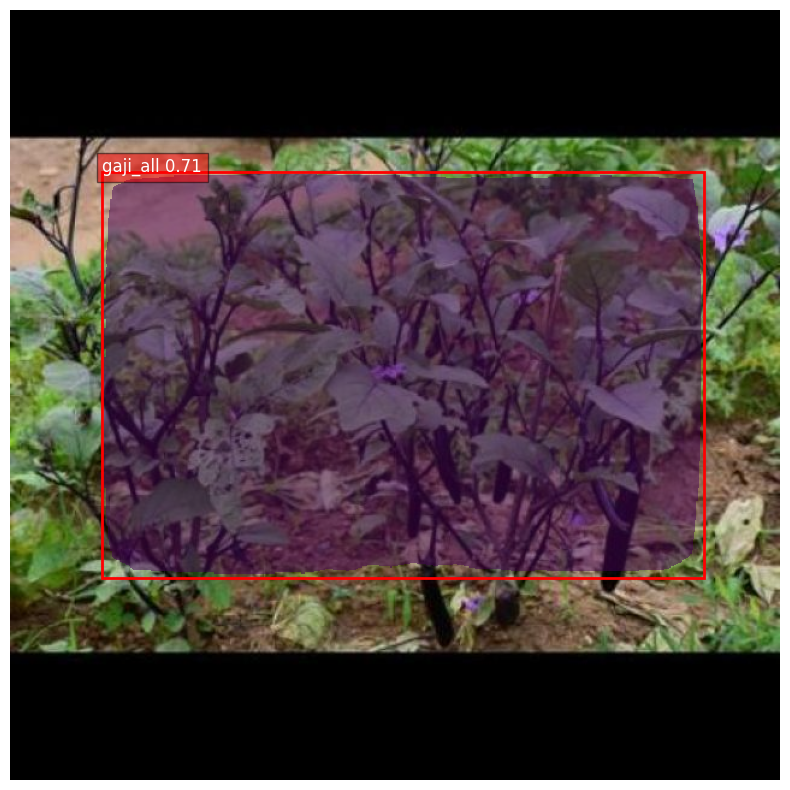

박스 수: 1, 라벨 수: 1, 마스크 수: 1
score_threshold 이후 남은 박스 수: 1
score_threshold 이후 남은 점수: tensor([0.9954], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.9954], device='cuda:0')


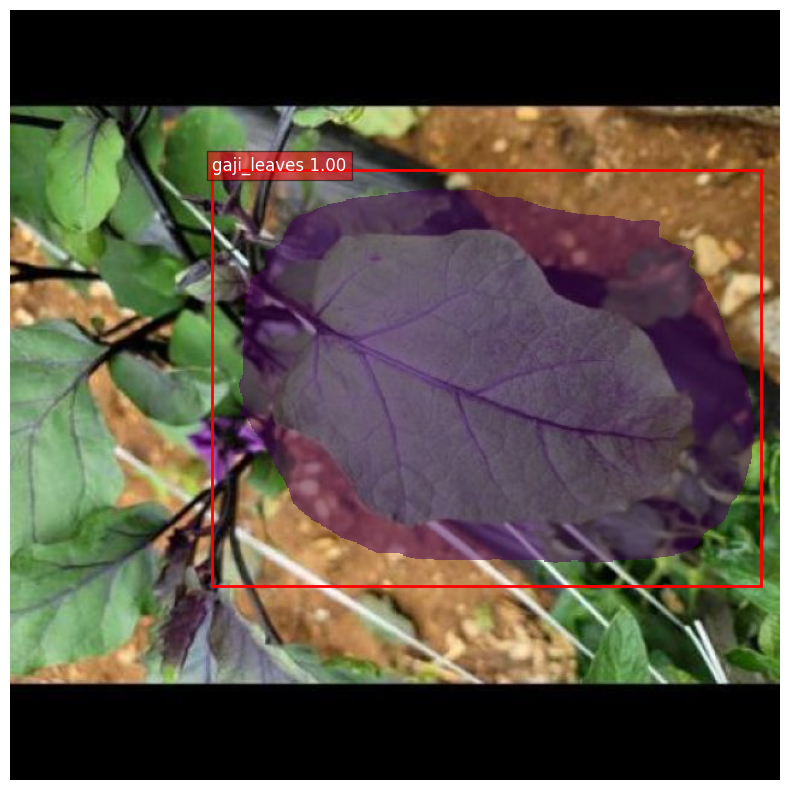

박스 수: 1, 라벨 수: 1, 마스크 수: 1
score_threshold 이후 남은 박스 수: 8
score_threshold 이후 남은 점수: tensor([0.9843, 0.9778, 0.9620, 0.9298, 0.9195, 0.8863, 0.8399, 0.7553],
       device='cuda:0')
NMS 이후 남은 박스 수: 8
NMS 적용된 바운딩 박스 수: 8
NMS 적용된 점수: tensor([0.9843, 0.9778, 0.9620, 0.9298, 0.9195, 0.8863, 0.8399, 0.7553],
       device='cuda:0')


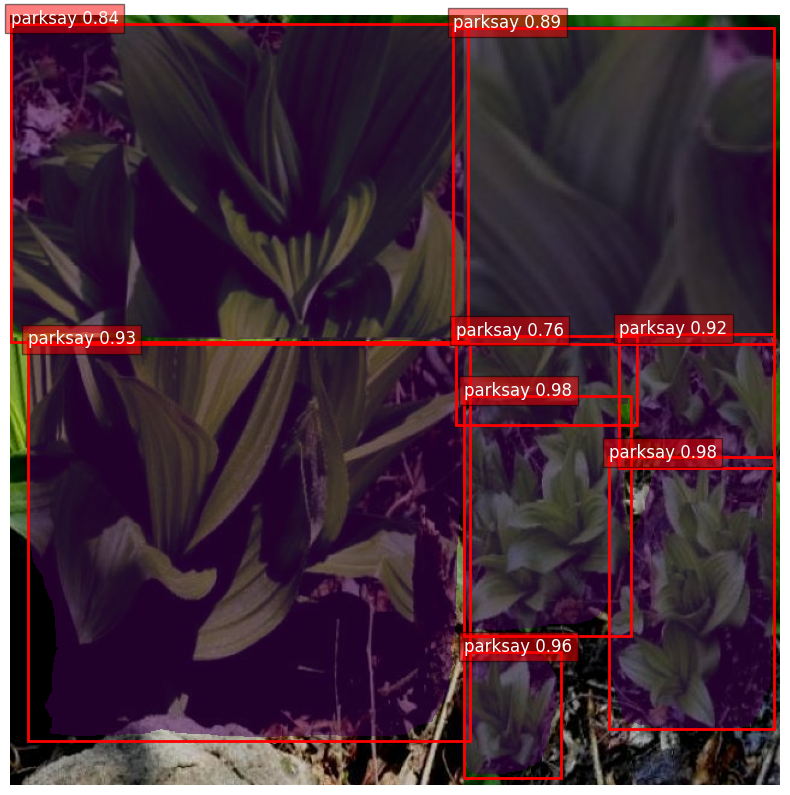

박스 수: 8, 라벨 수: 8, 마스크 수: 8
score_threshold 이후 남은 박스 수: 1
score_threshold 이후 남은 점수: tensor([0.7934], device='cuda:0')
NMS 이후 남은 박스 수: 1
NMS 적용된 바운딩 박스 수: 1
NMS 적용된 점수: tensor([0.7934], device='cuda:0')


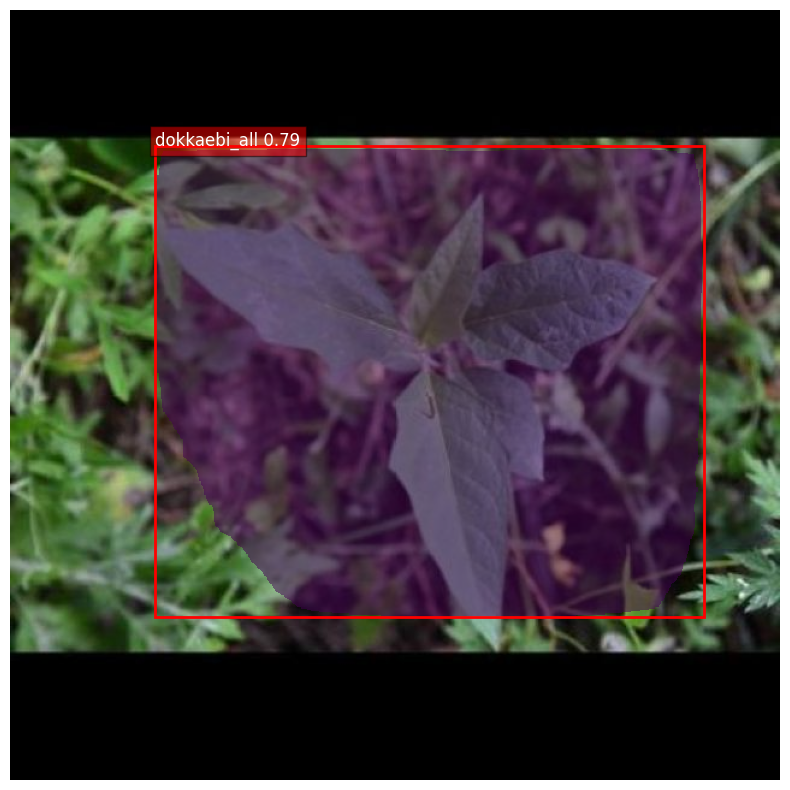

박스 수: 1, 라벨 수: 1, 마스크 수: 1


In [ ]:
#위에서 ram 부족해서 아직 못돌림
model.eval()
with torch.no_grad():
    for imgs, _ in test_loader:
        imgs = [img.to(device) for img in imgs]
        predictions = model(imgs)

        # 각 이미지에 대해 NMS 적용 및 시각화
        for i in range(4):
            nms_boxes, nms_scores, nms_labels, nms_masks = apply_nms(predictions[i], iou_threshold=0.5, score_threshold=0.6)

            # 카테고리 딕셔너리: {id -> name} 형태로 제공
            categories = {k: v for k, v in test_dataset.categories.items()}

            # 시각화 함수 호출
            visualize_prediction_with_nms(imgs[i], nms_boxes, nms_masks, nms_labels, nms_scores, categories)

        break  # 첫 번째 배치의 5개 이미지만 시각화 후 종료



In [ ]:
# 7. Test 평가에서 mAP, Recall, Precision 계산 (COCO API 사용 안 함)
from sklearn.metrics import precision_recall_fscore_support

def evaluate_model(test_loader, model, device):
    all_preds = []
    all_gts = []

    model.eval()
    with torch.no_grad():
        for imgs, targets in tqdm(test_loader):
            imgs = [img.to(device) for img in imgs]
            predictions = model(imgs)

            for i, output in enumerate(predictions):
                pred_boxes = output['boxes'].cpu().numpy()
                pred_labels = output['labels'].cpu().numpy()

                gt_boxes = targets[i]['boxes'].cpu().numpy()
                gt_labels = targets[i]['labels'].cpu().numpy()

                # Check for and handle 'unknown' labels
                valid_preds = [pred for pred in pred_labels if pred != 'unknown'] # remove 'unknown' labels
                valid_gts = [gt for gt in gt_labels if gt != 'unknown'] # remove 'unknown' labels

                # Ensure predictions and ground truths have the same length
                min_len = min(len(valid_preds), len(valid_gts))
                valid_preds = valid_preds[:min_len]
                valid_gts = valid_gts[:min_len]


                all_preds.extend(valid_preds) # append each image's predictions as a list
                all_gts.extend(valid_gts) # append each image's ground truths as a list

    # Flatten the lists before calculating metrics
    #all_preds = [p for sublist in all_preds for p in sublist]
    #all_gts = [g for sublist in all_gts for g in sublist]

    precision, recall, f1, _ = precision_recall_fscore_support(all_gts, all_preds, average='macro',zero_division=1)
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

    return precision, recall, f1

precision, recall, f1 = evaluate_model(test_loader, model, device)

100%|██████████| 97/97 [00:28<00:00,  3.38it/s]

Precision: 0.6976, Recall: 0.6555, F1 Score: 0.6743


###정답과 test pred 같이 나오게 - iou threshold=0.6, score threshold: 0.6

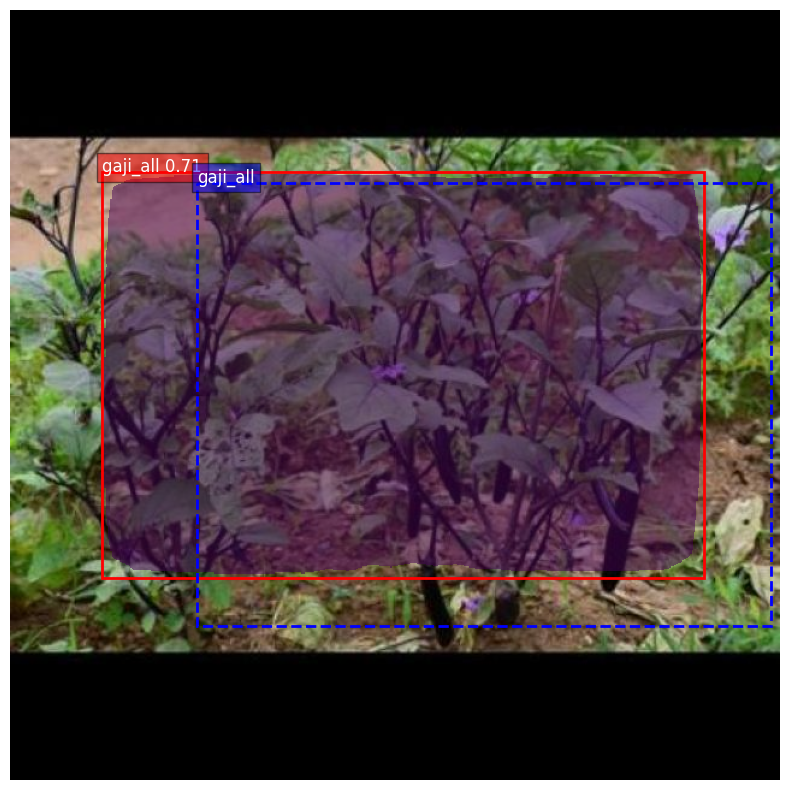

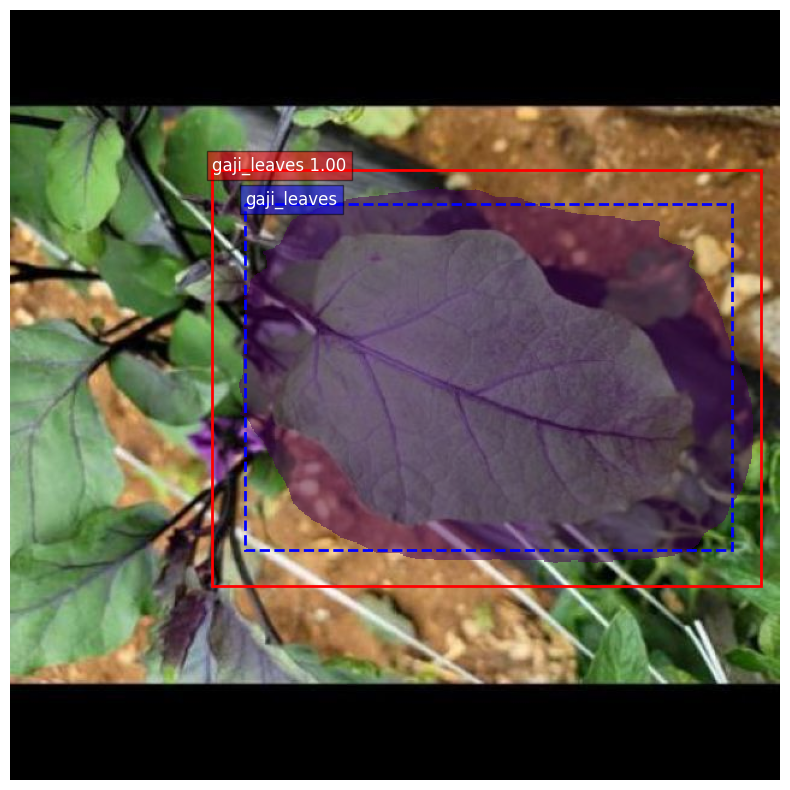

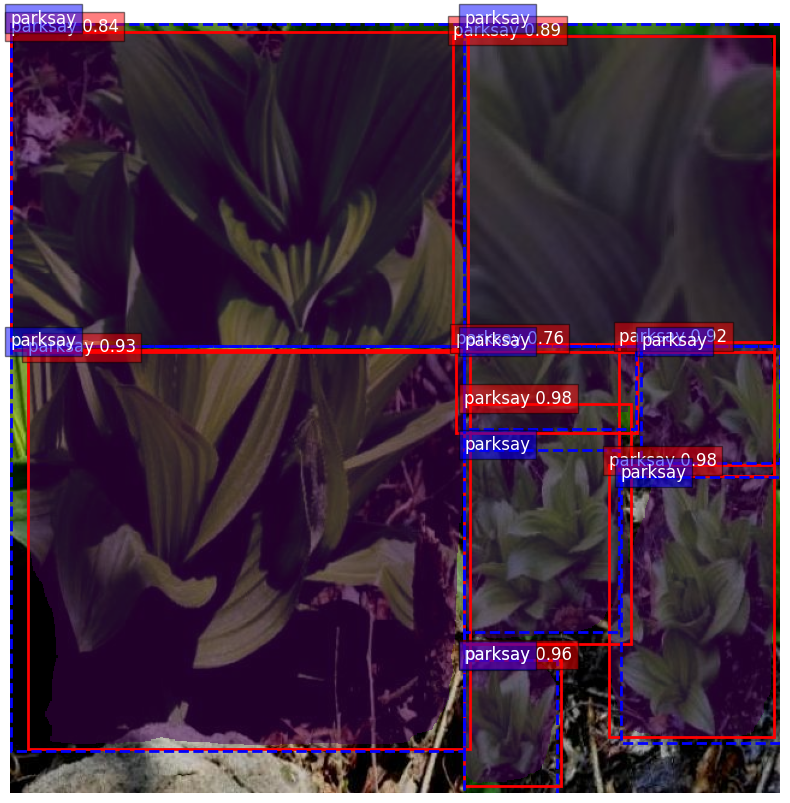

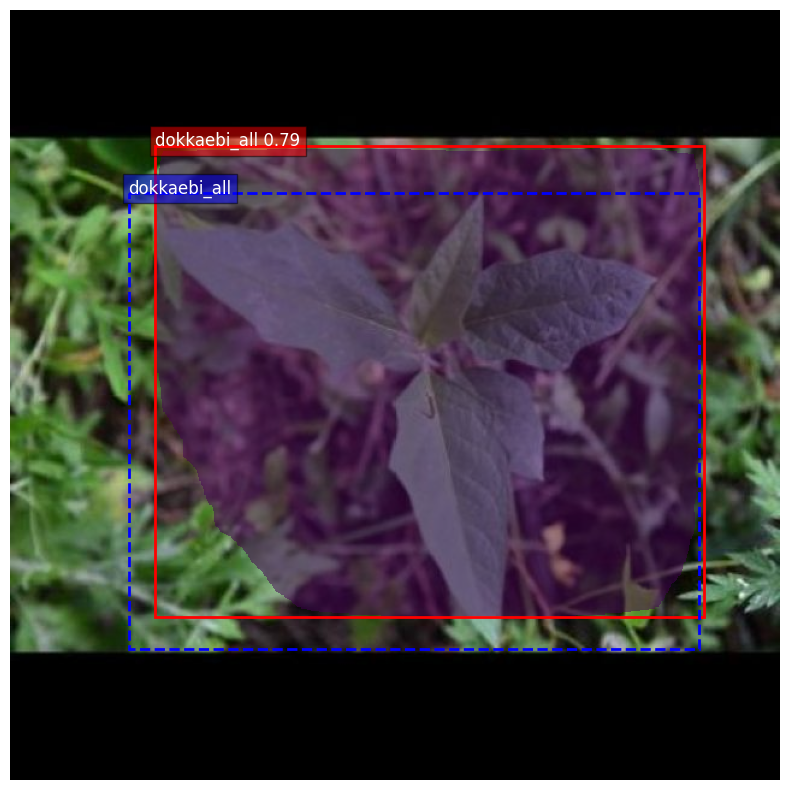

In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from matplotlib.patches import Polygon

def apply_nms(prediction, iou_threshold=0.6, score_threshold=0.6):
    """
    NMS 적용 함수
    """
    keep = torch.ops.torchvision.nms(prediction['boxes'], prediction['scores'], iou_threshold)
    keep = keep[prediction['scores'][keep] > score_threshold]  # score_threshold 적용
    nms_boxes = prediction['boxes'][keep]
    nms_scores = prediction['scores'][keep]
    nms_labels = prediction['labels'][keep]
    nms_masks = prediction['masks'][keep] if 'masks' in prediction else None
    return nms_boxes, nms_scores, nms_labels, nms_masks

def visualize_prediction_with_nms(image, boxes, masks, labels, scores, categories, target_boxes, target_masks, target_labels, threshold=0.6):
    """
    NMS가 적용된 예측 결과와 정답을 시각화하는 함수
    Args:
        image: 입력 이미지 (torch.Tensor, [C, H, W])
        boxes: 예측된 바운딩 박스 좌표 (torch.Tensor, [N, 4])
        masks: 예측된 마스크 (torch.Tensor, [N, H, W])
        labels: 예측된 클래스 라벨 (torch.Tensor, [N])
        scores: 예측된 점수 (torch.Tensor, [N])
        categories: 클래스 이름을 포함한 카테고리 딕셔너리 (id -> name)
        target_boxes: 정답 바운딩 박스 좌표 (torch.Tensor, [M, 4])
        target_masks: 정답 마스크 (torch.Tensor, [M, H, W])
        target_labels: 정답 클래스 라벨 (torch.Tensor, [M])
        threshold: 시각화할 최소 점수 임계값 (기본값은 0.5)
    """
    img_np = image.permute(1, 2, 0).cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(img_np)

    # 마스크를 하나로 합치기 위한 빈 배열 생성
    merged_mask = np.zeros_like(img_np[:, :, 0])

    # 예측 결과 시각화
    for box, mask, label, score in zip(boxes, masks, labels, scores):
        if score >= threshold:  # 점수가 임계값 이상인 경우만 표시
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            mask_np = mask.squeeze(0).cpu().numpy()
            binary_mask = mask_np > 0.5
            merged_mask = np.logical_or(merged_mask, binary_mask)

            class_name = categories.get(label.item(), 'Unknown')
            ax.text(x1, y1, f'{class_name} {score:.2f}', color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    # 정답 시각화 (파란색으로 표시)
    for box, label in zip(target_boxes, target_labels):
        x1, y1, x2, y2 = box.cpu().numpy()
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='blue', facecolor='none', linestyle='dashed')
        ax.add_patch(rect)

        class_name = categories.get(label.item(), 'Unknown')
        ax.text(x1, y1, f'{class_name}', color='white', fontsize=12, bbox=dict(facecolor='blue', alpha=0.5))

    plt.imshow(np.ma.masked_where(merged_mask == False, merged_mask), cmap='viridis', alpha=0.5)
    plt.axis('off')
    plt.show()

# 모델 평가 코드
model.eval()
with torch.no_grad():
    for imgs, targets in test_loader:
        imgs = [img.to(device) for img in imgs]
        predictions = model(imgs)

        # 각 이미지에 대해 NMS 적용 및 시각화
        for i in range(4):  # 첫 4개 이미지에 대해 시각화
            # 예측 결과
            nms_boxes, nms_scores, nms_labels, nms_masks = apply_nms(predictions[i], iou_threshold=0.6, score_threshold=0.6)

            # 정답 데이터
            target_boxes = targets[i]['boxes'].to(device)
            target_masks = targets[i]['masks'].to(device)
            target_labels = targets[i]['labels'].to(device)

            # 카테고리 이름 딕셔너리
            categories = {k: v for k, v in test_dataset.categories.items()}

            # 시각화 함수 호출 (예측 결과와 정답 함께 표시)
            visualize_prediction_with_nms(imgs[i], nms_boxes, nms_masks, nms_labels, nms_scores, categories, target_boxes, target_masks, target_labels)

        break  # 첫 번째 배치의 4개 이미지만 시각화 후 종료


###독성 유무 라벨 추가 - mAP계산하다가 ram 끊겨서 못함

In [ ]:
toxic_classes = [
    'Gaeotnamu-Flower', 'Gaeotnamu-Fruit', 'Gaeotnamu-Leaf', 'Gaeotnamu-WholePlant',
    'Dokminari-Flower', 'Dokminari-Fruit', 'Dokminari-Leaf', 'Dokminari-WholePlant',
    'Donguinamul-Flower', 'Donguinamul-Leaf', 'Donguinamul-WholePlant',
    'parksay', 'parksay_flower', 'gasibak_all', 'gasibak_flower', 'gasibak_fruits',
    'gasibak_leaves', 'yeoky_flower', 'yeoky_fruit', 'yeoky_leaf', 'yeoky_total',
    'dakpul_all', 'dakpul_flo', 'dakpul_fruit', 'dakpul_leaf', 'foxpee_all',
    'foxpee_flo', 'foxpee_fruit', 'foxpee_leaf', 'dokkaebi_all', 'dokkaebi_flower',
    'dokkaebi_fruits', 'dokkaebi_leaves', 'yeoro_all', 'yeoro_flower', 'yeoro_fruits',
    'yeoro_leaves', 'poppy_drug', 'weed_leaf'
]

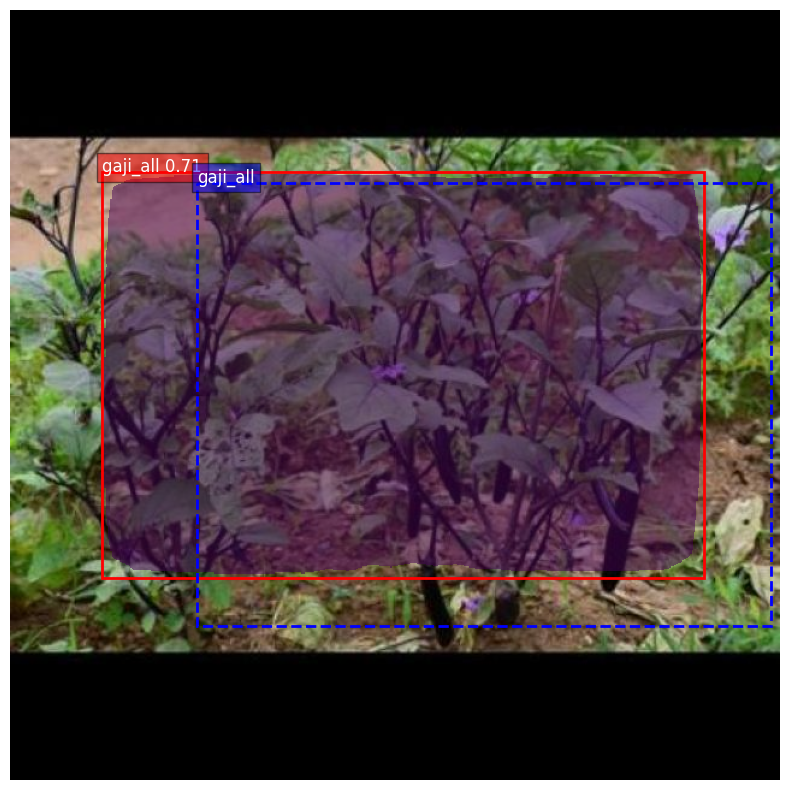

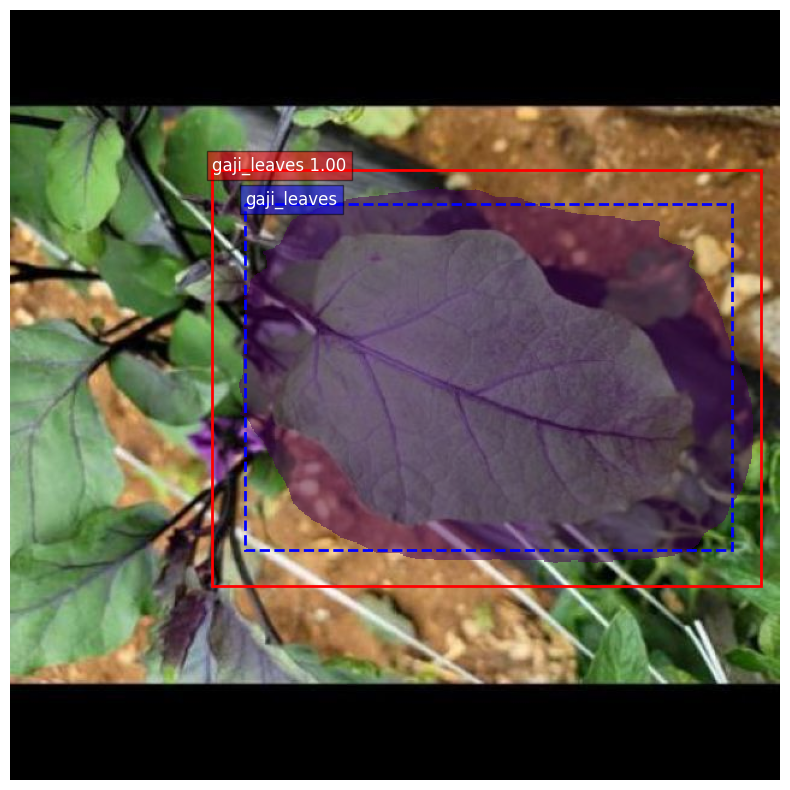

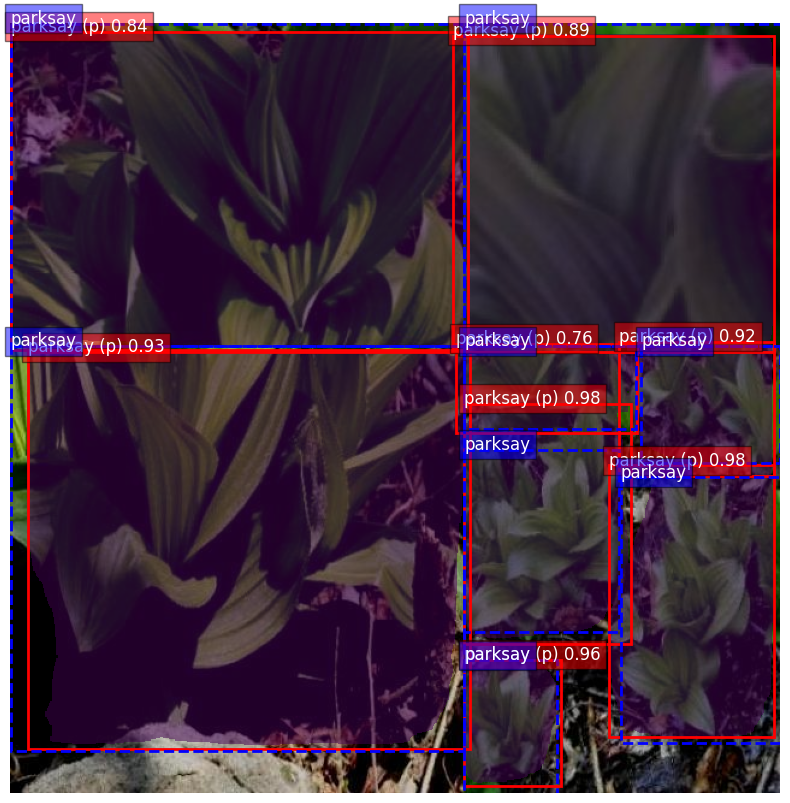

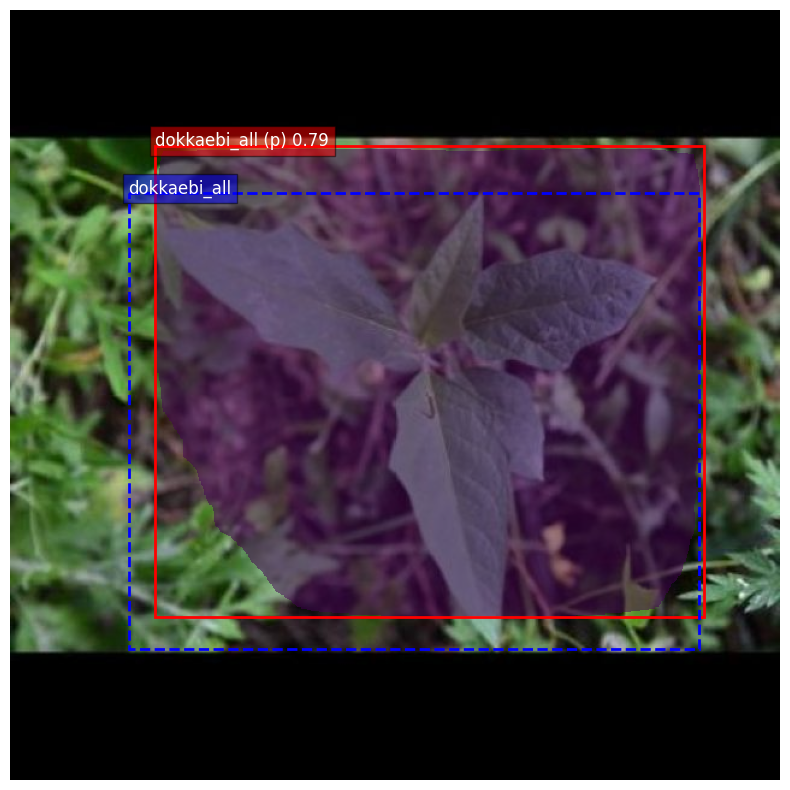

In [ ]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from matplotlib.patches import Polygon

def apply_nms(prediction, iou_threshold=0.5, score_threshold=0.6):
    """
    NMS 적용 함수
    """
    keep = torch.ops.torchvision.nms(prediction['boxes'], prediction['scores'], iou_threshold)
    keep = keep[prediction['scores'][keep] > score_threshold]  # score_threshold 적용
    nms_boxes = prediction['boxes'][keep]
    nms_scores = prediction['scores'][keep]
    nms_labels = prediction['labels'][keep]
    nms_masks = prediction['masks'][keep] if 'masks' in prediction else None
    return nms_boxes, nms_scores, nms_labels, nms_masks

def visualize_prediction_with_nms(image, boxes, masks, labels, scores, categories, target_boxes, target_masks, target_labels, threshold=0.6):
    """
    NMS가 적용된 예측 결과와 정답을 시각화하는 함수
    Args:
        image: 입력 이미지 (torch.Tensor, [C, H, W])
        boxes: 예측된 바운딩 박스 좌표 (torch.Tensor, [N, 4])
        masks: 예측된 마스크 (torch.Tensor, [N, H, W])
        labels: 예측된 클래스 라벨 (torch.Tensor, [N])
        scores: 예측된 점수 (torch.Tensor, [N])
        categories: 클래스 이름을 포함한 카테고리 딕셔너리 (id -> name)
        target_boxes: 정답 바운딩 박스 좌표 (torch.Tensor, [M, 4])
        target_masks: 정답 마스크 (torch.Tensor, [M, H, W])
        target_labels: 정답 클래스 라벨 (torch.Tensor, [M])
        threshold: 시각화할 최소 점수 임계값 (기본값은 0.5)
    """
    img_np = image.permute(1, 2, 0).cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(img_np)

    # 마스크를 하나로 합치기 위한 빈 배열 생성
    merged_mask = np.zeros_like(img_np[:, :, 0])

    # 예측 결과 시각화
    for box, mask, label, score in zip(boxes, masks, labels, scores):
        if score >= threshold:  # 점수가 임계값 이상인 경우만 표시
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            mask_np = mask.squeeze(0).cpu().numpy()
            binary_mask = mask_np > 0.5
            merged_mask = np.logical_or(merged_mask, binary_mask)

            class_name = categories.get(label.item(), 'Unknown')
            # 독성 식물일 경우 "(p)" 추가
            if class_name in toxic_classes:
                class_name += " (p)"

            ax.text(x1, y1, f'{class_name} {score:.2f}', color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    # 정답 시각화 (파란색으로 표시)
    for box, label in zip(target_boxes, target_labels):
        x1, y1, x2, y2 = box.cpu().numpy()
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='blue', facecolor='none', linestyle='dashed')
        ax.add_patch(rect)

        class_name = categories.get(label.item(), 'Unknown')
        ax.text(x1, y1, f'{class_name}', color='white', fontsize=12, bbox=dict(facecolor='blue', alpha=0.5))

    plt.imshow(np.ma.masked_where(merged_mask == False, merged_mask), cmap='viridis', alpha=0.5)
    plt.axis('off')
    plt.show()

# 모델 평가 코드
model.eval()
with torch.no_grad():
    for imgs, targets in test_loader:
        imgs = [img.to(device) for img in imgs]
        predictions = model(imgs)

        # 각 이미지에 대해 NMS 적용 및 시각화
        for i in range(4):  # 첫 4개 이미지에 대해 시각화

            # 예측 결과
            nms_boxes, nms_scores, nms_labels, nms_masks = apply_nms(predictions[i], iou_threshold=0.5, score_threshold=0.6)

            # 정답 데이터
            target_boxes = targets[i]['boxes'].to(device)
            target_masks = targets[i]['masks'].to(device)
            target_labels = targets[i]['labels'].to(device)

            # 카테고리 이름 딕셔너리
            categories = {k: v for k, v in test_dataset.categories.items()}

            # 시각화 함수 호출 (예측 결과와 정답 함께 표시)
            visualize_prediction_with_nms(imgs[i], nms_boxes, nms_masks, nms_labels, nms_scores, categories, target_boxes, target_masks, target_labels)

        break  # 첫 번째 배치의 4개 이미지만 시각화 후 종료


In [ ]:
from collections import defaultdict

# TP, FP, FN 저장을 위한 딕셔너리
classwise_tp = defaultdict(int)
classwise_fp = defaultdict(int)
classwise_fn = defaultdict(int)

model.eval()
with torch.no_grad():
    for imgs, targets in test_loader:
        imgs = [img.to(device) for img in imgs]
        predictions = model(imgs)

        # NMS 적용
        for i, prediction in enumerate(predictions):
            nms_boxes, nms_scores, nms_labels, nms_masks = apply_nms(prediction, iou_threshold=0.5)

            gt_labels = targets[i]["labels"].cpu().numpy()  # Ground truth labels
            pred_labels = nms_labels.cpu().numpy()  # 예측된 라벨

            for label in set(gt_labels):
                gt_count = sum(gt_labels == label)
                pred_count = sum(pred_labels == label)

                # TP: 예측과 정답이 일치하는 경우
                classwise_tp[label] += min(gt_count, pred_count)

                # FP: 예측했지만 정답이 아닌 경우
                classwise_fp[label] += max(0, pred_count - gt_count)

                # FN: 정답인데 예측하지 못한 경우
                classwise_fn[label] += max(0, gt_count - pred_count)

# 클래스별 Precision, Recall, F1 Score 계산
for label in classwise_tp:
    precision = classwise_tp[label] / (classwise_tp[label] + classwise_fp[label] + 1e-6)
    recall = classwise_tp[label] / (classwise_tp[label] + classwise_fn[label] + 1e-6)
    f1 = 2 * (precision * recall) / (precision + recall + 1e-6)

    class_name = categories.get(label, 'Unknown')  # 클래스 이름 가져오기
    print(f"Class: {class_name}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")


Class: gaji_all, Precision: 0.8571, Recall: 0.7500, F1 Score: 0.8000
Class: gaji_leaves, Precision: 0.9286, Recall: 0.9286, F1 Score: 0.9286
Class: parksay, Precision: 0.9320, Recall: 0.8727, F1 Score: 0.9014
Class: dokkaebi_all, Precision: 1.0000, Recall: 0.8750, F1 Score: 0.9333
Class: wonchuri_fruits, Precision: 0.8571, Recall: 0.8571, F1 Score: 0.8571
Class: wonchuri_leaves, Precision: 0.7778, Recall: 0.8974, F1 Score: 0.8333
Class: foxpee_all, Precision: 0.8000, Recall: 0.2353, F1 Score: 0.3636
Class: geayeoky_fruit, Precision: 0.8889, Recall: 0.6154, F1 Score: 0.7273
Class: gasibak_fruits, Precision: 1.0000, Recall: 0.8889, F1 Score: 0.9412
Class: eojeogui_fruit, Precision: 0.8947, Recall: 0.7083, F1 Score: 0.7907
Class: dambaeful_total, Precision: 1.0000, Recall: 0.4000, F1 Score: 0.5714
Class: dakpul_leaf, Precision: 0.5714, Recall: 0.8000, F1 Score: 0.6667
Class: Dokminari-Fruit, Precision: 0.7083, Recall: 0.7083, F1 Score: 0.7083
Class: foxpee_leaf, Precision: 0.9333, Recall:

####진짜 ram 얼마 있어야 돌아가는거야? a100 ram도 실패

In [ ]:
#14. inference 속도 측정
import time

def measure_inference_speed(model, dataloader):
    model.eval()  # 모델을 평가 모드로 설정
    total_time = 0.0
    with torch.no_grad():
        for imgs, _ in dataloader:
            imgs = [img.to(device) for img in imgs]
            start_time = time.time()
            _ = model(imgs)  # 예측 수행
            end_time = time.time()
            total_time += (end_time - start_time)

    avg_time_per_image = total_time / len(dataloader.dataset)
    print(f"Average Inference Time per Image: {avg_time_per_image:.4f} seconds")

# Test Loader에 대한 Inference 속도 측정
measure_inference_speed(model, test_loader)

Average Inference Time per Image: 0.0316 seconds


In [ ]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import torch
import numpy as np

In [ ]:
from pycocotools.cocoeval import COCOeval

# Convert predictions to COCO format
def convert_to_coco_format(predictions, pred_img_ids):
    coco_results = []
    for idx, prediction in enumerate(predictions):
        boxes = prediction['boxes'].cpu().numpy()
        scores = prediction['scores'].cpu().numpy()
        labels = prediction['labels'].cpu().numpy()
        masks = prediction['masks'].cpu().numpy()

        # For each box, mask, etc., format into COCO style
        for i in range(len(boxes)):
            result = {
                'image_id': pred_img_ids[idx],
                'category_id': int(labels[i]),
                'bbox': boxes[i].tolist(),
                'score': float(scores[i]),
                'segmentation': masks[i].tolist(),  # Add segmentation if relevant
            }
            coco_results.append(result)

    return coco_results

# Perform evaluation
def evaluate_model_with_segmentation(model, test_loader, coco_true):
    pred_img_ids = []
    coco_results = []

    model.eval()
    with torch.no_grad():
        for imgs, targets in tqdm(test_loader):
            imgs = [img.to(device) for img in imgs]

            # Predict
            predictions = model(imgs)

            # Extract image_ids and prepare predictions in COCO format
            for idx, target in enumerate(targets):
                image_id = target['image_id'].item()
                pred_img_ids.append(image_id)
                coco_results.extend(convert_to_coco_format([predictions[idx]], [image_id]))

    # Load predictions into COCO API and evaluate
    coco_pred = coco_true.loadRes(coco_results)
    coco_eval = COCOeval(coco_true, coco_pred, iouType='segm')  # or 'bbox' for bounding box evaluation
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

# COCO annotation file and test loader
coco_true = COCO('/content/dataset/test/_annotations.coco.json')
evaluate_model_with_segmentation(model, test_loader, coco_true)


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


 15%|█▌        | 15/97 [01:01<05:36,  4.10s/it]